# **IMPORTS:**

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
!pip install dalex -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.6.0-py3-none-any.whl size=1045995 sha256=1c26dae3f84074acbc997dc8e5170e1fa18dc89f2c14033e866c5b8d77f8dcc5
  Stored in directory: /root/.cache/pip/wheels/c8/45/19/f5810bf7c5ff9a476ebd89bb5b81a18ffcdf93931d17dbb0c1
Successfully built dalex


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=6b5baf3cb2843a4b43f7ba59404fe70594ad6f1f7f5ad680fa8aeb28d237909c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
#imports necesarios
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import statsmodels.api as sm
import dalex as dx
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, RocCurveDisplay

# **Dataset preprocesado:**

In [ ]:
#carga del dataset
data=pd.read_csv("/content/drive/MyDrive/TFM/Merge/python_data.csv")
label=pd.read_csv("/content/drive/MyDrive/TFM/Merge/python_label.csv")
#file_path_data = r'D:\Descargas\merge conflict\python_data.csv'
#file_path_label = r'D:\Descargas\merge conflict\python_label.csv'
#data = pd.read_csv(file_path_data)
#label= pd.read_csv(file_path_label)

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
data.head() #comprobar el dataframe

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median
0,2.0,22.0,-5.0,0.0,0.0,-40.0,0.0,-307.0,-59.0,-5.0,67.0,-20.0,12.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,15.0,147.0,43.272727,32.5
1,0.0,1.0,0.0,0.0,0.0,4.0,0.0,6.0,6.0,1.0,-47.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,62.0,62.0,62.000000,62.0
2,2.0,53.0,-8.0,-3.0,0.0,-53.0,0.0,-1363.0,-915.0,-5.0,42.0,-47.0,4.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,2.0,0.0,3.0,20.0,179.0,45.904762,42.0
3,1.0,658.0,-363.0,-24.0,0.0,-2960.0,0.0,-148399.0,-40793.0,-134.0,58.0,-656.0,4.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,1.0,0.0,1.0,26.0,72.0,48.350000,47.0
4,0.0,1.0,0.0,0.0,0.0,1.0,0.0,6.0,1.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39.0,39.0,39.000000,39.0


In [ ]:
label.head()

,is_conflict
0,1
1,0
2,1
3,0
4,0


In [ ]:
#comprobar si existen valores null o ?
print("¿Existen valores nulos en los datos?:", data.isnull().values.any())
print("¿Existen valores  '?'  en los datos?:", (data == '?').values.any())
print("¿Existen valores nulos en las etiquetas?:", label.isnull().values.any())
print("¿Existen valores  '?'  en las etiquetas?:", (label == '?').values.any())

¿Existen valores nulos en los datos?: False
¿Existen valores  '?'  en los datos?: False
¿Existen valores nulos en las etiquetas?: False
¿Existen valores  '?'  en las etiquetas?: False


In [ ]:
print(data.shape)
print(label.shape)

#obtener lista de atributos sin la variable dependiente
feature_names=list(data)
print(feature_names)
print(list(label))

(49453, 28)
(49453, 1)
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_renamed', 'file_modified', 'file_copied', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']
['is_conflict']


In [ ]:
# Calcular la frecuencia de cada clase
num_clases = label['is_conflict'].value_counts()
print(num_clases)

0    45925
1     3528
Name: is_conflict, dtype: int64


In [ ]:
# Combinamos los datos con las etiquetas en un solo df
df = pd.concat([data, label], axis=1)

In [ ]:
df.head()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
0,2.0,22.0,-5.0,0.0,0.0,-40.0,0.0,-307.0,-59.0,-5.0,67.0,-20.0,12.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,15.0,147.0,43.272727,32.5,1
1,0.0,1.0,0.0,0.0,0.0,4.0,0.0,6.0,6.0,1.0,-47.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,62.0,62.0,62.000000,62.0,0
2,2.0,53.0,-8.0,-3.0,0.0,-53.0,0.0,-1363.0,-915.0,-5.0,42.0,-47.0,4.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,0.0,2.0,0.0,3.0,20.0,179.0,45.904762,42.0,1
3,1.0,658.0,-363.0,-24.0,0.0,-2960.0,0.0,-148399.0,-40793.0,-134.0,58.0,-656.0,4.0,0.0,0.0,0.0,0.0,1.0,4.0,0.0,0.0,1.0,0.0,1.0,26.0,72.0,48.350000,47.0,0
4,0.0,1.0,0.0,0.0,0.0,1.0,0.0,6.0,1.0,1.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39.0,39.0,39.000000,39.0,0


In [ ]:
df.info() #comprobar el tipo de variables y su cantidad. Parece que no hay ninguna variable objeto

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49453 entries, 0 to 49452
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   parallel_changed_file_num  49453 non-null  float64
 1   commit_num                 49453 non-null  float64
 2   file_added                 49453 non-null  float64
 3   file_removed               49453 non-null  float64
 4   file_renamed               49453 non-null  float64
 5   file_modified              49453 non-null  float64
 6   file_copied                49453 non-null  float64
 7   line_added                 49453 non-null  float64
 8   line_removed               49453 non-null  float64
 9   developer_num              49453 non-null  float64
 10  duration                   49453 non-null  float64
 11  commit_density             49453 non-null  float64
 12  add_frequency              49453 non-null  float64
 13  bug_frequency              49453 non-null  flo

In [ ]:
df.describe() #obtener algunas estadísitcas de cada atributo

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
count,49453.000000,49453.000000,49453.000000,49453.000000,49453.0,49453.000000,49453.0,4.945300e+04,4.945300e+04,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.00000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000
mean,0.880311,41.720603,-16.817281,-5.699149,0.0,-105.740076,0.0,-6.862031e+03,-4.156877e+03,-1.803794,24.547126,-48.520919,1.296827,0.224617,0.333225,0.040604,0.108548,0.089074,1.566760,0.103068,0.091359,0.406629,0.628051,0.57402,29.061210,81.301984,49.351622,47.107152,0.071340
std,14.533061,240.650365,738.865177,490.652204,0.0,1703.913017,0.0,1.895161e+05,1.247356e+05,14.338557,927.544691,701.310634,1.865025,0.673701,0.796561,0.253682,0.440905,0.486463,2.092096,0.414629,0.449982,0.906648,1.362629,1.14609,25.235239,56.269010,25.968885,25.646838,0.257395
min,0.000000,1.000000,-21598.000000,-15158.000000,0.0,-144179.000000,0.0,-9.691102e+06,-4.979595e+06,-895.000000,-33187.000000,-43637.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,-2.000000,0.000000,0.0,-23.000000,0.0,-4.270000e+02,-1.730000e+02,-2.000000,-24.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,15.000000,49.000000,37.000000,35.000000,0.000000
50%,0.000000,6.000000,0.000000,0.000000,0.0,0.000000,0.0,1.000000e+00,0.000000e+00,0.000000,-1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,23.000000,69.000000,45.904762,45.000000,0.000000
75%,0.000000,22.000000,0.000000,0.000000,0.0,3.000000,0.0,3.500000e+01,1.300000e+01,1.000000,12.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.00000,37.000000,94.000000,55.833333,53.500000,0.000000
max,2328.000000,19787.000000,72916.000000,53222.000000,0.0,54702.000000,0.0,1.311992e+07,9.413449e+06,313.000000,25171.000000,6363.000000,19.000000,13.000000,24.000000,9.000000,12.000000,14.000000,19.000000,11.000000,12.000000,20.000000,38.000000,23.00000,401.000000,418.000000,401.000000,401.000000,1.000000


In [ ]:
# Parece que file_renamed y file_copied tienen el mismo valor siempre. Vamos a comprobarlo
val_renamed = df['file_renamed'].value_counts()
val_copied = df['file_copied'].value_counts()
print("Para file_renamed:\n", val_renamed)
print("Para file_copied:\n", val_copied)
columnas_constantes = df.columns[df.describe().loc['std'] == 0].tolist()
columnas_constantes

Para file_renamed:
 0.0    49453
Name: file_renamed, dtype: int64
Para file_copied:
 0.0    49453
Name: file_copied, dtype: int64


['file_renamed', 'file_copied']

In [ ]:
# Al ser caracteristicas constantes decido eliminarlas
df=df.drop('file_renamed', axis=1)
df=df.drop('file_copied', axis=1)

In [ ]:
# Actualizamos los nombres de las caracteristicas
feature_names=list(df)
feature_names.remove('is_conflict')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']


In [ ]:
correlation_matrix=df.corr()
print(correlation_matrix) #coeficientes de correlación

                           parallel_changed_file_num  commit_num  file_added  \
parallel_changed_file_num                   1.000000    0.080127    0.015866   
commit_num                                  0.080127    1.000000   -0.183980   
file_added                                  0.015866   -0.183980    1.000000   
file_removed                                0.032528   -0.066603    0.826018   
file_modified                              -0.013333   -0.569325    0.324409   
line_added                                  0.035826   -0.337319    0.828806   
line_removed                                0.065041   -0.243147    0.727378   
developer_num                              -0.013754   -0.735676    0.232030   
duration                                    0.000672    0.069313   -0.035942   
commit_density                              0.001247    0.000953    0.000488   
add_frequency                               0.000274    0.007692    0.003724   
bug_frequency                           

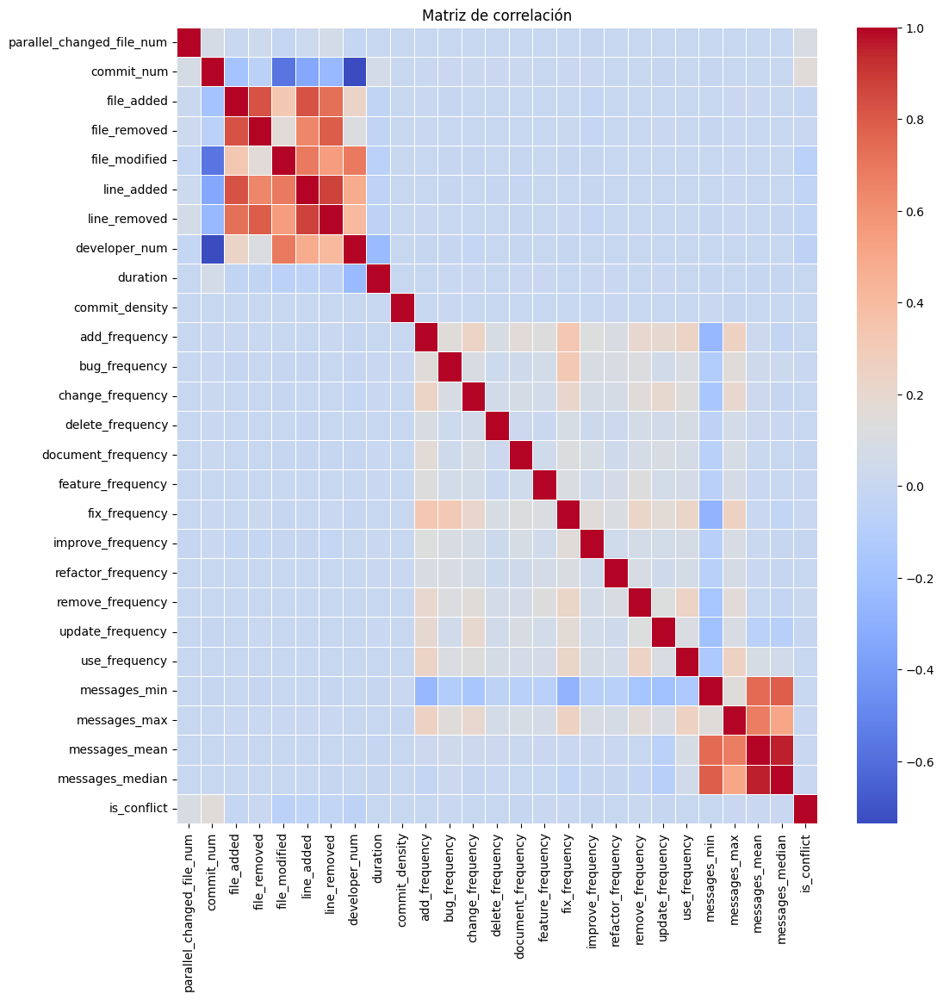

In [ ]:
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", annot_kws={"size": 7}, linewidths=0.5)
plt.title("Matriz de correlación")
plt.show()

In [ ]:
#Pares de atributos con correlación superior a 0.80
high_correlation_pairs = []
atributos = []

#Recorre la matriz de correlación y verifica los valores
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.80:
            attribute_pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(attribute_pair)

# Imprime los pares de atributos con correlación superior a 0.80 y crear una lista de atributos sin repetir
for pair in high_correlation_pairs:
    print("Correlación alta entre: ", pair[0], "y", pair[1])
    atributos.extend(pair)

# Eliminar duplicados y mantener el orden
atributos = list(dict.fromkeys(atributos))

# Imprimir la lista de atributos
print("Lista de atributos con correlación alta: ", atributos)

Correlación alta entre:  file_added y file_removed
Correlación alta entre:  file_added y line_added
Correlación alta entre:  line_added y line_removed
Correlación alta entre:  messages_mean y messages_median
Lista de atributos con correlación alta:  ['file_added', 'file_removed', 'line_added', 'line_removed', 'messages_mean', 'messages_median']


**VALIDACIÓN CRUZADA PARA COMPROBAR EL EFECTO DE LOS PARÁMETROS:**

In [ ]:
# Defino los algoritmos base para evaluar
rf = RandomForestClassifier(random_state=42)
gb = GradientBoostingClassifier(random_state=42)
ada = AdaBoostClassifier(random_state=42)
brf = BalancedRandomForestClassifier(random_state=42)
rus = RUSBoostClassifier(random_state=42)
modelos=[rf, brf, gb, ada, rus]

In [ ]:
for i in atributos:
  print("\n##########################################################################################################")
  print("\nPARA EL ATRIBUTO: ", i)

  # Preparando los datos
  X=df[feature_names]
  Y=df['is_conflict']

  x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)
  x_train_sin=x_train.drop(i, axis=1)

  for j in modelos:
    # Realizar validación cruzada con y sin el atributo con alta correlación:
    # Con el atributo
    cv_scores_con = cross_val_score(j, x_train, y_train, cv=10, scoring='accuracy')

    # Sin el atributo
    cv_scores_sin = cross_val_score(j, x_train_sin, y_train, cv=10, scoring='accuracy')

    # Calcular el estadístico t y el p-valor
    t_statistic, p_value = ttest_rel(cv_scores_con, cv_scores_sin)

    # Mostrar los resultados
    print("-------------------------------------------------------------------------------------------------------------")
    print("El modelo: ", j)
    print("Valor de validación cruzada (con atributo):", cv_scores_con)
    print("Valor de validación cruzada (sin atributo):", cv_scores_sin)
    print("Valor medio con atributo es: ", np.mean(cv_scores_con), "\nEl valor medio sin atributo es: ", np.mean(cv_scores_sin))
    if np.mean(cv_scores_con) > np.mean(cv_scores_sin):
      print("El atributo mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))
    else:
      print("El atributo no mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))

    print("Estadístico t:", t_statistic)
    print("p-valor:", p_value)


##########################################################################################################

PARA EL ATRIBUTO:  messages_mean
-------------------------------------------------------------------------------------------------------------
El modelo:  RandomForestClassifier()
Valor de validación cruzada (con atributo): [0.93703062 0.94367418 0.94367418 0.94454073 0.94569613 0.94194107
 0.94482958 0.94308003 0.94423577 0.94221323]
Valor de validación cruzada (sin atributo): [0.93818602 0.94511843 0.94165222 0.94338533 0.94656268 0.94338533
 0.94569613 0.94539151 0.94568044 0.94076856]
Valor medio con atributo es:  0.9430915519652757 
El valor medio sin atributo es:  0.9435826643705523
El atributo no mejora el desempeño del modelo, con una diferencia de:  -0.0004911124052765503
Estadístico t: -1.054082729288996
p-valor: 0.3193198360146674
-------------------------------------------------------------------------------------------------------------
El modelo:  DecisionTreeClass

In [ ]:
# Elimina los atributos con demasiada correlación y menor relevancia que su par
feature_names.remove('messages_mean')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_median']


In [ ]:
from google.colab.data_table import DataTable
DataTable.max_columns = 30

df_display=df.drop("messages_mean", axis=1)
df_display.describe()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_modified,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_median,is_conflict
count,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,4.945300e+04,4.945300e+04,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.000000,49453.00000,49453.000000,49453.000000,49453.000000,49453.000000
mean,0.880311,41.720603,-16.817281,-5.699149,-105.740076,-6.862031e+03,-4.156877e+03,-1.803794,24.547126,-48.520919,1.296827,0.224617,0.333225,0.040604,0.108548,0.089074,1.566760,0.103068,0.091359,0.406629,0.628051,0.57402,29.061210,81.301984,47.107152,0.071340
std,14.533061,240.650365,738.865177,490.652204,1703.913017,1.895161e+05,1.247356e+05,14.338557,927.544691,701.310634,1.865025,0.673701,0.796561,0.253682,0.440905,0.486463,2.092096,0.414629,0.449982,0.906648,1.362629,1.14609,25.235239,56.269010,25.646838,0.257395
min,0.000000,1.000000,-21598.000000,-15158.000000,-144179.000000,-9.691102e+06,-4.979595e+06,-895.000000,-33187.000000,-43637.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,-2.000000,0.000000,-23.000000,-4.270000e+02,-1.730000e+02,-2.000000,-24.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,15.000000,49.000000,35.000000,0.000000
50%,0.000000,6.000000,0.000000,0.000000,0.000000,1.000000e+00,0.000000e+00,0.000000,-1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,23.000000,69.000000,45.000000,0.000000
75%,0.000000,22.000000,0.000000,0.000000,3.000000,3.500000e+01,1.300000e+01,1.000000,12.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.00000,37.000000,94.000000,53.500000,0.000000
max,2328.000000,19787.000000,72916.000000,53222.000000,54702.000000,1.311992e+07,9.413449e+06,313.000000,25171.000000,6363.000000,19.000000,13.000000,24.000000,9.000000,12.000000,14.000000,19.000000,11.000000,12.000000,20.000000,38.000000,23.00000,401.000000,418.000000,401.000000,1.000000


In [ ]:
# Tomar los valores de la variable dependiente (y) y las independientes (x)
X=df[feature_names]
Y=df['is_conflict']

In [ ]:
#dividir en conjunto de entrenamiento y test 70%-30%
x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)

In [ ]:
# Comprobar la division de clases
num_train=pd.Series(y_train).value_counts()
num_test=pd.Series(y_test).value_counts()
porc_train=pd.Series(y_train).value_counts(normalize=True)
porc_test=pd.Series(y_test).value_counts(normalize=True)
comparacion = pd.DataFrame({'% Train': porc_train, 'Num Train': num_train, '% Test': porc_test,'Num Test': num_test})
print(comparacion)

    % Train  Num Train    % Test  Num Test
0  0.928648      32147  0.928687     13778
1  0.071352       2470  0.071313      1058


# **Algoritmos:**

### **RandomForest:**

In [ ]:
modelo=RandomForestClassifier(random_state=42, class_weight='balanced')
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 900 candidates, totalling 9000 fits


GridSearchCV(cv=10,
             estimator=RandomForestClassifier(class_weight='balanced',
                                              random_state=42),
             param_grid={'max_depth': [1, 3, 5, 10, 20, 30],
                         'min_samples_leaf': [1, 3, 5, 10, 20],
                         'min_samples_split': [2, 3, 5, 10, 20],
                         'n_estimators': [10, 25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'max_depth': 30, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 100}
RandomForestClassifier(class_weight='balanced', max_depth=30,
                       min_samples_leaf=5, random_state=42)
0.5887365228751845


In [ ]:
rf = RandomForestClassifier(class_weight='balanced', max_depth=30, min_samples_leaf=5, random_state=42)

In [ ]:
modelo_rf=rf.fit(x_train,y_train)

In [ ]:
y_pred_rf = modelo_rf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rf.squeeze()})
print(df_pred)

       Actual  Predicted
47920       0          0
14131       0          0
24678       0          0
8829        0          0
5292        0          0
...       ...        ...
26059       0          0
23928       0          0
9592        0          0
13787       0          0
33455       0          0

[14836 rows x 2 columns]


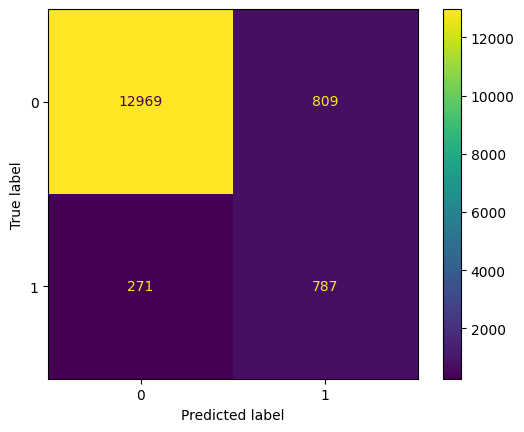

In [ ]:
# Matriz de confusion
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_display = ConfusionMatrixDisplay(cm_rf).plot()

In [ ]:
# Calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9272040981396603
Recall: 0.7438563327032136
Precision: 0.4931077694235589
F1-score: 0.5930670685757347


In [ ]:
modelo_rf.score(x_test, y_test)

0.9272040981396603

In [ ]:
modelo_rf.score(x_train, y_train)

0.9660571395557096

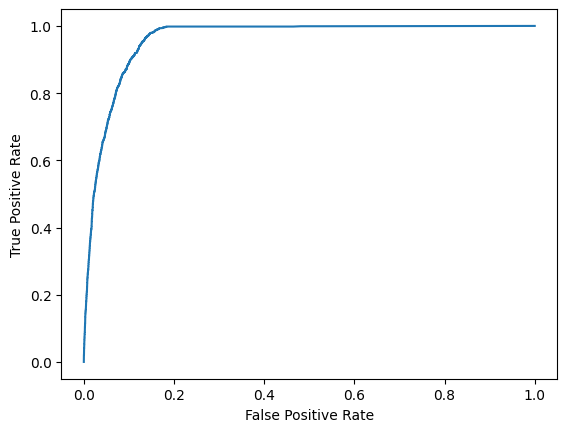

In [ ]:
# AUROC
y_score = modelo_rf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9594699201296497

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rf_inv = 1 - y_pred_rf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
47920,0,0
14131,0,0
24678,0,0
8829,0,0
5292,0,0
30098,0,0
39745,0,0
22822,0,0
42922,0,0
17061,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rf_inv)
recall_inv = recall_score(y_test_inv, y_pred_rf_inv)
precision_inv = precision_score(y_test_inv, y_pred_rf_inv)
f1_inv = f1_score(y_test_inv, y_pred_rf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9272040981396603
Recall: 0.941283205109595
Precision: 0.9795317220543807
F1-score: 0.9600266489007329


In [ ]:
score_inv_result={"Modelo":["RandomForest"],"Accuracy":[accuracy_inv], "Precision":[precision_inv], "Recall":[recall_inv], "F1-score":[f1_inv]}
score_inv_result=pd.DataFrame(score_inv_result)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rf= RandomForestClassifier(class_weight='balanced', max_depth=30, min_samples_leaf=5, random_state=42)
    cv_rf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9265
CV Precision: 0.4903
CV Recall: 0.7441
CV F1-Score: 0.5908


In [ ]:
cv_results = cross_validate(rf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.92640518 0.91953093 0.92943793 0.92416582 0.92922144 0.9223458
 0.92618807 0.92800809 0.92881699 0.93063701] 
 Con una media de:  0.9264757254997044
Precision:
 [0.4904014  0.46031746 0.50371747 0.47924528 0.50291262 0.47256637
 0.48841699 0.49701789 0.5        0.50847458] 
 Con una media de:  0.49030700619887957
Recall:
 [0.79603399 0.73937677 0.76770538 0.71954674 0.73371105 0.75637394
 0.71671388 0.7082153  0.73579545 0.76704545] 
 Con una media de:  0.7440517962915273
F1-score:
 [0.60691145 0.5673913  0.60830527 0.57531144 0.59677419 0.58169935
 0.58094145 0.58411215 0.5954023  0.61155153] 
 Con una media de:  0.5908400428511408


In [ ]:
score_result={"Modelo":["RandomForest"],"Accuracy":[np.mean(cv_results['test_accuracy'])], "Precision":[np.mean(cv_results['test_precision'])], "Recall":[np.mean(cv_results['test_recall'])], "F1-score":[np.mean(cv_results['test_f1'])]}
score_result=pd.DataFrame(score_result)

### **BalancedRandomForest:**

In [ ]:
modelo=BalancedRandomForestClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30],'class_weight':[None,'balanced']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'class_weight': 'balanced', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10}
BalancedRandomForestClassifier(class_weight='balanced', n_estimators=10,
                               random_state=42)
0.4889622388024657


In [ ]:
brf = BalancedRandomForestClassifier(class_weight='balanced', n_estimators=10,random_state=42)

In [ ]:
modelo_brf=brf.fit(x_train,y_train)

In [ ]:
y_pred_brf = modelo_brf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_brf.squeeze()})
print(df_pred)

       Actual  Predicted
47920       0          1
14131       0          0
24678       0          0
8829        0          0
5292        0          1
...       ...        ...
26059       0          0
23928       0          0
9592        0          0
13787       0          0
33455       0          1

[14836 rows x 2 columns]


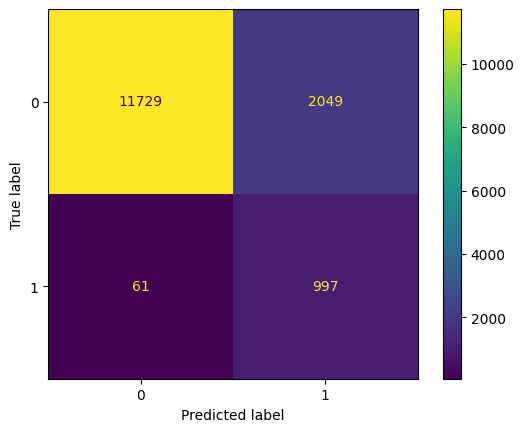

In [ ]:
# Matriz de confusion
cm_brf = confusion_matrix(y_test, y_pred_brf)
cm_display = ConfusionMatrixDisplay(cm_brf).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_brf)
recall = recall_score(y_test, y_pred_brf)
precision = precision_score(y_test, y_pred_brf)
f1 = f1_score(y_test, y_pred_brf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.857778376921003
Recall: 0.94234404536862
Precision: 0.3273145108338805
F1-score: 0.4858674463937621


In [ ]:
modelo_brf.score(x_test, y_test)

0.857778376921003

In [ ]:
modelo_brf.score(x_train, y_train)

0.8716237686685733

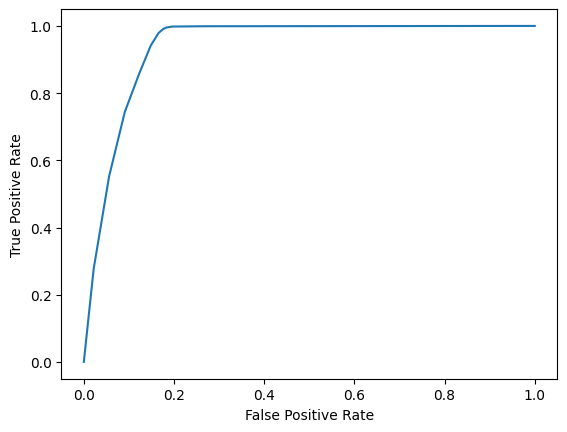

In [ ]:
# AUROC
y_score = modelo_brf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_brf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9385853135364698

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_brf_inv = 1 - y_pred_brf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_brf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
47920,0,1
14131,0,0
24678,0,0
8829,0,0
5292,0,1
30098,0,1
39745,0,0
22822,0,0
42922,0,0
17061,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,0
1,1,1
2,1,1
3,1,1
4,1,0
5,1,0
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_brf_inv)
recall_inv = recall_score(y_test_inv, y_pred_brf_inv)
precision_inv = precision_score(y_test_inv, y_pred_brf_inv)
f1_inv = f1_score(y_test_inv, y_pred_brf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.857778376921003
Recall: 0.8512846566990855
Precision: 0.9948261238337575
F1-score: 0.9174749687108886


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"BalancedRF","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_brf= BalancedRandomForestClassifier(class_weight='balanced', n_estimators=10,random_state=42)
    cv_brf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_brf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.8641
CV Precision: 0.3363
CV Recall: 0.9286
CV F1-Score: 0.4937


In [ ]:
cv_results = cross_validate(brf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.86595228 0.85382127 0.86918722 0.86370071 0.86754297 0.86006067
 0.86471183 0.86976744 0.86066734 0.8653185 ] 
 Con una media de:  0.8640730240490114
Precision:
 [0.33921162 0.32211538 0.34526316 0.33639144 0.3407173  0.33100698
 0.33438155 0.34304207 0.33166833 0.3394683 ] 
 Con una media de:  0.3363266133604035
Recall:
 [0.92634561 0.9490085  0.92917847 0.93484419 0.91501416 0.94050992
 0.90368272 0.90084986 0.94318182 0.94318182] 
 Con una media de:  0.9285797064125676
F1-score:
 [0.49658314 0.48097631 0.50345357 0.49475262 0.49654112 0.48967552
 0.48814078 0.496875   0.49076127 0.49924812] 
 Con una media de:  0.493700745640667


In [ ]:
score_result=score_result.append({"Modelo":"BalancedRF","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **GradientBoosting:**

In [ ]:
modelo=GradientBoostingClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

In [ ]:
gb = GradientBoostingClassifier(max_depth=10, min_samples_leaf=10, n_estimators=200, random_state=42)

In [ ]:
modelo_gb=gb.fit(x_train,y_train)

In [ ]:
y_pred_gb = modelo_gb.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_gb.squeeze()})
print(df_pred)

       Actual  Predicted
47920       0          0
14131       0          0
24678       0          0
8829        0          0
5292        0          0
...       ...        ...
26059       0          0
23928       0          0
9592        0          0
13787       0          0
33455       0          0

[14836 rows x 2 columns]


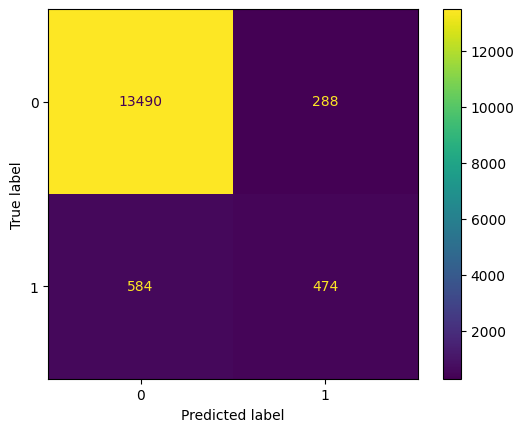

In [ ]:
# Matriz de confusion
cm_gb = confusion_matrix(y_test, y_pred_gb)
cm_display = ConfusionMatrixDisplay(cm_gb).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_gb)
recall = recall_score(y_test, y_pred_gb)
precision = precision_score(y_test, y_pred_gb)
f1 = f1_score(y_test, y_pred_gb)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.941224049609059
Recall: 0.44801512287334594
Precision: 0.6220472440944882
F1-score: 0.5208791208791209


In [ ]:
modelo_gb.score(x_test, y_test)

0.941224049609059

In [ ]:
modelo_gb.score(x_train, y_train)

0.9980067596845481

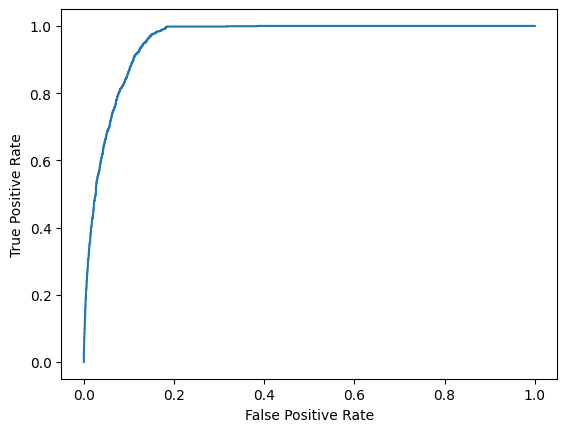

In [ ]:
# AUROC
y_score = modelo_gb.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_gb.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9574271989454162

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_gb_inv = 1 - y_pred_gb
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_gb_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
47920,0,0
14131,0,0
24678,0,0
8829,0,0
5292,0,0
30098,0,0
39745,0,0
22822,0,0
42922,0,0
17061,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_gb_inv)
recall_inv = recall_score(y_test_inv, y_pred_gb_inv)
precision_inv = precision_score(y_test_inv, y_pred_gb_inv)
f1_inv = f1_score(y_test_inv, y_pred_gb_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.941224049609059
Recall: 0.9790971113369139
Precision: 0.9585050447633935
F1-score: 0.9686916558954474


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"GradientBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_gb= GradientBoostingClassifier(max_depth=10, min_samples_leaf=10, n_estimators=200, random_state=42)
    cv_gb.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_gb.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9429
CV Precision: 0.6400
CV Recall: 0.4569
CV F1-Score: 0.5327


In [ ]:
cv_results = cross_validate(gb, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.94541043 0.94197331 0.94439951 0.94175935 0.94438827 0.94054601
 0.94236603 0.94236603 0.93993933 0.94560162] 
 Con una media de:  0.9428749892161943
Precision:
 [0.65201465 0.62222222 0.65725806 0.6419214  0.66115702 0.60885609
 0.62977099 0.64166667 0.61044177 0.67510549] 
 Con una media de:  0.640041436082061
Recall:
 [0.50424929 0.47592068 0.46175637 0.41643059 0.45325779 0.4674221
 0.4674221  0.43626062 0.43181818 0.45454545] 
 Con una media de:  0.45690831831058454
F1-score:
 [0.5686901  0.53932584 0.54242928 0.50515464 0.53781513 0.52884615
 0.53658537 0.51939292 0.50582363 0.54329372] 
 Con una media de:  0.5327356770818101


In [ ]:
score_result=score_result.append({"Modelo":"GradientBoosting","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **AdaBoosting:**

In [ ]:
modelo=AdaBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200],'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0], 'algorithm':['SAMME','SAMME.R']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 72 candidates, totalling 720 fits


GridSearchCV(cv=10, estimator=AdaBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4,
                                           1.6, 1.8, 2.0, 3.0, 5.0],
                         'n_estimators': [25, 50, 75, 100, 200, 300]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'learning_rate': 1.2, 'n_estimators': 200}
AdaBoostClassifier(learning_rate=1.2, n_estimators=200, random_state=42)
0.4953036438005647


In [ ]:
ada=AdaBoostClassifier(learning_rate=1.2, n_estimators=200, random_state=42)

In [ ]:
modelo_ada=ada.fit(x_train,y_train)

In [ ]:
y_pred_ada = modelo_ada.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_ada.squeeze()})
print(df_pred)

       Actual  Predicted
47920       0          0
14131       0          0
24678       0          0
8829        0          0
5292        0          0
...       ...        ...
26059       0          0
23928       0          0
9592        0          0
13787       0          0
33455       0          0

[14836 rows x 2 columns]


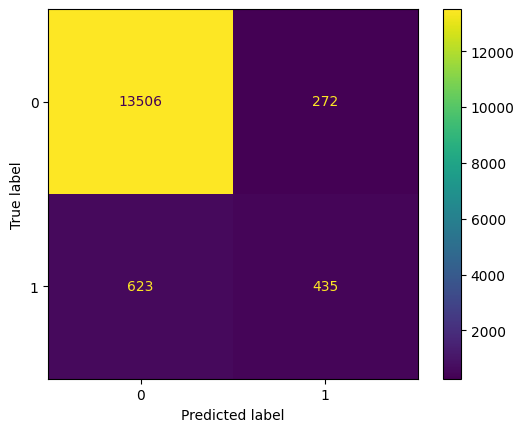

In [ ]:
# Matriz de confusion
cm_ada = confusion_matrix(y_test, y_pred_ada)
cm_display = ConfusionMatrixDisplay(cm_ada).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_ada)
recall = recall_score(y_test, y_pred_ada)
precision = precision_score(y_test, y_pred_ada)
f1 = f1_score(y_test, y_pred_ada)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9396737665138851
Recall: 0.4111531190926276
Precision: 0.6152758132956153
F1-score: 0.49291784702549574


In [ ]:
modelo_ada.score(x_test, y_test)

0.9396737665138851

In [ ]:
modelo_ada.score(x_train, y_train)

0.9453158852586879

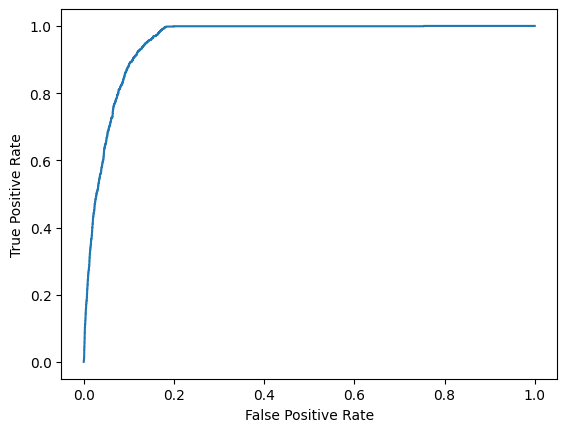

In [ ]:
# AUROC
y_score = modelo_ada.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_ada.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9558065774840085

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_ada_inv = 1 - y_pred_ada
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_ada_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
47920,0,0
14131,0,0
24678,0,0
8829,0,0
5292,0,0
30098,0,0
39745,0,0
22822,0,0
42922,0,0
17061,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_ada_inv)
recall_inv = recall_score(y_test_inv, y_pred_ada_inv)
precision_inv = precision_score(y_test_inv, y_pred_ada_inv)
f1_inv = f1_score(y_test_inv, y_pred_ada_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9396737665138851
Recall: 0.9802583829293076
Precision: 0.9559062920234978
F1-score: 0.9679291933923387


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"AdaBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_ada= AdaBoostClassifier(learning_rate=1.2, n_estimators=200, random_state=42)
    cv_ada.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_ada.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9397
CV Precision: 0.6172
CV Recall: 0.4062
CV F1-Score: 0.4895


In [ ]:
cv_results = cross_validate(ada, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.94237768 0.93894056 0.94015366 0.93953488 0.9413549  0.93832154
 0.93993933 0.93751264 0.93771486 0.94074823] 
 Con una media de:  0.9396598286775232
Precision:
 [0.62878788 0.60944206 0.63768116 0.61946903 0.63755459 0.59836066
 0.62389381 0.5990991  0.59649123 0.62139918] 
 Con una media de:  0.6172178675166963
Recall:
 [0.47025496 0.40226629 0.37393768 0.39660057 0.41359773 0.41359773
 0.39943343 0.37677054 0.38636364 0.42897727] 
 Con una media de:  0.4061799832603657
F1-score:
 [0.53808752 0.48464164 0.47142857 0.4835924  0.50171821 0.48911223
 0.48704663 0.4626087  0.46896552 0.50756303] 
 Con una media de:  0.48947644416960967


In [ ]:
score_result=score_result.append({"Modelo":"AdaBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **RUSBoost:**

In [ ]:
modelo=RUSBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200], 'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0], 'algorithm':['SAMME','SAMME.R'],'replacement':[False, True]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 84 candidates, totalling 840 fits


GridSearchCV(cv=10, estimator=RUSBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4,
                                           1.6, 1.8, 2.0, 3.0, 5.0],
                         'n_estimators': [5, 10, 25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'learning_rate': 1.6, 'n_estimators': 10}
RUSBoostClassifier(learning_rate=1.6, n_estimators=10, random_state=42)
0.48459809550308763


In [ ]:
rus =RUSBoostClassifier(learning_rate=1.6, n_estimators=10, random_state=42, replacement=False, algorithm='SAMME.R')

In [ ]:
modelo_rus=rus.fit(x_train,y_train)

In [ ]:
y_pred_rus = modelo_rus.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rus.squeeze()})
print(df_pred)

       Actual  Predicted
47920       0          1
14131       0          0
24678       0          0
8829        0          0
5292        0          1
...       ...        ...
26059       0          0
23928       0          0
9592        0          0
13787       0          0
33455       0          0

[14836 rows x 2 columns]


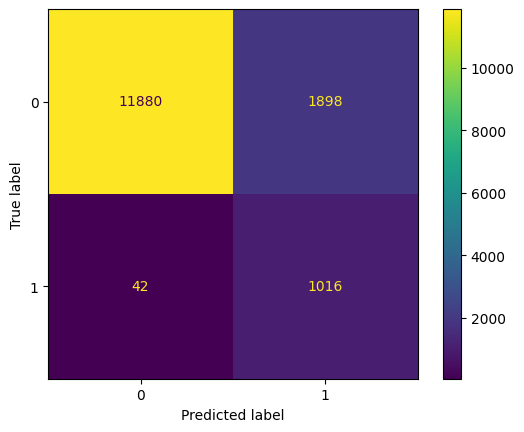

In [ ]:
# Matriz de confusion
cm_rus = confusion_matrix(y_test, y_pred_rus)
cm_display = ConfusionMatrixDisplay(cm_rus).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rus)
recall = recall_score(y_test, y_pred_rus)
precision = precision_score(y_test, y_pred_rus)
f1 = f1_score(y_test, y_pred_rus)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.8692369911027231
Recall: 0.9603024574669187
Precision: 0.34866163349347973
F1-score: 0.5115810674723061


In [ ]:
modelo_rus.score(x_test, y_test)

0.8692369911027231

In [ ]:
modelo_rus.score(x_train, y_train)

0.8660773608342722

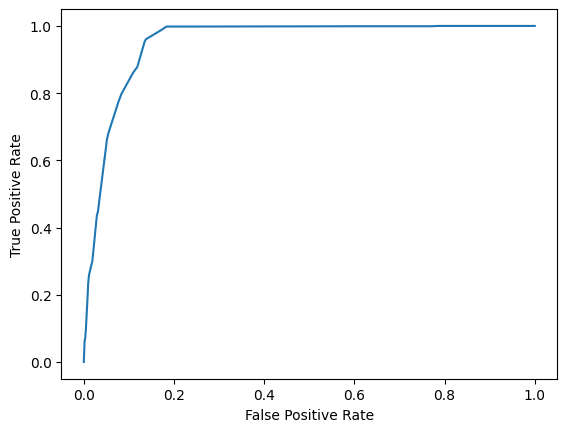

In [ ]:
# AUROC
y_score = modelo_rus.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rus.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9507249166570855

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rus_inv = 1 - y_pred_rus
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rus_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
47920,0,1
14131,0,0
24678,0,0
8829,0,0
5292,0,1
30098,0,1
39745,0,0
22822,0,0
42922,0,0
17061,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,1,0
1,1,1
2,1,1
3,1,1
4,1,0
5,1,0
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rus_inv)
recall_inv = recall_score(y_test_inv, y_pred_rus_inv)
precision_inv = precision_score(y_test_inv, y_pred_rus_inv)
f1_inv = f1_score(y_test_inv, y_pred_rus_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.8692369911027231
Recall: 0.8622441573523008
Precision: 0.9964771011575239
F1-score: 0.9245136186770427


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"RUSBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rus= RUSBoostClassifier(learning_rate=1.6, n_estimators=10, random_state=42)
    cv_rus.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rus.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.8570
CV Precision: 0.3294
CV Recall: 0.9595
CV F1-Score: 0.4900


In [ ]:
cv_results = cross_validate(rus, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.85402345 0.85503437 0.87201779 0.85561173 0.8570273  0.84914055
 0.84105157 0.87704752 0.87057634 0.83862487] 
 Con una media de:  0.8570155495325247
Precision:
 [0.32511848 0.32330097 0.35324948 0.32660903 0.32848837 0.3172093
 0.30755556 0.35911602 0.34968685 0.30404218] 
 Con una media de:  0.3294376238890788
Recall:
 [0.97167139 0.94334278 0.95467422 0.9631728  0.96033994 0.96600567
 0.98016997 0.92067989 0.95170455 0.98295455] 
 Con una media de:  0.9594715748132886
F1-score:
 [0.48721591 0.48156182 0.51568477 0.48780488 0.48953069 0.47759104
 0.46820027 0.51669316 0.51145038 0.46442953] 
 Con una media de:  0.49001624521616327


In [ ]:
score_result=score_result.append({"Modelo":"RUSBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

# **Instancias comunes:**

In [ ]:
# Crear un DataFrame con las predicciones de cada modelo y la etiqueta real
pred_modelos_df = pd.DataFrame({
    'RandomForest': y_pred_rf,
    'BalancedRF': y_pred_brf,
    'GradientBoost': y_pred_gb,
    'AdaBoost': y_pred_ada,
    'RUSBoost': y_pred_rus,
    'Etiqueta': y_test
})

In [ ]:
pred_modelos_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
47920,0,1,0,0,1,0
14131,0,0,0,0,0,0
24678,0,0,0,0,0,0
8829,0,0,0,0,0,0
5292,0,1,0,0,1,0
...,...,...,...,...,...,...
26059,0,0,0,0,0,0
23928,0,0,0,0,0,0
9592,0,0,0,0,0,0
13787,0,0,0,0,0,0


In [ ]:
# Filtrar las instancias que tienen valor 1 en todas las columnas de los modelos
filtro_1 = pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].all(axis=1)

# Filtrar las instancias que tienen valor 0 en todas las columnas de los modelos
filtro_0 = (~pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].any(axis=1)) & (~filtro_1)

# Aplicar los filtros al DataFrame de las predicciones
df_comunes = pred_modelos_df[filtro_1 | filtro_0]

In [ ]:
df_comunes

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
14131,0,0,0,0,0,0
24678,0,0,0,0,0,0
8829,0,0,0,0,0,0
39745,0,0,0,0,0,0
22822,0,0,0,0,0,0
...,...,...,...,...,...,...
32187,0,0,0,0,0,0
26059,0,0,0,0,0,0
23928,0,0,0,0,0,0
9592,0,0,0,0,0,0


In [ ]:
# Filtrar las instancias que son Verdadero Positivo
vp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 1)]

# Filtrar las instancias que son Verdadero Negativo
vn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Positivo
fp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Negativo
fn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 1)]


In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
15085,1,1,1,1,1,1
11537,1,1,1,1,1,1
49075,1,1,1,1,1,1
1068,1,1,1,1,1,1
47231,1,1,1,1,1,1
...,...,...,...,...,...,...
13371,1,1,1,1,1,1
7450,1,1,1,1,1,1
31947,1,1,1,1,1,1
43850,1,1,1,1,1,1


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
14131,0,0,0,0,0,0
24678,0,0,0,0,0,0
8829,0,0,0,0,0,0
39745,0,0,0,0,0,0
22822,0,0,0,0,0,0
...,...,...,...,...,...,...
32187,0,0,0,0,0,0
26059,0,0,0,0,0,0
23928,0,0,0,0,0,0
9592,0,0,0,0,0,0


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
25436,1,1,1,1,1,0
32069,1,1,1,1,1,0
36047,1,1,1,1,1,0
8624,1,1,1,1,1,0
21719,1,1,1,1,1,0
...,...,...,...,...,...,...
10837,1,1,1,1,1,0
24846,1,1,1,1,1,0
25654,1,1,1,1,1,0
21264,1,1,1,1,1,0


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
9330,0,0,0,0,0,1
32446,0,0,0,0,0,1
12118,0,0,0,0,0,1
44690,0,0,0,0,0,1
41255,0,0,0,0,0,1
9925,0,0,0,0,0,1
48386,0,0,0,0,0,1
22557,0,0,0,0,0,1
7334,0,0,0,0,0,1
43987,0,0,0,0,0,1


In [ ]:
indices_vp = vp_df.index.tolist()
indices_vn = vn_df.index.tolist()
indices_fp = fp_df.index.tolist()
indices_fn = fn_df.index.tolist()

In [ ]:
vp_instancias = x_test.loc[indices_vp]
vn_instancias = x_test.loc[indices_vn]
fp_instancias = x_test.loc[indices_fp]
fn_instancias = x_test.loc[indices_fn]

**VALOR DE PREDICCION INSTANCIAS COMUNES:**

In [ ]:
# Valor de la predicciones para RandomForest
valor_pred_rf_vp = modelo_rf.predict_proba(vp_instancias)
valor_pred_rf_vn = modelo_rf.predict_proba(vn_instancias)
valor_pred_rf_fp = modelo_rf.predict_proba(fp_instancias)
valor_pred_rf_fn = modelo_rf.predict_proba(fn_instancias)

proba_rf_vp = valor_pred_rf_vp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los verdaderos positivos
proba_rf_vn = valor_pred_rf_vn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los verdaderos negativos
proba_rf_fp = valor_pred_rf_fp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los falsos positivos
proba_rf_fn = valor_pred_rf_fn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los falsos negativos

proba_rf_vp = pd.Series(proba_rf_vp, index=vp_df.index) # transformamos en series de pandas
proba_rf_vn = pd.Series(proba_rf_vn, index=vn_df.index)
proba_rf_fp = pd.Series(proba_rf_fp, index=fp_df.index)
proba_rf_fn = pd.Series(proba_rf_fn, index=fn_df.index)

vp_df['RF V.Pred'] = proba_rf_vp # añadir los valores a los dataframe
vn_df['RF V.Pred'] = proba_rf_vn
fp_df['RF V.Pred'] = proba_rf_fp
fn_df['RF V.Pred'] = proba_rf_fn

# Valor de la predicciones para BalancedRandomForest
valor_pred_brf_vp = modelo_brf.predict_proba(vp_instancias)
valor_pred_brf_vn = modelo_brf.predict_proba(vn_instancias)
valor_pred_brf_fp = modelo_brf.predict_proba(fp_instancias)
valor_pred_brf_fn = modelo_brf.predict_proba(fn_instancias)

proba_brf_vp = valor_pred_brf_vp[:, 1]
proba_brf_vn = valor_pred_brf_vn[:, 0]
proba_brf_fp = valor_pred_brf_fp[:, 1]
proba_brf_fn = valor_pred_brf_fn[:, 0]

proba_brf_vp = pd.Series(proba_brf_vp, index=vp_df.index)
proba_brf_vn = pd.Series(proba_brf_vn, index=vn_df.index)
proba_brf_fp = pd.Series(proba_brf_fp, index=fp_df.index)
proba_brf_fn = pd.Series(proba_brf_fn, index=fn_df.index)

vp_df['BRF V.Pred'] = proba_brf_vp
vn_df['BRF V.Pred'] = proba_brf_vn
fp_df['BRF V.Pred'] = proba_brf_fp
fn_df['BRF V.Pred'] = proba_brf_fn

# Valor de la predicciones para GradientBoosting
valor_pred_gb_vp = modelo_gb.predict_proba(vp_instancias)
valor_pred_gb_vn = modelo_gb.predict_proba(vn_instancias)
valor_pred_gb_fp = modelo_gb.predict_proba(fp_instancias)
valor_pred_gb_fn = modelo_gb.predict_proba(fn_instancias)

proba_gb_vp = valor_pred_gb_vp[:, 1]
proba_gb_vn = valor_pred_gb_vn[:, 0]
proba_gb_fp = valor_pred_gb_fp[:, 1]
proba_gb_fn = valor_pred_gb_fn[:, 0]

proba_gb_vp = pd.Series(proba_gb_vp, index=vp_df.index)
proba_gb_vn = pd.Series(proba_gb_vn, index=vn_df.index)
proba_gb_fp = pd.Series(proba_gb_fp, index=fp_df.index)
proba_gb_fn = pd.Series(proba_gb_fn, index=fn_df.index)

vp_df['GB V.Pred'] = proba_gb_vp
vn_df['GB V.Pred'] = proba_gb_vn
fp_df['GB V.Pred'] = proba_gb_fp
fn_df['GB V.Pred'] = proba_gb_fn

# Valor de la predicciones para AdaBoost
valor_pred_ada_vp = modelo_ada.predict_proba(vp_instancias)
valor_pred_ada_vn = modelo_ada.predict_proba(vn_instancias)
valor_pred_ada_fp = modelo_ada.predict_proba(fp_instancias)
valor_pred_ada_fn = modelo_ada.predict_proba(fn_instancias)

proba_ada_vp = valor_pred_ada_vp[:, 1]
proba_ada_vn = valor_pred_ada_vn[:, 0]
proba_ada_fp = valor_pred_ada_fp[:, 1]
proba_ada_fn = valor_pred_ada_fn[:, 0]

proba_ada_vp = pd.Series(proba_ada_vp, index=vp_df.index)
proba_ada_vn = pd.Series(proba_ada_vn, index=vn_df.index)
proba_ada_fp = pd.Series(proba_ada_fp, index=fp_df.index)
proba_ada_fn = pd.Series(proba_ada_fn, index=fn_df.index)

vp_df['AB V.Pred'] = proba_ada_vp
vn_df['AB V.Pred'] = proba_ada_vn
fp_df['AB V.Pred'] = proba_ada_fp
fn_df['AB V.Pred'] = proba_ada_fn

# Valor de la predicciones para RUSBoos
valor_pred_rus_vp = modelo_rus.predict_proba(vp_instancias)
valor_pred_rus_vn = modelo_rus.predict_proba(vn_instancias)
valor_pred_rus_fp = modelo_rus.predict_proba(fp_instancias)
valor_pred_rus_fn = modelo_rus.predict_proba(fn_instancias)

proba_rus_vp = valor_pred_rus_vp[:, 1]
proba_rus_vn = valor_pred_rus_vn[:, 0]
proba_rus_fp = valor_pred_rus_fp[:, 1]
proba_rus_fn = valor_pred_rus_fn[:, 0]

proba_rus_vp = pd.Series(proba_rus_vp, index=vp_df.index)
proba_rus_vn = pd.Series(proba_rus_vn, index=vn_df.index)
proba_rus_fp = pd.Series(proba_rus_fp, index=fp_df.index)
proba_rus_fn = pd.Series(proba_rus_fn, index=fn_df.index)

vp_df['RB V.Pred'] = proba_rus_vp
vn_df['RB V.Pred'] = proba_rus_vn
fp_df['RB V.Pred'] = proba_rus_fp
fn_df['RB V.Pred'] = proba_rus_fn

In [ ]:
# Cálculo de la media para cada instancia del dataframe
media_vp = vp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vp_df['V.Pred media'] = media_vp

media_vn = vn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vn_df['V.Pred media'] = media_vn

media_fp = fp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fp_df['V.Pred media'] = media_fp

media_fn = fn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fn_df['V.Pred media'] = media_fn

In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
15085,1,1,1,1,1,1,0.691777,0.7,0.530320,0.500592,0.538471,0.592232
11537,1,1,1,1,1,1,0.891978,0.9,0.972713,0.501831,0.560293,0.765363
49075,1,1,1,1,1,1,0.844121,0.8,0.687032,0.500646,0.560293,0.678419
1068,1,1,1,1,1,1,0.751758,0.7,0.545076,0.500052,0.531679,0.605713
47231,1,1,1,1,1,1,0.548508,0.9,0.538251,0.500187,0.533498,0.604089
...,...,...,...,...,...,...,...,...,...,...,...,...
13371,1,1,1,1,1,1,0.846477,1.0,0.910376,0.500482,0.533498,0.758167
7450,1,1,1,1,1,1,0.836178,1.0,0.792725,0.500485,0.560293,0.737936
31947,1,1,1,1,1,1,0.738379,1.0,0.907425,0.502029,0.536654,0.736897
43850,1,1,1,1,1,1,0.837935,1.0,0.875554,0.501975,0.560293,0.755152


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
14131,0,0,0,0,0,0,0.986670,1.0,0.999982,0.511350,0.607798,0.821160
24678,0,0,0,0,0,0,1.000000,1.0,0.999958,0.512549,0.633259,0.829153
8829,0,0,0,0,0,0,1.000000,1.0,0.999983,0.511184,0.607798,0.823793
39745,0,0,0,0,0,0,1.000000,1.0,0.999981,0.512493,0.607798,0.824054
22822,0,0,0,0,0,0,1.000000,1.0,0.999980,0.512652,0.607798,0.824086
...,...,...,...,...,...,...,...,...,...,...,...,...
32187,0,0,0,0,0,0,0.979626,0.9,0.999985,0.510911,0.607798,0.799664
26059,0,0,0,0,0,0,1.000000,1.0,0.999981,0.512293,0.633259,0.829107
23928,0,0,0,0,0,0,0.981910,1.0,0.999980,0.510995,0.607798,0.820137
9592,0,0,0,0,0,0,1.000000,1.0,0.999986,0.510941,0.591762,0.820538


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
25436,1,1,1,1,1,0,0.774137,0.8,0.775812,0.500338,0.533498,0.676757
32069,1,1,1,1,1,0,0.701982,0.7,0.883748,0.500439,0.538471,0.664928
36047,1,1,1,1,1,0,0.736982,0.9,0.754953,0.502604,0.582652,0.695438
8624,1,1,1,1,1,0,0.882890,1.0,0.795834,0.500588,0.560293,0.747921
21719,1,1,1,1,1,0,0.640175,1.0,0.633322,0.500948,0.533498,0.661589
...,...,...,...,...,...,...,...,...,...,...,...,...
10837,1,1,1,1,1,0,0.782448,1.0,0.905378,0.501081,0.558492,0.749480
24846,1,1,1,1,1,0,0.652877,1.0,0.843137,0.500722,0.536654,0.706678
25654,1,1,1,1,1,0,0.829971,0.9,0.563757,0.500499,0.531679,0.665181
21264,1,1,1,1,1,0,0.890433,1.0,0.941126,0.502110,0.531679,0.773070


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
9330,0,0,0,0,0,1,0.862405,0.5,0.989250,0.503897,0.508329,0.672776
32446,0,0,0,0,0,1,0.992775,0.9,0.999973,0.509632,0.614286,0.803333
12118,0,0,0,0,0,1,0.905321,0.5,0.970496,0.503409,0.510155,0.677876
44690,0,0,0,0,0,1,0.804679,0.5,0.959157,0.502386,0.508329,0.654910
41255,0,0,0,0,0,1,0.645024,0.5,0.943246,0.502124,0.508329,0.619745
9925,0,0,0,0,0,1,0.825755,0.6,0.972534,0.502462,0.508329,0.681816
48386,0,0,0,0,0,1,1.000000,1.0,0.999976,0.512074,0.607798,0.823969
22557,0,0,0,0,0,1,0.670948,0.5,0.913801,0.502831,0.508329,0.619182
7334,0,0,0,0,0,1,0.699519,0.6,0.968309,0.502630,0.508329,0.655758
43987,0,0,0,0,0,1,0.749600,0.6,0.937201,0.502068,0.508329,0.659439


In [ ]:
# Calcula la instancia con la media máxima
instancia_vp_max = vp_df['V.Pred media'].idxmax()
instancia_vn_max = vn_df['V.Pred media'].idxmax()
instancia_fp_max = fp_df['V.Pred media'].idxmax()
instancia_fn_max = fn_df['V.Pred media'].idxmax()

# Calcula la instancia con la mediana
mediana_vp = vp_df['V.Pred media'].median()
mediana_vn = vn_df['V.Pred media'].median()
mediana_fp = fp_df['V.Pred media'].median()
mediana_fn = fn_df['V.Pred media'].median()

instancia_vp_mediana = vp_df.loc[(vp_df['V.Pred media'] - mediana_vp).abs().idxmin()].name
instancia_vn_mediana = vn_df.loc[(vn_df['V.Pred media'] - mediana_vn).abs().idxmin()].name
instancia_fp_mediana = fp_df.loc[(fp_df['V.Pred media'] - mediana_fp).abs().idxmin()].name
instancia_fn_mediana = fn_df.loc[(fn_df['V.Pred media'] - mediana_fn).abs().idxmin()].name

# Calcula la instancia con la media mínima
instancia_vp_min = vp_df['V.Pred media'].idxmin()
instancia_vn_min = vn_df['V.Pred media'].idxmin()
instancia_fp_min = fp_df['V.Pred media'].idxmin()
instancia_fn_min = fn_df['V.Pred media'].idxmin()

In [ ]:
# Mostrar las instancias
print("La instancia verdadero positivo máxima es: ", instancia_vp_max)
print("La instancia verdadero negativo máxima es: ", instancia_vn_max)
print("La instancia falso positivo máxima es: ", instancia_fp_max)
print("La instancia falso negativo máxima es: ", instancia_fn_max)

print("La instancia verdadero positivo en la mediana es: ", instancia_vp_mediana)
print("La instancia verdadero negativo en la mediana es: ", instancia_vn_mediana)
print("La instancia falso positivo en la mediana es: ", instancia_fp_mediana)
print("La instancia falso negativo en la mediana es: ", instancia_fn_mediana)

print("La instancia verdadero positivo minima es: ", instancia_vp_min)
print("La instancia verdadero negativo minima es: ", instancia_vn_min)
print("La instancia falso positivo minima es: ", instancia_fp_min)
print("La instancia falso negativo minima es: ", instancia_fn_min)

La instancia verdadero positivo máxima es:  22755
La instancia verdadero negativo máxima es:  7501
La instancia falso positivo máxima es:  4469
La instancia falso negativo máxima es:  48386
La instancia verdadero positivo en la mediana es:  18463
La instancia verdadero negativo en la mediana es:  39323
La instancia falso positivo en la mediana es:  49215
La instancia falso negativo en la mediana es:  9330
La instancia verdadero positivo minima es:  11591
La instancia verdadero negativo minima es:  25551
La instancia falso positivo minima es:  9386
La instancia falso negativo minima es:  22557


In [ ]:
# Indices del conjunto de prueba
lista_indices = y_test.index.tolist()

In [ ]:
# Posiciones dentro del ndarray de las predicciones
pos_vp_max = lista_indices.index(instancia_vp_max)
pos_vp_min = lista_indices.index(instancia_vp_min)
pos_vp_mediana = lista_indices.index(instancia_vp_mediana)
pos_vn_max = lista_indices.index(instancia_vn_max)
pos_vn_min = lista_indices.index(instancia_vn_min)
pos_vn_mediana = lista_indices.index(instancia_vn_mediana)
pos_fp_max = lista_indices.index(instancia_fp_max)
pos_fp_min = lista_indices.index(instancia_fp_min)
pos_fp_mediana = lista_indices.index(instancia_fp_mediana)
pos_fn_max = lista_indices.index(instancia_fn_max)
pos_fn_min = lista_indices.index(instancia_fn_min)
pos_fn_mediana = lista_indices.index(instancia_fn_mediana)

In [ ]:
df_instancia_vp_max = x_test.loc[instancia_vp_max]
df_instancia_vp_min = x_test.loc[instancia_vp_min]
df_instancia_vp_mediana = x_test.loc[instancia_vp_mediana]
df_instancia_vn_max = x_test.loc[instancia_vn_max]
df_instancia_vn_min = x_test.loc[instancia_vn_min]
df_instancia_vn_mediana = x_test.loc[instancia_vn_mediana]
df_instancia_fp_max = x_test.loc[instancia_fp_max]
df_instancia_fp_min = x_test.loc[instancia_fp_min]
df_instancia_fp_mediana = x_test.loc[instancia_fp_mediana]
df_instancia_fn_max = x_test.loc[instancia_fn_max]
df_instancia_fn_min = x_test.loc[instancia_fn_min]
df_instancia_fn_mediana = x_test.loc[instancia_fn_mediana]

# **Explicabilidad:**

In [ ]:
# Función para evaluar el signo de los valores
def evaluar_valor(valor):
    if valor >= 0:
        return "Positivo"
    else:
        return "Negativo"

In [ ]:
# Crear las columnas del MultiIndex
columns_multi = pd.MultiIndex.from_tuples([
    ('Breakdown', 'Ranking'), ('Breakdown', 'Signo'),
    ('Shapley', 'Ranking'), ('Shapley', 'Signo'),
    ('Lime', 'Ranking'), ('Lime', 'Signo')
])

## **RandomForest:**

**FEATURE IMPORTANCE**

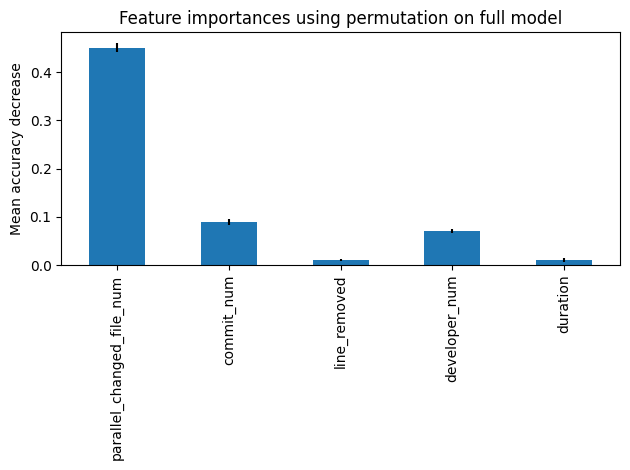

In [ ]:
permu = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(2), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

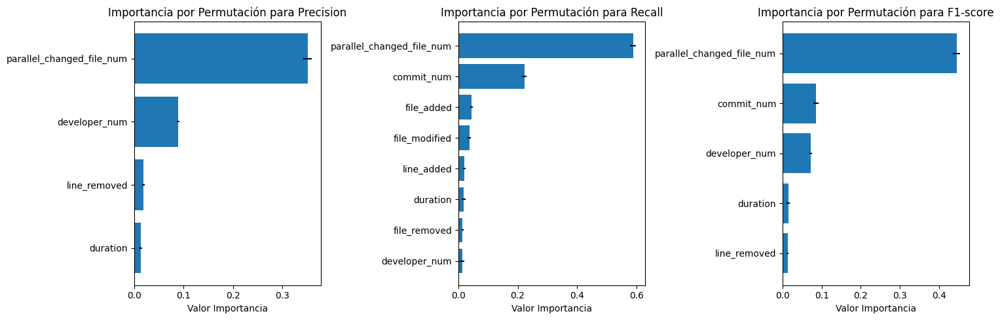

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rf = {}

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.350888,0.009112
2,developer_num,0.088618,0.002917
1,line_removed,0.018412,0.002253
3,duration,0.012824,0.003140


In [ ]:
results_global_rf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.589556,0.009858
1,commit_num,0.222212,0.007907
2,file_added,0.043998,0.005094
4,file_modified,0.036815,0.005564
5,line_added,0.019612,0.004800
7,duration,0.017013,0.006404
3,file_removed,0.014178,0.002867
6,developer_num,0.012382,0.006971


In [ ]:
results_global_rf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.445065,0.009377
1,commit_num,0.085569,0.006067
3,developer_num,0.072154,0.003729
4,duration,0.014691,0.003845
2,line_removed,0.012807,0.002249


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 34617 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 34617 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7b2570ce4940> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.122, max = 0.989
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.933, mean = -0.0509, max = 0.579
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

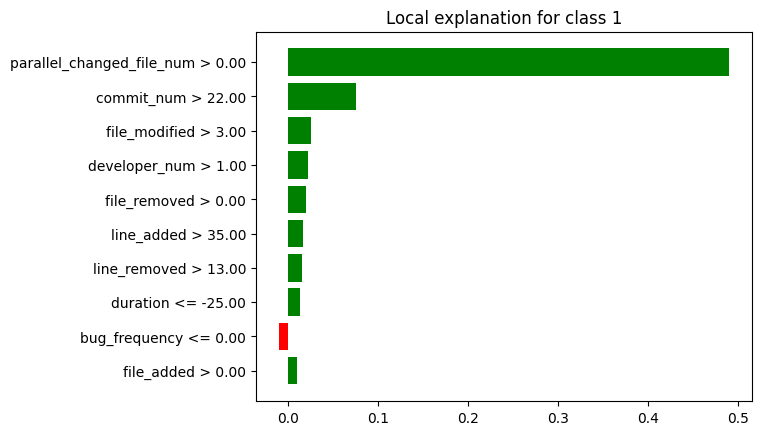

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3              developer_num        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'file_removed']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       5   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              file_modified         4  Positivo       -         -       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         5  Positivo       3  Positivo       4   
5                 file_added         3  Positivo       5  Positivo       -   
6               line_removed         -         -       4  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Positivo  
5         -  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_added", "file_modified", "developer_num", "line_removed", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_added                        3  Positivo       5  Positivo       -   
file_modified                     4  Positivo       -         -       3   
developer_num                     5  Positivo       3  Positivo       4   
line_removed                      -         -       4  Positivo       -   
file_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_added                        -  
file_modified              Positivo  
developer_num              Positivo  
line_removed                      -  
file_removed               Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

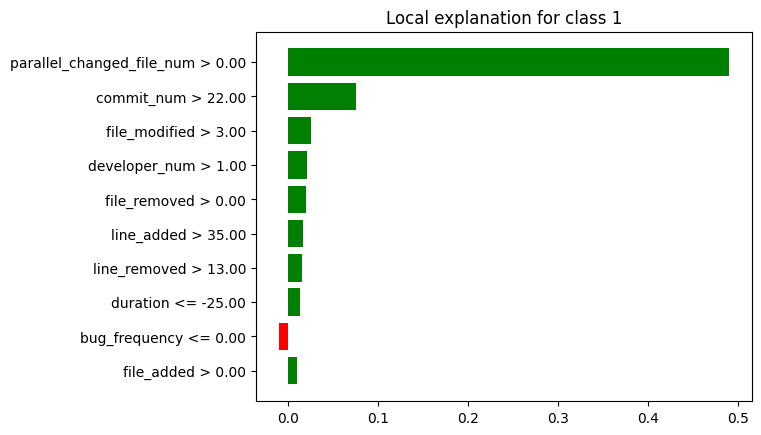

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3              file_modified        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3              developer_num        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'duration']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'file_removed']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       5  Positivo       5   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              file_modified         -         -       4  Positivo       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         3  Positivo       3  Positivo       4   
5                 file_added         4  Positivo       -         -       -   
6                   duration         5  Positivo       -         -       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Positivo  
5         -  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "duration", "file_modified", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       4   
file_added                        4  Positivo       -         -       -   
duration                          5  Positivo       -         -       -   
file_modified                     -         -       4  Positivo       3   
file_removed                      -         -       5  Positivo       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
file_added                        -  
duration                          -  
file_modified              Positivo  
file_removed               Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

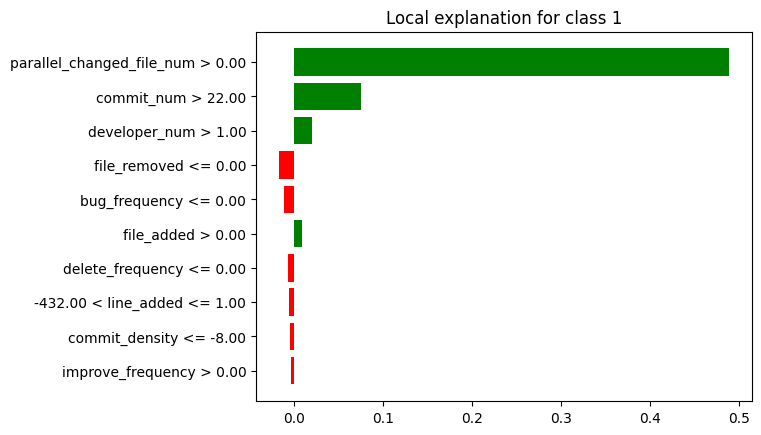

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               messages_max        4  Negativo
4            messages_median        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               messages_max        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               file_removed        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'messages_max', 'messages_median']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'messages_max', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'bug_frequency']
['file_removed', 'messages_median', 'parallel_changed_file_num', 'bug_frequency', 'messages_max', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1            messages_median         5  Negativo       -         -       -   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              bug_frequency         -         -       -         -       5   
4               messages_max         4  Negativo       4  Negativo       -   
5                 commit_num         2  Positivo       2  Positivo       2   
6              developer_num         3  Positivo       3  Positivo       3   
7               line_removed         -         -       5  Negativo       -   

             
      Signo  
0  Negativo  
1         -  
2  Positivo  
3  Negativo  
4         -  
5  Positivo  
6  Positivo  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "messages_max", "messages_median", "line_removed", "file_removed", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       3   
messages_max                      4  Negativo       4  Negativo       -   
messages_median                   5  Negativo       -         -       -   
line_removed                      -         -       5  Negativo       -   
file_removed                      -         -       -         -       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
messages_max                      -  
messages_median                   -  
line_removed                      -  
file_removed               Negativo  
bug_frequency              Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('messages_max', 4), ('messages_median', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 5), ('developer_num', 3), ('line_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('messages_max', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_modified', 3), ('file_removed', 5), ('parallel_changed_file_num',

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                          -      -           4.5      2   
file_added                          3.5      2           5.0      1   
developer_num                  3.666667      3           3.0      3   
commit_num                          2.0      3           2.0      3   
messages_max                        4.0      1           4.0      1   
file_modified                       4.0      1           4.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
messages_median                     5.0      1             -      -   
file_removed                          -      -           5.0      1   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
line_removed                          -      -  
file_added                            -      -  
developer_num                  3.666667      3  
commit_num                          2.0      3  
messages_max                          -      -  
file_modified                       3.0      2  
bug_frequency                       5.0      1  
parallel_changed_file_num           1.0      3  
messages_median                       -      -  
file_removed                   4.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vp[("General", "Conteo Total")] = df_resumen_rf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                          -      -           4.5      2   
file_added                          3.5      2           5.0      1   
developer_num                  3.666667      3           3.0      3   
commit_num                          2.0      3           2.0      3   
messages_max                        4.0      1           4.0      1   
file_modified                       4.0      1           4.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
messages_median                     5.0      1             -      -   
file_removed                          -      -           5.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  5.000000            1  
line_removed                          -      -  4.500000            2  
file_added                            -      -  4.250000            3  
developer_num                  3.666667      3  3.444444            9  
commit_num                          2.0      3  2.000000            9  
messages_max                          -      -  4.000000            2  
file_modified                       3.0      2  3.666667            4  
bug_frequency                       5.0      1  5.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_median                       -      -  5.000000            1  
file_removed                   4.666667      3  4.833333            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vp[("General", "Peso Conteo")] = df_resumen_rf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vp[("General", "Puntaje")] = df_resumen_rf_vp[("General", "Peso Rango")] + df_resumen_rf_vp[("General", "Peso Conteo")]
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                          -      -           4.5      2   
file_added                          3.5      2           5.0      1   
developer_num                  3.666667      3           3.0      3   
commit_num                          2.0      3           2.0      3   
messages_max                        4.0      1           4.0      1   
file_modified                       4.0      1           4.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
messages_median                     5.0      1             -      -   
file_removed                          -      -           5.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -     9.0            1  
line_removed                          -      -     8.0            2  
file_added                            -      -     5.0            3  
developer_num                  3.666667      3     3.0            9  
commit_num                          2.0      3     2.0            9  
messages_max                          -      -     6.0            2  
file_modified                       3.0      2     4.0            4  
bug_frequency                       5.0      1     9.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
messages_median                       -      -     9.0            1  
file_removed                   4.666667      3     6.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vp = df_resumen_rf_vp[new_columns]

In [ ]:
df_resumen_rf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vp[(tech, "Ranking Medio")] = df_resumen_rf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.00      3   
developer_num                 3.0            9          3.67      3   
file_modified                 4.0            4          4.00      1   
file_added                    5.0            3          3.50      2   
messages_max                  6.0            2          4.00      1   
file_removed                  6.0            4             -      -   
line_removed                  8.0            2             -      -   
duration                      9.0            1          5.00      1   
bug_frequency                 9.0            1             -      -   
messages_median               9.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.00      3  
developer_num                      3.00      3          3.67      3  
file_modified                      4.00      1          3.00      2  
file_added                         5.00      1             -      -  
messages_max                       4.00      1             -      -  
file_removed                       5.00      1          4.67      3  
line_removed                       4.50      2             -      -  
duration                              -      -             -      -  
bug_frequency                         -      -          5.00      1  
messages_median                       -      -             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

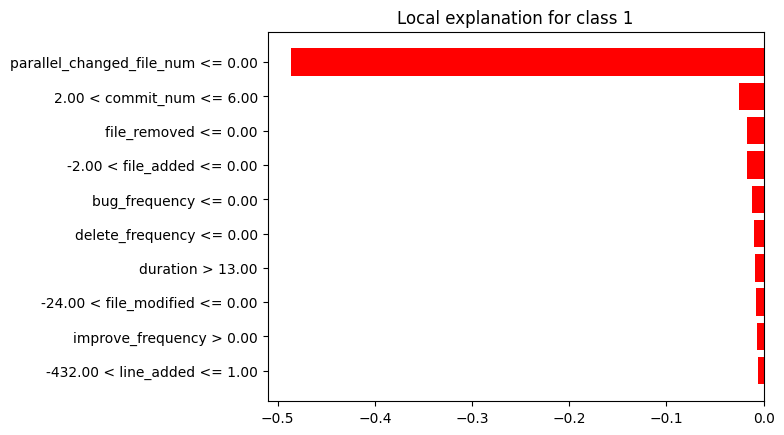

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[1, 'Variable'] = 'commit_num'
lime_vn_df_max.at[3, 'Variable'] = 'file_added'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2                   duration        3  Negativo
3                 file_added        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2                 file_added        3  Negativo
3              developer_num        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               file_removed        3  Negativo
3                 file_added        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'duration', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_added', 'developer_num', 'duration']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'bug_frequency']
['file_removed', 'parallel_changed_file_num', 'bug_frequency', 'line_added', 'commit_num', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         2  Negativo       1  Negativo       1   
2              bug_frequency         -         -       -         -       5   
3                 line_added         5  Positivo       -         -       -   
4                 commit_num         1  Negativo       2  Negativo       2   
5              developer_num         -         -       4  Negativo       -   
6                 file_added         4  Negativo       3  Negativo       4   
7                   duration         3  Negativo       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Negativo  
3         -  
4  Negativo  
5         -  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "duration", "file_added", "line_added", "developer_num", "file_removed", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       2  Negativo       2   
parallel_changed_file_num         2  Negativo       1  Negativo       1   
duration                          3  Negativo       5  Negativo       -   
file_added                        4  Negativo       3  Negativo       4   
line_added                        5  Positivo       -         -       -   
developer_num                     -         -       4  Negativo       -   
file_removed                      -         -       -         -       3   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_num                 Negativo  
parallel_changed_file_num  Negativo  
duration                          -  
file_added                 Negativo  
line_added                        -  
developer_num                     -  
file_removed               Negativo  
bug_frequency              Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

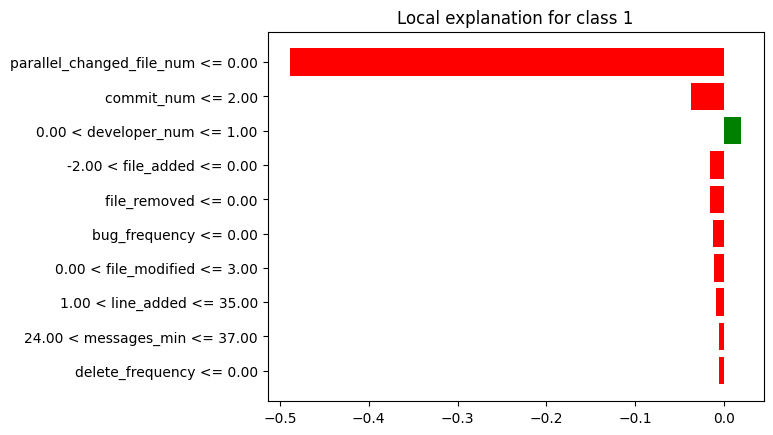

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[3, 'Variable'] = 'file_added'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3               file_removed        4  Negativo
4            messages_median        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 file_added        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 file_added        4  Negativo
4               file_removed        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_removed', 'messages_median']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'file_removed']
['file_removed', 'messages_median', 'parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         4  Negativo       5  Negativo       5   
1            messages_median         5  Negativo       -         -       -   
2  parallel_changed_file_num         1  Negativo       1  Negativo       1   
3                 commit_num         3  Negativo       2  Negativo       2   
4              developer_num         2  Positivo       3  Positivo       3   
5                 file_added         -         -       4  Negativo       4   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3  Negativo  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "file_removed", "messages_median", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Positivo       3  Positivo       3   
commit_num                        3  Negativo       2  Negativo       2   
file_removed                      4  Negativo       5  Negativo       5   
messages_median                   5  Negativo       -         -       -   
file_added                        -         -       4  Negativo       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Positivo  
commit_num                 Negativo  
file_removed               Negativo  
messages_median                   -  
file_added                 Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

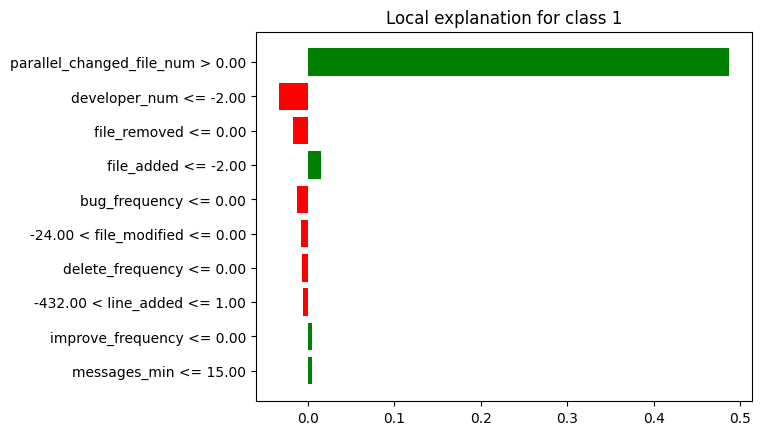

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               messages_min        3  Negativo
3                 line_added        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               messages_min        3  Negativo
3               messages_max        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'messages_min', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'messages_min', 'messages_max', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_added', 'bug_frequency']
['file_removed', 'parallel_changed_file_num', 'bug_frequency', 'line_added', 'file_modified', 'messages_max', 'file_added', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              bug_frequency         -         -       -         -       5   
3                 line_added         4  Positivo       5  Negativo       -   
4              file_modified         5  Negativo       -         -       -   
5               messages_max         -         -       4  Negativo       -   
6                 file_added         -         -       -         -       4   
7              developer_num         2  Negativo       2  Negativo       2   
8               messages_min         3  Negativo       3  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3         -  
4         -  
5         -  
6  Positivo  
7  Negativo  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "messages_min", "line_added", "file_modified", "messages_max", "file_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
messages_min                      3  Negativo       3  Negativo       -   
line_added                        4  Positivo       5  Negativo       -   
file_modified                     5  Negativo       -         -       -   
messages_max                      -         -       4  Negativo       -   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
messages_min                      -  
line_added                        -  
file_modified                     -  
messages_max                      -  
file_removed               Negativo  
file_added                 Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('duration', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_removed', 4), ('messages_median', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('messages_min', 3), ('line_added', 4), ('file_modified', 5)], 'Shapley': [('commit_num', 2), ('parallel_changed_file_num', 1), ('duration', 5), ('file_added', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('file_removed', 5), ('file_added', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('messages_min', 3), ('line_added', 5), ('messages_max', 4)], 'Lime': [('commit_num', 2), ('parallel_changed_file_num', 1), ('file_added', 4), ('file_removed', 3), ('bug_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('file_removed', 5), ('file_added', 4), ('parallel_changed_file_num', 1), ('develop

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      1           5.0      1   
messages_min                        3.0      1           3.0      1   
messages_max                          -      -           4.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num      1.333333      3           1.0      3   
messages_median                     5.0      1             -      -   
file_added                          4.0      1           3.5      2   
developer_num                       2.0      2           3.0      3   
commit_num                          2.0      2           2.0      2   
file_modified                       5.0      1             -      -   
line_added                          4.5      2           5.0      1   
file_removed                        4.0      1           5.0      1   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
messages_min                          -      -  
messages_max                          -      -  
bug_frequency                       5.0      1  
parallel_changed_file_num           1.0      3  
messages_median                       -      -  
file_added                          4.0      3  
developer_num                       2.5      2  
commit_num                          2.0      2  
file_modified                         -      -  
line_added                            -      -  
file_removed                   3.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vn[("General", "Conteo Total")] = df_resumen_rf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      1           5.0      1   
messages_min                        3.0      1           3.0      1   
messages_max                          -      -           4.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num      1.333333      3           1.0      3   
messages_median                     5.0      1             -      -   
file_added                          4.0      1           3.5      2   
developer_num                       2.0      2           3.0      3   
commit_num                          2.0      2           2.0      2   
file_modified                       5.0      1             -      -   
line_added                          4.5      2           5.0      1   
file_removed                        4.0      1           5.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  4.000000            2  
messages_min                          -      -  3.000000            2  
messages_max                          -      -  4.000000            1  
bug_frequency                       5.0      1  5.000000            1  
parallel_changed_file_num           1.0      3  1.111111            9  
messages_median                       -      -  5.000000            1  
file_added                          4.0      3  3.833333            6  
developer_num                       2.5      2  2.500000            7  
commit_num                          2.0      2  2.000000            6  
file_modified                         -      -  5.000000            1  
line_added                            -      -  4.750000            3  
file_removed                   3.666667      3  4.222222            5

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vn[("General", "Peso Conteo")] = df_resumen_rf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vn[("General", "Puntaje")] = df_resumen_rf_vn[("General", "Peso Rango")] + df_resumen_rf_vn[("General", "Peso Conteo")]
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      1           5.0      1   
messages_min                        3.0      1           3.0      1   
messages_max                          -      -           4.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num      1.333333      3           1.0      3   
messages_median                     5.0      1             -      -   
file_added                          4.0      1           3.5      2   
developer_num                       2.0      2           3.0      3   
commit_num                          2.0      2           2.0      2   
file_modified                       5.0      1             -      -   
line_added                          4.5      2           5.0      1   
file_removed                        4.0      1           5.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -     7.0            2  
messages_min                          -      -     5.0            2  
messages_max                          -      -     9.0            1  
bug_frequency                       5.0      1    10.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
messages_median                       -      -    10.0            1  
file_added                          4.0      3     4.0            6  
developer_num                       2.5      2     2.0            7  
commit_num                          2.0      2     3.0            6  
file_modified                         -      -    10.0            1  
line_added                            -      -     8.0            3  
file_removed                   3.666667      3     6.0            5

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vn = df_resumen_rf_vn[new_columns]

In [ ]:
df_resumen_rf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vn[(tech, "Ranking Medio")] = df_resumen_rf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
developer_num                 2.0            7          2.00      2   
commit_num                    3.0            6          2.00      2   
file_added                    4.0            6          4.00      1   
messages_min                  5.0            2          3.00      1   
file_removed                  6.0            5          4.00      1   
duration                      7.0            2          3.00      1   
line_added                    8.0            3          4.50      2   
messages_max                  9.0            1             -      -   
bug_frequency                10.0            1             -      -   
messages_median              10.0            1          5.00      1   
file_modified                10.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      3.00      3          2.50      2  
commit_num                         2.00      2          2.00      2  
file_added                         3.50      2          4.00      3  
messages_min                       3.00      1             -      -  
file_removed                       5.00      1          3.67      3  
duration                           5.00      1             -      -  
line_added                         5.00      1             -      -  
messages_max                       4.00      1             -      -  
bug_frequency                         -      -          5.00      1  
messages_median                       -      -             -      -  
file_modified                         -      -             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

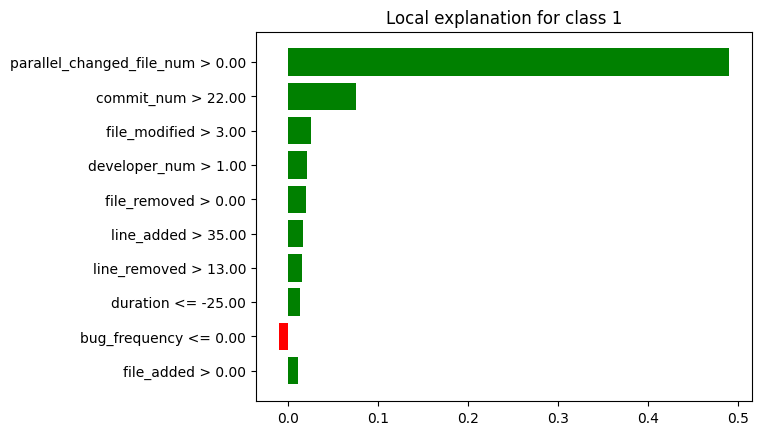

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3              developer_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3              developer_num        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'file_added', 'developer_num', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'file_removed']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       5   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              file_modified         5  Positivo       3  Positivo       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         4  Positivo       4  Positivo       4   
5                 file_added         3  Positivo       -         -       -   
6               line_removed         -         -       5  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Positivo  
5         -  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_added", "developer_num", "file_modified", "line_removed", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_added                        3  Positivo       -         -       -   
developer_num                     4  Positivo       4  Positivo       4   
file_modified                     5  Positivo       3  Positivo       3   
line_removed                      -         -       5  Positivo       -   
file_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_added                        -  
developer_num              Positivo  
file_modified              Positivo  
line_removed                      -  
file_removed               Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

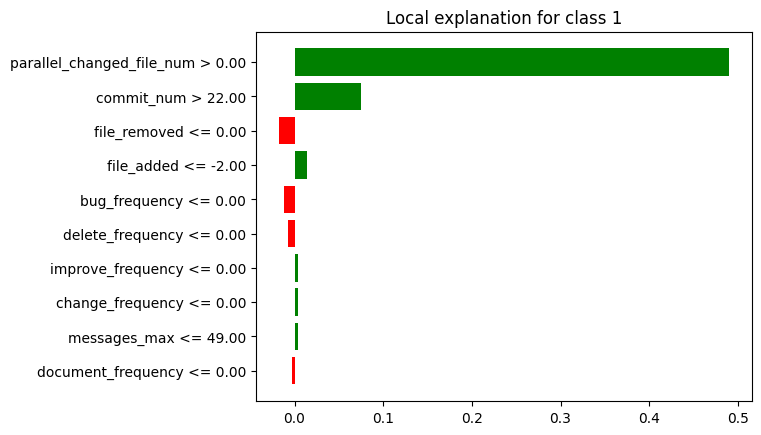

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               file_removed        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'bug_frequency']
['file_removed', 'parallel_changed_file_num', 'bug_frequency', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         4  Positivo       5  Positivo       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              bug_frequency         -         -       -         -       5   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         3  Positivo       3  Positivo       -   
5                 file_added         -         -       4  Positivo       4   
6               line_removed         5  Positivo       -         -       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3  Positivo  
4         -  
5  Positivo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_removed", "line_removed",  "file_added", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       -   
file_removed                      4  Positivo       5  Positivo       3   
line_removed                      5  Positivo       -         -       -   
file_added                        -         -       4  Positivo       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num                     -  
file_removed               Negativo  
line_removed                      -  
file_added                 Positivo  
bug_frequency              Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

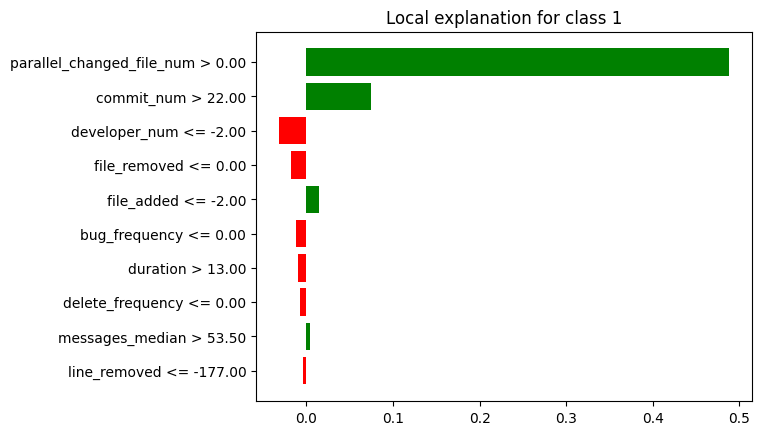

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3              file_modified        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_added']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         5  Positivo       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              file_modified         4  Positivo       -         -       -   
3                 commit_num         3  Positivo       2  Positivo       2   
4              developer_num         2  Negativo       3  Negativo       3   
5                 file_added         -         -       4  Positivo       5   
6               line_removed         -         -       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Positivo  
4  Negativo  
5  Positivo  
6         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "file_modified",  "file_removed", "file_added", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       3  Negativo       3   
commit_num                        3  Positivo       2  Positivo       2   
file_modified                     4  Positivo       -         -       -   
file_removed                      5  Positivo       -         -       4   
file_added                        -         -       4  Positivo       5   
line_removed                      -         -       5  Negativo       -   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Positivo  
file_modified                     -  
file_removed               Negativo  
file_added                 Positivo  
line_removed                      -

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('developer_num', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_removed', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_modified', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_modified', 3), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_removed', 5), ('file_added', 4), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('file_added', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_modified', 3), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('file_added', 4), ('bug_frequency', 5), ('parallel_changed_file_num', 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      1           5.0      2   
file_added                          3.0      1           4.0      2   
developer_num                       3.0      3      3.333333      3   
commit_num                     2.333333      3           2.0      3   
file_modified                       4.5      2           3.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                        4.5      2           5.0      1   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                          -      -  
file_added                          4.5      2  
developer_num                       3.5      2  
commit_num                          2.0      3  
file_modified                       3.0      1  
bug_frequency                       5.0      1  
parallel_changed_file_num           1.0      3  
file_removed                        4.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fp[("General", "Conteo Total")] = df_resumen_rf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      1           5.0      2   
file_added                          3.0      1           4.0      2   
developer_num                       3.0      3      3.333333      3   
commit_num                     2.333333      3           2.0      3   
file_modified                       4.5      2           3.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                        4.5      2           5.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                          -      -  5.000000            3  
file_added                          4.5      2  3.833333            5  
developer_num                       3.5      2  3.277778            8  
commit_num                          2.0      3  2.111111            9  
file_modified                       3.0      1  3.500000            4  
bug_frequency                       5.0      1  5.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
file_removed                        4.0      3  4.500000            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fp[("General", "Peso Conteo")] = df_resumen_rf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fp[("General", "Puntaje")] = df_resumen_rf_fp[("General", "Peso Rango")] + df_resumen_rf_fp[("General", "Peso Conteo")]
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      1           5.0      2   
file_added                          3.0      1           4.0      2   
developer_num                       3.0      3      3.333333      3   
commit_num                     2.333333      3           2.0      3   
file_modified                       4.5      2           3.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                        4.5      2           5.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                          -      -     7.0            3  
file_added                          4.5      2     4.0            5  
developer_num                       3.5      2     3.0            8  
commit_num                          2.0      3     2.0            9  
file_modified                       3.0      1     4.0            4  
bug_frequency                       5.0      1     8.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                        4.0      3     4.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fp = df_resumen_rf_fp[new_columns]

In [ ]:
df_resumen_rf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fp[(tech, "Ranking Medio")] = df_resumen_rf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.33      3   
developer_num                 3.0            8          3.00      3   
file_added                    4.0            5          3.00      1   
file_modified                 4.0            4          4.50      2   
file_removed                  4.0            6          4.50      2   
line_removed                  7.0            3          5.00      1   
bug_frequency                 8.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.00      3  
developer_num                      3.33      3          3.50      2  
file_added                         4.00      2          4.50      2  
file_modified                      3.00      1          3.00      1  
file_removed                       5.00      1          4.00      3  
line_removed                       5.00      2             -      -  
bug_frequency                         -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

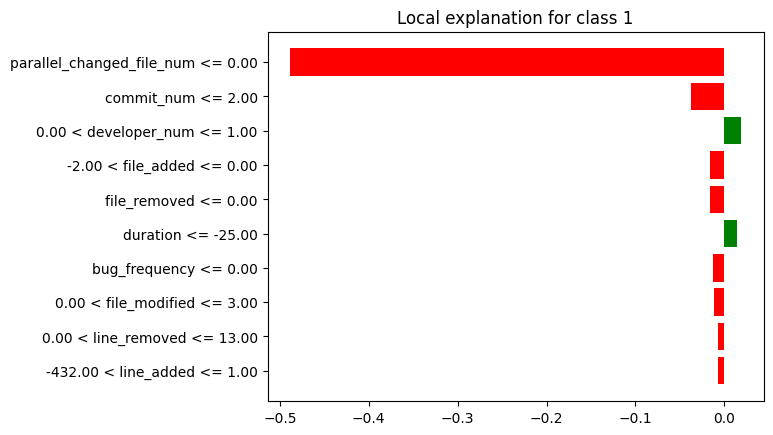

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[2, 'Variable'] = 'developer_num'
lime_fn_df_max.at[3, 'Variable'] = 'file_added'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              file_modified        4  Negativo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 file_added        4  Negativo
4               file_removed        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_modified', 'duration']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'file_removed']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       5   
1  parallel_changed_file_num         1  Negativo       1  Negativo       1   
2              file_modified         4  Negativo       -         -       -   
3                 commit_num         2  Negativo       2  Negativo       2   
4              developer_num         3  Positivo       3  Positivo       3   
5                 file_added         -         -       5  Negativo       4   
6                   duration         5  Positivo       4  Positivo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3  Negativo  
4  Positivo  
5  Negativo  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_modified", "duration", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       3  Positivo       3   
file_modified                     4  Negativo       -         -       -   
duration                          5  Positivo       4  Positivo       -   
file_added                        -         -       5  Negativo       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
file_modified                     -  
duration                          -  
file_added                 Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

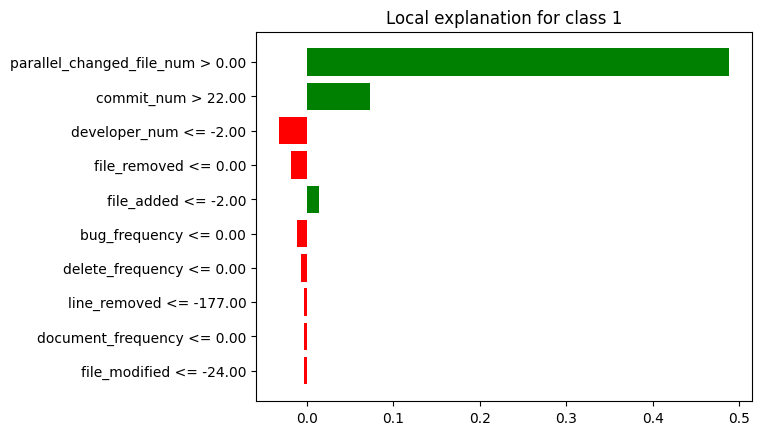

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                   duration        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               line_removed        3  Negativo
3              file_modified        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'line_added']
['parallel_changed_file_num', 'developer_num', 'line_removed', 'file_modified', 'duration']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         5  Negativo       -         -       -   
3              file_modified         -         -       4  Negativo       -   
4                 commit_num         3  Positivo       -         -       2   
5              developer_num         2  Negativo       2  Negativo       3   
6                 file_added         -         -       -         -       5   
7               line_removed         -         -       3  Negativo       -   
8                   duration         4  Negativo       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5  Negativo  
6  Positivo  
7         -  
8         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "duration", "line_added", "line_removed", "file_modified",  "file_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       3   
commit_num                        3  Positivo       -         -       2   
duration                          4  Negativo       5  Negativo       -   
line_added                        5  Negativo       -         -       -   
line_removed                      -         -       3  Negativo       -   
file_modified                     -         -       4  Negativo       -   
file_removed                      -         -       -         -       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Positivo  
duration                          -  
line_added                        -  
line_removed                      -  
file_modified                     -  
file_removed               Negativo  
file_added                 Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

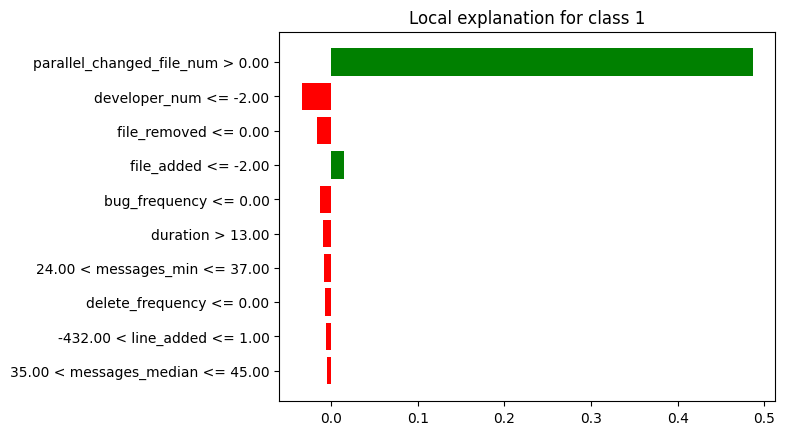

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3              file_modified        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 file_added        4  Positivo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_modified', 'file_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_added', 'duration']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_added', 'bug_frequency']
['file_removed', 'parallel_changed_file_num', 'bug_frequency', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              bug_frequency         -         -       -         -       5   
3              file_modified         4  Negativo       -         -       -   
4                 commit_num         3  Positivo       3  Positivo       -   
5              developer_num         2  Negativo       2  Negativo       2   
6                 file_added         5  Positivo       4  Positivo       4   
7                   duration         -         -       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3         -  
4         -  
5  Negativo  
6  Positivo  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "file_modified",  "file_added", "duration", "file_removed", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Positivo       3  Positivo       -   
file_modified                     4  Negativo       -         -       -   
file_added                        5  Positivo       4  Positivo       4   
duration                          -         -       5  Negativo       -   
file_removed                      -         -       -         -       3   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                        -  
file_modified                     -  
file_added                 Positivo  
duration                          -  
file_removed               Negativo  
bug_frequency              Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_modified', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('duration', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_modified', 4), ('file_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 5), ('line_removed', 3), ('file_modified', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('file_added', 4), ('duration', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('file_removed', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_added', 4),

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            4.5      2      4.666667      3   
line_removed                          -      -           3.0      1   
file_added                          5.0      1           4.5      2   
developer_num                  2.333333      3      2.333333      3   
commit_num                     2.666667      3           2.5      2   
file_modified                       4.0      2           4.0      1   
line_added                          5.0      1             -      -   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
line_removed                          -      -  
file_added                     4.333333      3  
developer_num                  2.666667      3  
commit_num                          2.0      2  
file_modified                         -      -  
line_added                            -      -  
bug_frequency                       5.0      1  
parallel_changed_file_num           1.0      3  
file_removed                        3.5      2

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fn[("General", "Conteo Total")] = df_resumen_rf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            4.5      2      4.666667      3   
line_removed                          -      -           3.0      1   
file_added                          5.0      1           4.5      2   
developer_num                  2.333333      3      2.333333      3   
commit_num                     2.666667      3           2.5      2   
file_modified                       4.0      2           4.0      1   
line_added                          5.0      1             -      -   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  4.583333            5  
line_removed                          -      -  3.000000            1  
file_added                     4.333333      3  4.611111            6  
developer_num                  2.666667      3  2.444444            9  
commit_num                          2.0      2  2.388889            7  
file_modified                         -      -  4.000000            3  
line_added                            -      -  5.000000            1  
bug_frequency                       5.0      1  5.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
file_removed                        3.5      2  3.500000            2

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fn[("General", "Peso Conteo")] = df_resumen_rf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fn[("General", "Puntaje")] = df_resumen_rf_fn[("General", "Peso Rango")] + df_resumen_rf_fn[("General", "Peso Conteo")]
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            4.5      2      4.666667      3   
line_removed                          -      -           3.0      1   
file_added                          5.0      1           4.5      2   
developer_num                  2.333333      3      2.333333      3   
commit_num                     2.666667      3           2.5      2   
file_modified                       4.0      2           4.0      1   
line_added                          5.0      1             -      -   
bug_frequency                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -     4.0            5  
line_removed                          -      -     8.0            1  
file_added                     4.333333      3     4.0            6  
developer_num                  2.666667      3     2.0            9  
commit_num                          2.0      2     3.0            7  
file_modified                         -      -     4.0            3  
line_added                            -      -     9.0            1  
bug_frequency                       5.0      1     9.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                        3.5      2     4.0            2

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fn = df_resumen_rf_fn[new_columns]

In [ ]:
df_resumen_rf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fn[(tech, "Ranking Medio")] = df_resumen_rf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.33      3   
commit_num                    3.0            7          2.67      3   
duration                      4.0            5          4.50      2   
file_added                    4.0            6          5.00      1   
file_modified                 4.0            3          4.00      2   
file_removed                  4.0            2             -      -   
line_removed                  8.0            1             -      -   
line_added                    9.0            1          5.00      1   
bug_frequency                 9.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.33      3          2.67      3  
commit_num                         2.50      2          2.00      2  
duration                           4.67      3             -      -  
file_added                         4.50      2          4.33      3  
file_modified                      4.00      1             -      -  
file_removed                          -      -          3.50      2  
line_removed                       3.00      1             -      -  
line_added                            -      -             -      -  
bug_frequency                         -      -          5.00      1

## **BalancedRandomForest:**

**FEATURE IMPORTANCE**

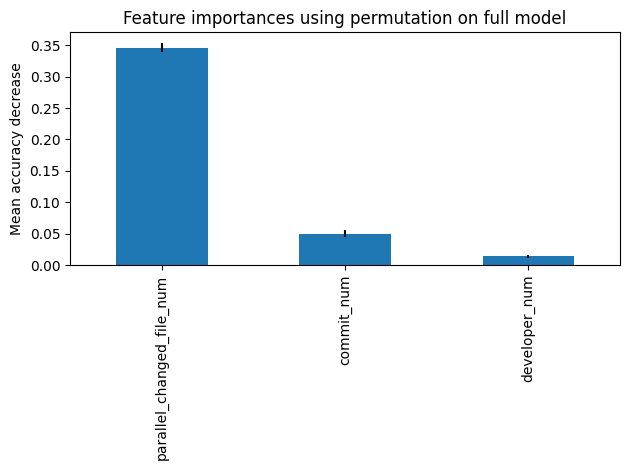

In [ ]:
permu = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

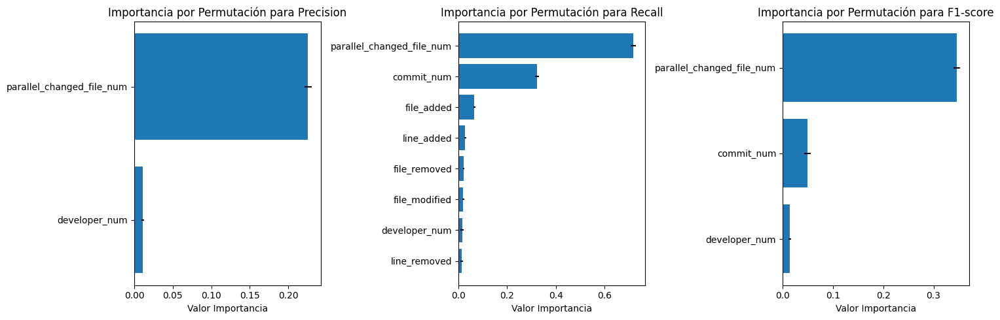

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_brf = {}

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_brf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_brf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.225782,0.005051
1,developer_num,0.011188,0.001670


In [ ]:
results_global_brf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.718904,0.011379
1,commit_num,0.322684,0.008033
2,file_added,0.065076,0.003889
5,line_added,0.027457,0.004305
3,file_removed,0.020416,0.002680
4,file_modified,0.019849,0.003219
7,developer_num,0.015123,0.006104
6,line_removed,0.012287,0.005330


In [ ]:
results_global_brf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.346252,0.006936
1,commit_num,0.049519,0.005958
2,developer_num,0.014370,0.002471


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_brf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 34617 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 34617 values
  -> model_class       : imblearn.ensemble._forest.BalancedRandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7b2570ce4940> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.193, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = -0.122, max = 0.6
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

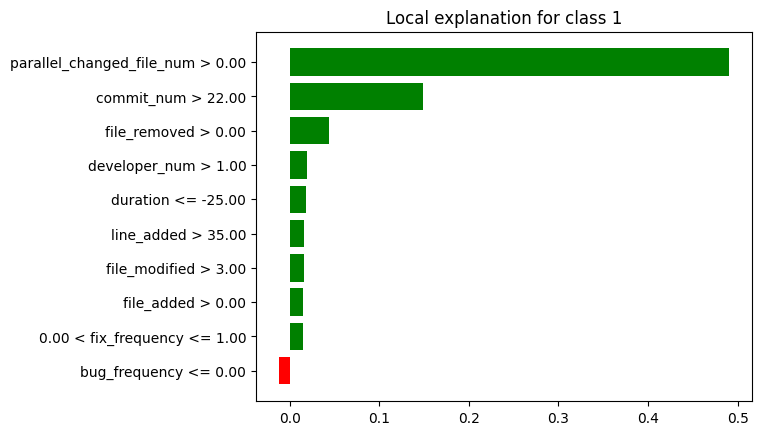

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3              developer_num        4  Positivo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3              developer_num        4  Positivo
4                   duration        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'developer_num', 'duration']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'duration']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         5  Positivo       -         -       -   
3              file_modified         -         -       3  Positivo       -   
4                 commit_num         2  Positivo       2  Positivo       2   
5              developer_num         3  Positivo       4  Positivo       4   
6               line_removed         4  Positivo       -         -       -   
7                   duration         -         -       5  Negativo       5   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5  Positivo  
6         -  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_removed", "line_added", "file_modified", "duration", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       4  Positivo       4   
line_removed                      4  Positivo       -         -       -   
line_added                        5  Positivo       -         -       -   
file_modified                     -         -       3  Positivo       -   
duration                          -         -       5  Negativo       5   
file_removed                      -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
line_removed                      -  
line_added                        -  
file_modified                     -  
duration                   Positivo  
file_removed               Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

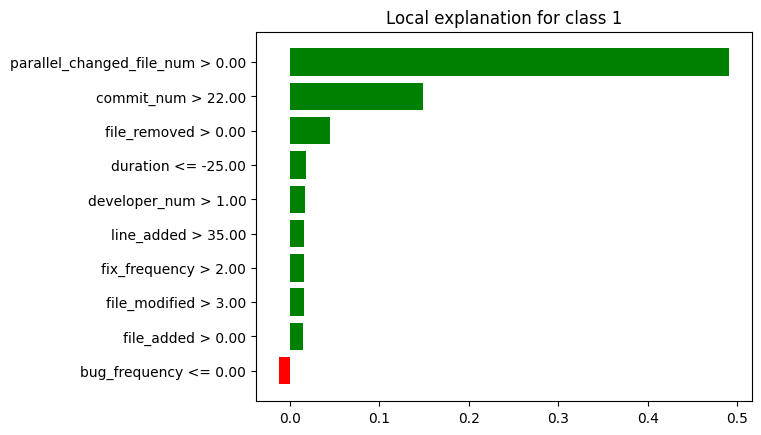

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Negativo
3               messages_min        4  Negativo
4           delete_frequency        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                 file_added        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                   duration        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'file_added', 'messages_min', 'delete_frequency']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'duration', 'developer_num']
['file_removed', 'parallel_changed_file_num', 'delete_frequency', 'file_modified', 'commit_num', 'developer_num', 'messages_min', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       3  Positivo       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2           delete_frequency         5  Positivo       -         -       -   
3              file_modified         -         -       5  Negativo       -   
4                 commit_num         2  Positivo       2  Positivo       2   
5              developer_num         -         -       -         -       5   
6               messages_min         4  Negativo       -         -       -   
7                 file_added         3  Negativo       4  Positivo       -   
8                   duration         -         -       -         -       4   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5  Positivo  
6         -  
7         -  
8  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_added", "messages_min", "delete_frequency", "file_removed", "file_modified", "duration", "developer_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_added                        3  Negativo       4  Positivo       -   
messages_min                      4  Negativo       -         -       -   
delete_frequency                  5  Positivo       -         -       -   
file_removed                      -         -       3  Positivo       3   
file_modified                     -         -       5  Negativo       -   
duration                          -         -       -         -       4   
developer_num                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_added                        -  
messages_min                      -  
delete_frequency                  -  
file_removed               Positivo  
file_modified                     -  
duration                   Positivo  
developer_num              Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

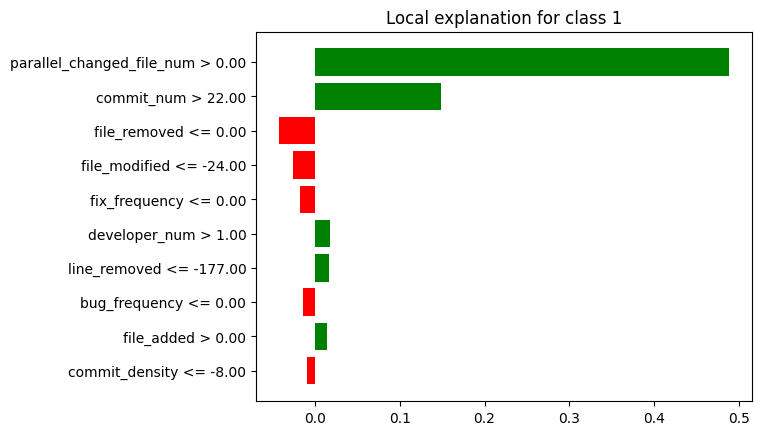

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Negativo
2                 commit_num        3  Positivo
3                 file_added        4  Negativo
4              add_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Negativo
2                 commit_num        3  Positivo
3                 file_added        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3              file_modified        4  Negativo
4              fix_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'file_modified', 'commit_num', 'file_added', 'add_frequency']
['parallel_changed_file_num', 'file_modified', 'commit_num', 'file_added', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_modified', 'fix_frequency']
['file_removed', 'add_frequency', 'fix_frequency', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1              add_frequency         5  Negativo       -         -       -   
2              fix_frequency         -         -       -         -       5   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4              file_modified         2  Negativo       2  Negativo       4   
5                 commit_num         3  Positivo       3  Positivo       2   
6              developer_num         -         -       5  Positivo       -   
7                 file_added         4  Negativo       4  Negativo       -   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3  Positivo  
4  Negativo  
5  Positivo  
6         -  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_modified", "commit_num", "file_added", "add_frequency", "developer_num", "file_removed", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_modified                     2  Negativo       2  Negativo       4   
commit_num                        3  Positivo       3  Positivo       2   
file_added                        4  Negativo       4  Negativo       -   
add_frequency                     5  Negativo       -         -       -   
developer_num                     -         -       5  Positivo       -   
file_removed                      -         -       -         -       3   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_modified              Negativo  
commit_num                 Positivo  
file_added                        -  
add_frequency                     -  
developer_num                     -  
file_removed               Negativo  
fix_frequency              Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('messages_min', 4), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('file_modified', 2), ('commit_num', 3), ('file_added', 4), ('add_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_modified', 3), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 4), ('file_removed', 3), ('file_modified', 5), ('parallel_changed_file_num', 1), ('file_modified', 2), ('commit_num', 3), ('file_added', 4), ('developer_num', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('duration', 5), ('file_removed', 3), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('duration', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('file_m

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -           5.0      1   
messages_min                        4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
add_frequency                       5.0      1             -      -   
line_removed                        4.0      1             -      -   
file_added                          3.5      2           4.0      2   
developer_num                       3.0      1           4.5      2   
commit_num                     2.333333      3      2.333333      3   
file_modified                       2.0      1      3.333333      3   
line_added                          5.0      1             -      -   
delete_frequency                    5.0      1             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -           3.0      1   

                                   Lime         
                          Ranking Medio Conteo  
duration                            4.5      2  
messages_min                          -      -  
parallel_changed_file_num           1.0      3  
add_frequency                         -      -  
line_removed                          -      -  
file_added                            -      -  
developer_num                       4.5      2  
commit_num                          2.0      3  
file_modified                       4.0      1  
line_added                            -      -  
delete_frequency                      -      -  
fix_frequency                       5.0      1  
file_removed                        3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vp[("General", "Conteo Total")] = df_resumen_brf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -           5.0      1   
messages_min                        4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
add_frequency                       5.0      1             -      -   
line_removed                        4.0      1             -      -   
file_added                          3.5      2           4.0      2   
developer_num                       3.0      1           4.5      2   
commit_num                     2.333333      3      2.333333      3   
file_modified                       2.0      1      3.333333      3   
line_added                          5.0      1             -      -   
delete_frequency                    5.0      1             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -           3.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                            4.5      2  4.750000            3  
messages_min                          -      -  4.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
add_frequency                         -      -  5.000000            1  
line_removed                          -      -  4.000000            1  
file_added                            -      -  3.750000            4  
developer_num                       4.5      2  4.000000            5  
commit_num                          2.0      3  2.222222            9  
file_modified                       4.0      1  3.111111            5  
line_added                            -      -  5.000000            1  
delete_frequency                      -      -  5.000000            1  
fix_frequency                       5.0      1  5.000000            1  
file_removed                        3.0      3  3.000000            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vp[("General", "Peso Conteo")] = df_resumen_brf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vp[("General", "Puntaje")] = df_resumen_brf_vp[("General", "Peso Rango")] + df_resumen_brf_vp[("General", "Peso Conteo")]
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -           5.0      1   
messages_min                        4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
add_frequency                       5.0      1             -      -   
line_removed                        4.0      1             -      -   
file_added                          3.5      2           4.0      2   
developer_num                       3.0      1           4.5      2   
commit_num                     2.333333      3      2.333333      3   
file_modified                       2.0      1      3.333333      3   
line_added                          5.0      1             -      -   
delete_frequency                    5.0      1             -      -   
fix_frequency                         -      -             -      -   
file_removed                          -      -           3.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                            4.5      2     7.0            3  
messages_min                          -      -     8.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
add_frequency                         -      -    10.0            1  
line_removed                          -      -     8.0            1  
file_added                            -      -     5.0            4  
developer_num                       4.5      2     5.0            5  
commit_num                          2.0      3     2.0            9  
file_modified                       4.0      1     3.0            5  
line_added                            -      -    10.0            1  
delete_frequency                      -      -    10.0            1  
fix_frequency                       5.0      1    10.0            1  
file_removed                        3.0      3     4.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vp = df_resumen_brf_vp[new_columns]

In [ ]:
df_resumen_brf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vp[(tech, "Ranking Medio")] = df_resumen_brf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.33      3   
file_modified                 3.0            5          2.00      1   
file_removed                  4.0            4             -      -   
file_added                    5.0            4          3.50      2   
developer_num                 5.0            5          3.00      1   
duration                      7.0            3             -      -   
messages_min                  8.0            1          4.00      1   
line_removed                  8.0            1          4.00      1   
add_frequency                10.0            1          5.00      1   
line_added                   10.0            1          5.00      1   
delete_frequency             10.0            1          5.00      1   
fix_frequency                10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.00      3  
file_modified                      3.33      3          4.00      1  
file_removed                       3.00      1          3.00      3  
file_added                         4.00      2             -      -  
developer_num                      4.50      2          4.50      2  
duration                           5.00      1          4.50      2  
messages_min                          -      -             -      -  
line_removed                          -      -             -      -  
add_frequency                         -      -             -      -  
line_added                            -      -             -      -  
delete_frequency                      -      -             -      -  
fix_frequency                         -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

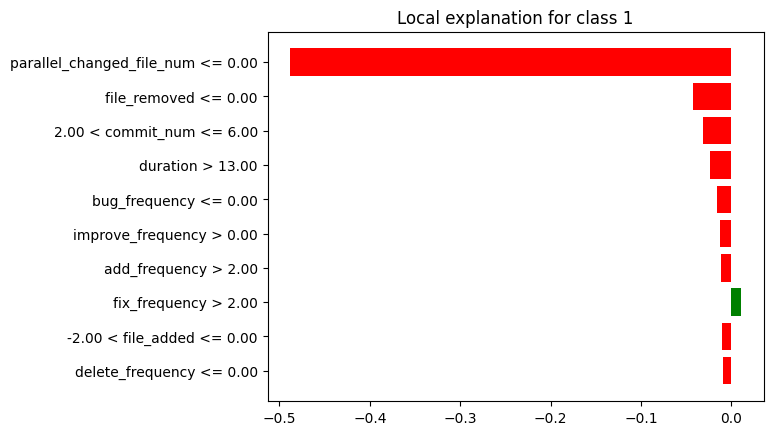

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[2, 'Variable'] = 'commit_num'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2          improve_frequency        3  Negativo
3         refactor_frequency        4  Negativo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2          improve_frequency        3  Negativo
3              developer_num        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Negativo
2                 commit_num        3  Negativo
3                   duration        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'improve_frequency', 'refactor_frequency', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'improve_frequency', 'developer_num', 'file_added']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'duration', 'bug_frequency']
['file_removed', 'improve_frequency', 'parallel_changed_file_num', 'refactor_frequency', 'bug_frequency', 'commit_num', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         5  Positivo       -         -       2   
1          improve_frequency         3  Negativo       3  Negativo       -   
2  parallel_changed_file_num         2  Negativo       1  Negativo       1   
3         refactor_frequency         4  Negativo       -         -       -   
4              bug_frequency         -         -       -         -       5   
5                 commit_num         1  Negativo       2  Negativo       3   
6              developer_num         -         -       4  Negativo       -   
7                 file_added         -         -       5  Negativo       -   
8                   duration         -         -       -         -       4   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3         -  
4  Negativo  
5  Negativo  
6         -  
7         -  
8  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "improve_frequency", "refactor_frequency", "file_removed", "developer_num", "file_added", "duration", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       2  Negativo       3   
parallel_changed_file_num         2  Negativo       1  Negativo       1   
improve_frequency                 3  Negativo       3  Negativo       -   
refactor_frequency                4  Negativo       -         -       -   
file_removed                      5  Positivo       -         -       2   
developer_num                     -         -       4  Negativo       -   
file_added                        -         -       5  Negativo       -   
duration                          -         -       -         -       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_num                 Negativo  
parallel_changed_file_num  Negativo  
improve_frequency                 -  
refactor_frequency                -  
file_removed               Negativo  
developer_num                     -  
file_added                        -  
duration                   Negativo  
bug_frequency              Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

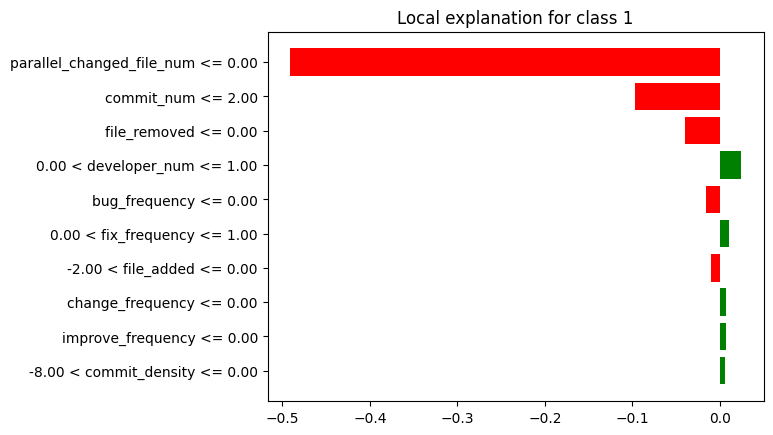

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[3, 'Variable'] = 'developer_num'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['commit_num', 'parallel_changed_file_num', 'developer_num', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'bug_frequency']
['file_removed', 'parallel_changed_file_num', 'bug_frequency', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         2  Negativo       1  Negativo       1   
2              bug_frequency         -         -       -         -       5   
3                 line_added         -         -       4  Negativo       -   
4              file_modified         5  Negativo       -         -       -   
5                 commit_num         1  Negativo       2  Negativo       2   
6              developer_num         3  Positivo       3  Positivo       4   
7                 file_added         -         -       5  Negativo       -   
8               line_removed         4  Negativo       -         -       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Negativo  
3         -  
4         -  
5  Negativo  
6  Positivo  
7         -  
8         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "developer_num", "line_removed", "file_modified", "line_added", "file_added", "file_removed", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       2  Negativo       2   
parallel_changed_file_num         2  Negativo       1  Negativo       1   
developer_num                     3  Positivo       3  Positivo       4   
line_removed                      4  Negativo       -         -       -   
file_modified                     5  Negativo       -         -       -   
line_added                        -         -       4  Negativo       -   
file_added                        -         -       5  Negativo       -   
file_removed                      -         -       -         -       3   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_num                 Negativo  
parallel_changed_file_num  Negativo  
developer_num              Positivo  
line_removed                      -  
file_modified                     -  
line_added                        -  
file_added                        -  
file_removed               Negativo  
bug_frequency              Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

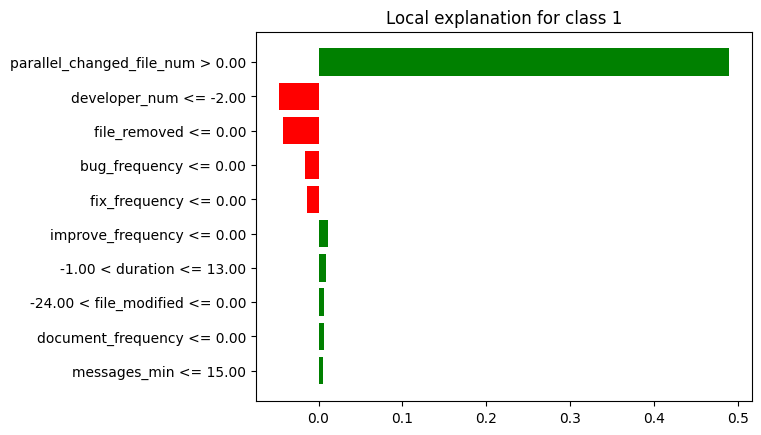

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max        2  Negativo
2                 commit_num        3  Positivo
3            messages_median        4  Negativo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3              bug_frequency        4  Negativo
4              fix_frequency        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_max', 'commit_num', 'developer_num', 'line_removed']
['parallel_changed_file_num', 'messages_max', 'commit_num', 'messages_median', 'developer_num']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'bug_frequency', 'fix_frequency']
['file_removed', 'messages_median', 'fix_frequency', 'parallel_changed_file_num', 'bug_frequency', 'messages_max', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1            messages_median         -         -       4  Negativo       -   
2              fix_frequency         -         -       -         -       5   
3  parallel_changed_file_num         1  Positivo       1  Positivo       1   
4              bug_frequency         -         -       -         -       4   
5               messages_max         2  Negativo       2  Negativo       -   
6                 commit_num         3  Positivo       3  Positivo       -   
7              developer_num         4  Positivo       5  Negativo       2   
8               line_removed         5  Negativo       -         -       -   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3  Positivo  
4  Negativo  
5         -  
6         -  
7  Negativo  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "messages_max", "commit_num", "developer_num", "line_removed", "messages_median", "file_removed", "bug_frequency", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
messages_max                      2  Negativo       2  Negativo       -   
commit_num                        3  Positivo       3  Positivo       -   
developer_num                     4  Positivo       5  Negativo       2   
line_removed                      5  Negativo       -         -       -   
messages_median                   -         -       4  Negativo       -   
file_removed                      -         -       -         -       3   
bug_frequency                     -         -       -         -       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
messages_max                      -  
commit_num                        -  
developer_num              Negativo  
line_removed                      -  
messages_median                   -  
file_removed               Negativo  
bug_frequency              Negativo  
fix_frequency              Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('improve_frequency', 3), ('refactor_frequency', 4), ('file_removed', 5), ('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('messages_max', 2), ('commit_num', 3), ('developer_num', 4), ('line_removed', 5)], 'Shapley': [('commit_num', 2), ('parallel_changed_file_num', 1), ('improve_frequency', 3), ('developer_num', 4), ('file_added', 5), ('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 3), ('line_added', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('messages_max', 2), ('commit_num', 3), ('developer_num', 5), ('messages_median', 4)], 'Lime': [('commit_num', 3), ('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 4), ('bug_frequency', 5), ('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 4), ('file_removed', 3), ('bug_frequency', 5), ('parallel_chang

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -             -      -   
messages_max                        2.0      1           2.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num      1.666667      3           1.0      3   
messages_median                       -      -           4.0      1   
line_removed                        4.5      2             -      -   
file_added                            -      -           5.0      2   
developer_num                       3.5      2           4.0      3   
commit_num                     1.666667      3      2.333333      3   
file_modified                       5.0      1             -      -   
line_added                            -      -           4.0      1   
refactor_frequency                  4.0      1             -      -   
improve_frequency                   3.0      1           3.0      1   
fix_frequency                         -      -             -      -   
file_removed                        5.0      1             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                            4.0      1  
messages_max                          -      -  
bug_frequency                  4.666667      3  
parallel_changed_file_num           1.0      3  
messages_median                       -      -  
line_removed                          -      -  
file_added                            -      -  
developer_num                       3.0      2  
commit_num                          2.5      2  
file_modified                         -      -  
line_added                            -      -  
refactor_frequency                    -      -  
improve_frequency                     -      -  
fix_frequency                       5.0      1  
file_removed                   2.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vn[("General", "Conteo Total")] = df_resumen_brf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -             -      -   
messages_max                        2.0      1           2.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num      1.666667      3           1.0      3   
messages_median                       -      -           4.0      1   
line_removed                        4.5      2             -      -   
file_added                            -      -           5.0      2   
developer_num                       3.5      2           4.0      3   
commit_num                     1.666667      3      2.333333      3   
file_modified                       5.0      1             -      -   
line_added                            -      -           4.0      1   
refactor_frequency                  4.0      1             -      -   
improve_frequency                   3.0      1           3.0      1   
fix_frequency                         -      -             -      -   
file_removed                        5.0      1             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                            4.0      1  4.000000            1  
messages_max                          -      -  2.000000            2  
bug_frequency                  4.666667      3  4.666667            3  
parallel_changed_file_num           1.0      3  1.222222            9  
messages_median                       -      -  4.000000            1  
line_removed                          -      -  4.500000            2  
file_added                            -      -  5.000000            2  
developer_num                       3.0      2  3.500000            7  
commit_num                          2.5      2  2.166667            8  
file_modified                         -      -  5.000000            1  
line_added                            -      -  4.000000            1  
refactor_frequency                    -      -  4.000000            1  
improve_frequency                     -      -  3.000000            2  
fix_frequency                       5.0      1  5.000000            1  
file_removed                   2.666667      3  3.833333            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vn[("General", "Peso Conteo")] = df_resumen_brf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vn[("General", "Puntaje")] = df_resumen_brf_vn[("General", "Peso Rango")] + df_resumen_brf_vn[("General", "Peso Conteo")]
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -             -      -   
messages_max                        2.0      1           2.0      1   
bug_frequency                         -      -             -      -   
parallel_changed_file_num      1.666667      3           1.0      3   
messages_median                       -      -           4.0      1   
line_removed                        4.5      2             -      -   
file_added                            -      -           5.0      2   
developer_num                       3.5      2           4.0      3   
commit_num                     1.666667      3      2.333333      3   
file_modified                       5.0      1             -      -   
line_added                            -      -           4.0      1   
refactor_frequency                  4.0      1             -      -   
improve_frequency                   3.0      1           3.0      1   
fix_frequency                         -      -             -      -   
file_removed                        5.0      1             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                            4.0      1     9.0            1  
messages_max                          -      -     4.0            2  
bug_frequency                  4.666667      3     7.0            3  
parallel_changed_file_num           1.0      3     1.0            9  
messages_median                       -      -     9.0            1  
line_removed                          -      -     8.0            2  
file_added                            -      -    13.0            2  
developer_num                       3.0      2     3.0            7  
commit_num                          2.5      2     2.0            8  
file_modified                         -      -    14.0            1  
line_added                            -      -     9.0            1  
refactor_frequency                    -      -     9.0            1  
improve_frequency                     -      -     6.0            2  
fix_frequency                       5.0      1    14.0            1  
file_removed                   2.666667      3     5.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vn = df_resumen_brf_vn[new_columns]

In [ ]:
df_resumen_brf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vn[(tech, "Ranking Medio")] = df_resumen_brf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.67      3   
commit_num                    2.0            8          1.67      3   
developer_num                 3.0            7          3.50      2   
messages_max                  4.0            2          2.00      1   
file_removed                  5.0            4          5.00      1   
improve_frequency             6.0            2          3.00      1   
bug_frequency                 7.0            3             -      -   
line_removed                  8.0            2          4.50      2   
duration                      9.0            1             -      -   
messages_median               9.0            1             -      -   
line_added                    9.0            1             -      -   
refactor_frequency            9.0            1          4.00      1   
file_added                   13.0            2             -      -   
file_modified                14.0            1          5.00      1   
fix_frequency                14.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.50      2  
developer_num                      4.00      3          3.00      2  
messages_max                       2.00      1             -      -  
file_removed                          -      -          2.67      3  
improve_frequency                  3.00      1             -      -  
bug_frequency                         -      -          4.67      3  
line_removed                          -      -             -      -  
duration                              -      -          4.00      1  
messages_median                    4.00      1             -      -  
line_added                         4.00      1             -      -  
refactor_frequency                    -      -             -      -  
file_added                         5.00      2             -      -  
file_modified                         -      -             -      -  
fix_frequency                         -      -          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

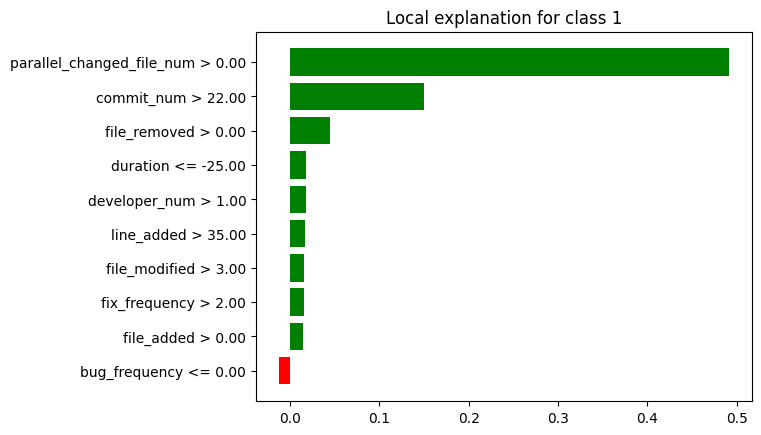

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3              developer_num        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                 file_added        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                   duration        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'duration', 'developer_num']
['file_removed', 'parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         3  Positivo       3  Positivo       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 commit_num         2  Positivo       2  Positivo       2   
3              developer_num         4  Positivo       5  Positivo       5   
4                 file_added         5  Negativo       4  Positivo       -   
5                   duration         -         -       -         -       4   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4         -  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_removed", "developer_num", "file_added", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_removed                      3  Positivo       3  Positivo       3   
developer_num                     4  Positivo       5  Positivo       5   
file_added                        5  Negativo       4  Positivo       -   
duration                          -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_removed               Positivo  
developer_num              Positivo  
file_added                        -  
duration                   Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

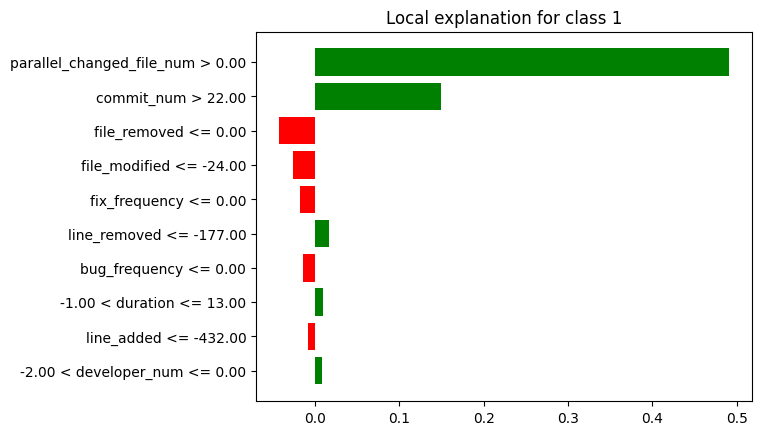

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               messages_max        3  Negativo
3               file_removed        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Negativo
3                 file_added        4  Positivo
4               messages_max        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3              file_modified        4  Negativo
4              fix_frequency        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'messages_max', 'file_removed', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_added', 'messages_max']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_modified', 'fix_frequency']
['file_removed', 'fix_frequency', 'parallel_changed_file_num', 'file_modified', 'messages_max', 'commit_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         4  Negativo       -         -       3   
1              fix_frequency         -         -       -         -       5   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         -         -       -         -       4   
4               messages_max         3  Negativo       5  Negativo       -   
5                 commit_num         2  Positivo       2  Positivo       2   
6                 file_added         -         -       4  Positivo       -   
7               line_removed         5  Negativo       3  Negativo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo  
6         -  
7         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "messages_max", "file_removed", "line_removed", "file_added", "file_modified", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
messages_max                      3  Negativo       5  Negativo       -   
file_removed                      4  Negativo       -         -       3   
line_removed                      5  Negativo       3  Negativo       -   
file_added                        -         -       4  Positivo       -   
file_modified                     -         -       -         -       4   
fix_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
messages_max                      -  
file_removed               Negativo  
line_removed                      -  
file_added                        -  
file_modified              Negativo  
fix_frequency              Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

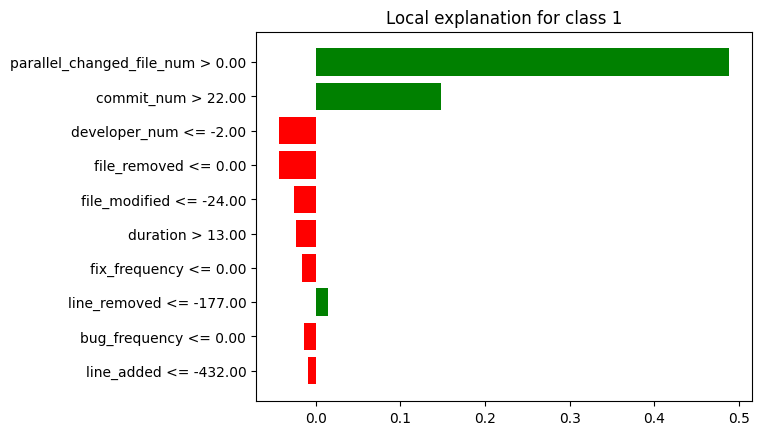

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2             commit_density        3  Negativo
3                 line_added        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4              file_modified        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'commit_density', 'line_added', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_modified']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'messages_min', 'commit_num', 'commit_density', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         4  Positivo       -         -       -   
3              file_modified         -         -       -         -       5   
4               messages_min         -         -       5  Negativo       -   
5                 commit_num         2  Positivo       2  Positivo       2   
6             commit_density         3  Negativo       -         -       -   
7              developer_num         -         -       3  Negativo       3   
8                 file_added         -         -       4  Positivo       -   
9               line_removed         5  Negativo       -         -       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Negativo  
4         -  
5  Positivo  
6         -  
7  Negativo  
8         -  
9         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "commit_density", "line_added", "line_removed", "developer_num", "file_added", "messages_min", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
commit_density                    3  Negativo       -         -       -   
line_added                        4  Positivo       -         -       -   
line_removed                      5  Negativo       -         -       -   
developer_num                     -         -       3  Negativo       3   
file_added                        -         -       4  Positivo       -   
messages_min                      -         -       5  Negativo       -   
file_removed                      -         -       -         -       4   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
commit_density                    -  
line_added                        -  
line_removed                      -  
developer_num              Negativo  
file_added                        -  
messages_min                      -  
file_removed               Negativo  
file_modified              Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('developer_num', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('messages_max', 3), ('file_removed', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('commit_density', 3), ('line_added', 4), ('line_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('developer_num', 5), ('file_added', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('messages_max', 5), ('line_removed', 3), ('file_added', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('messages_min', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('developer_num', 5), ('duration', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('file_modified', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('comm

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -             -      -   
line_removed                        5.0      2           3.0      1   
file_added                          5.0      1           4.0      3   
developer_num                       4.0      1           4.0      2   
commit_density                      3.0      1             -      -   
commit_num                          2.0      3           2.0      3   
messages_max                        3.0      1           5.0      1   
messages_min                          -      -           5.0      1   
file_modified                         -      -             -      -   
line_added                          4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
file_removed                        3.5      2           3.0      1   

                                   Lime         
                          Ranking Medio Conteo  
duration                            4.0      1  
line_removed                          -      -  
file_added                            -      -  
developer_num                       4.0      2  
commit_density                        -      -  
commit_num                          2.0      3  
messages_max                          -      -  
messages_min                          -      -  
file_modified                       4.5      2  
line_added                            -      -  
parallel_changed_file_num           1.0      3  
fix_frequency                       5.0      1  
file_removed                   3.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fp[("General", "Conteo Total")] = df_resumen_brf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -             -      -   
line_removed                        5.0      2           3.0      1   
file_added                          5.0      1           4.0      3   
developer_num                       4.0      1           4.0      2   
commit_density                      3.0      1             -      -   
commit_num                          2.0      3           2.0      3   
messages_max                        3.0      1           5.0      1   
messages_min                          -      -           5.0      1   
file_modified                         -      -             -      -   
line_added                          4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
file_removed                        3.5      2           3.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                            4.0      1  4.000000            1  
line_removed                          -      -  4.000000            3  
file_added                            -      -  4.500000            4  
developer_num                       4.0      2  4.000000            5  
commit_density                        -      -  3.000000            1  
commit_num                          2.0      3  2.000000            9  
messages_max                          -      -  4.000000            2  
messages_min                          -      -  5.000000            1  
file_modified                       4.5      2  4.500000            2  
line_added                            -      -  4.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
fix_frequency                       5.0      1  5.000000            1  
file_removed                   3.333333      3  3.277778            6

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fp[("General", "Peso Conteo")] = df_resumen_brf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fp[("General", "Puntaje")] = df_resumen_brf_fp[("General", "Peso Rango")] + df_resumen_brf_fp[("General", "Peso Conteo")]
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -             -      -   
line_removed                        5.0      2           3.0      1   
file_added                          5.0      1           4.0      3   
developer_num                       4.0      1           4.0      2   
commit_density                      3.0      1             -      -   
commit_num                          2.0      3           2.0      3   
messages_max                        3.0      1           5.0      1   
messages_min                          -      -           5.0      1   
file_modified                         -      -             -      -   
line_added                          4.0      1             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
fix_frequency                         -      -             -      -   
file_removed                        3.5      2           3.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                            4.0      1    10.0            1  
line_removed                          -      -     5.0            3  
file_added                            -      -     8.0            4  
developer_num                       4.0      2     4.0            5  
commit_density                        -      -     6.0            1  
commit_num                          2.0      3     2.0            9  
messages_max                          -      -     7.0            2  
messages_min                          -      -    12.0            1  
file_modified                       4.5      2     9.0            2  
line_added                            -      -    10.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
fix_frequency                       5.0      1    12.0            1  
file_removed                   3.333333      3     3.0            6

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fp = df_resumen_brf_fp[new_columns]

In [ ]:
df_resumen_brf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fp[(tech, "Ranking Medio")] = df_resumen_brf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.00      3   
file_removed                  3.0            6          3.50      2   
developer_num                 4.0            5          4.00      1   
line_removed                  5.0            3          5.00      2   
commit_density                6.0            1          3.00      1   
messages_max                  7.0            2          3.00      1   
file_added                    8.0            4          5.00      1   
file_modified                 9.0            2             -      -   
duration                     10.0            1             -      -   
line_added                   10.0            1          4.00      1   
messages_min                 12.0            1             -      -   
fix_frequency                12.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.00      3  
file_removed                       3.00      1          3.33      3  
developer_num                      4.00      2          4.00      2  
line_removed                       3.00      1             -      -  
commit_density                        -      -             -      -  
messages_max                       5.00      1             -      -  
file_added                         4.00      3             -      -  
file_modified                         -      -          4.50      2  
duration                              -      -          4.00      1  
line_added                            -      -             -      -  
messages_min                       5.00      1             -      -  
fix_frequency                         -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

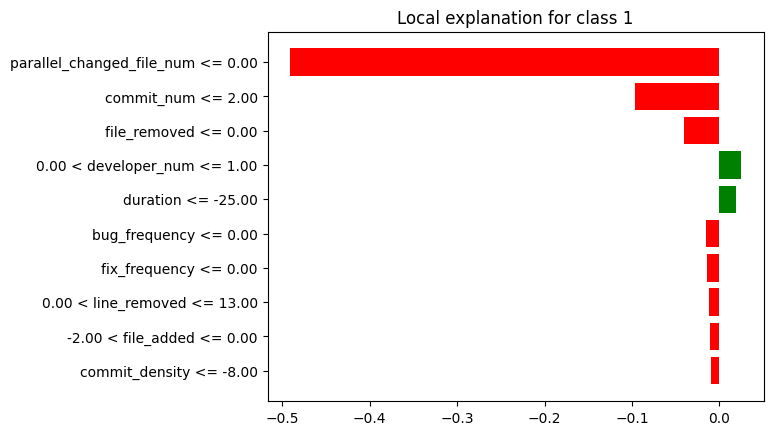

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[3, 'Variable'] = 'developer_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2               line_removed        3  Negativo
3              developer_num        4  Positivo
4              use_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Positivo
4                   duration        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'line_removed', 'developer_num', 'use_frequency']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'duration']
['file_removed', 'parallel_changed_file_num', 'line_added', 'commit_num', 'use_frequency', 'developer_num', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         2  Negativo       1  Negativo       1   
2                 line_added         -         -       5  Negativo       -   
3                 commit_num         1  Negativo       2  Negativo       2   
4              use_frequency         5  Negativo       -         -       -   
5              developer_num         4  Positivo       3  Positivo       4   
6               line_removed         3  Negativo       4  Negativo       -   
7                   duration         -         -       -         -       5   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3  Negativo  
4         -  
5  Positivo  
6         -  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "line_removed", "developer_num", "use_frequency", "line_added", "file_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       2  Negativo       2   
parallel_changed_file_num         2  Negativo       1  Negativo       1   
line_removed                      3  Negativo       4  Negativo       -   
developer_num                     4  Positivo       3  Positivo       4   
use_frequency                     5  Negativo       -         -       -   
line_added                        -         -       5  Negativo       -   
file_removed                      -         -       -         -       3   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_num                 Negativo  
parallel_changed_file_num  Negativo  
line_removed                      -  
developer_num              Positivo  
use_frequency                     -  
line_added                        -  
file_removed               Negativo  
duration                   Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

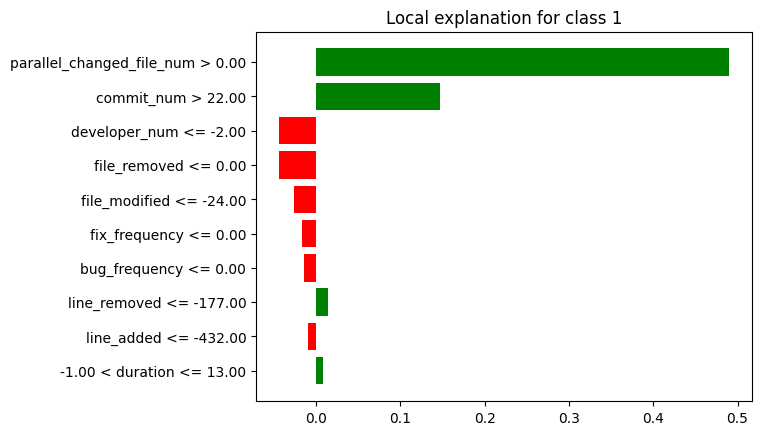

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Negativo
2              developer_num        3  Negativo
3                 line_added        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4              file_modified        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'file_modified', 'developer_num', 'line_added', 'commit_num']
['parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_modified']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         4  Positivo       -         -       -   
3              file_modified         2  Negativo       2  Negativo       5   
4                 commit_num         5  Positivo       3  Positivo       2   
5              developer_num         3  Negativo       4  Negativo       3   
6                 file_added         -         -       5  Positivo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Negativo  
4  Positivo  
5  Negativo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_modified", "developer_num", "line_added", "commit_num", "file_added", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_modified                     2  Negativo       2  Negativo       5   
developer_num                     3  Negativo       4  Negativo       3   
line_added                        4  Positivo       -         -       -   
commit_num                        5  Positivo       3  Positivo       2   
file_added                        -         -       5  Positivo       -   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_modified              Negativo  
developer_num              Negativo  
line_added                        -  
commit_num                 Positivo  
file_added                        -  
file_removed               Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

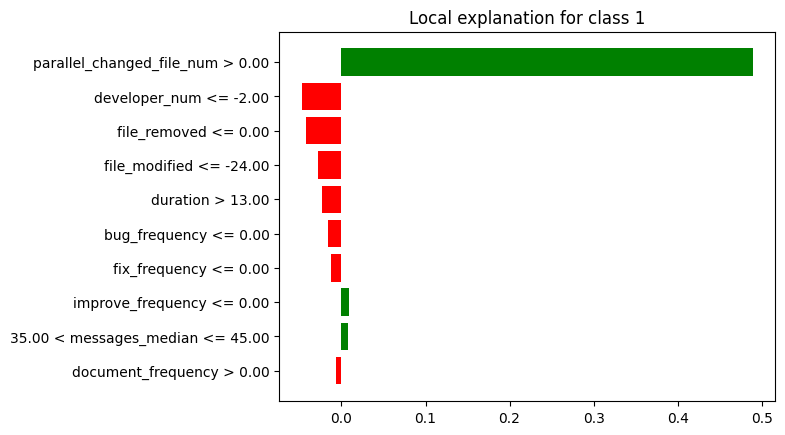

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3             commit_density        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3              file_modified        4  Negativo
4                   duration        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'duration']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'commit_density', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_modified', 'duration']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'commit_density', 'developer_num', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         4  Negativo       5  Negativo       -   
3              file_modified         -         -       -         -       4   
4                 commit_num         3  Positivo       3  Positivo       -   
5             commit_density         -         -       4  Negativo       -   
6              developer_num         2  Negativo       2  Negativo       2   
7                   duration         5  Positivo       -         -       5   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Negativo  
4         -  
5         -  
6  Negativo  
7  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "duration", "commit_density", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Positivo       3  Positivo       -   
line_added                        4  Negativo       5  Negativo       -   
duration                          5  Positivo       -         -       5   
commit_density                    -         -       4  Negativo       -   
file_removed                      -         -       -         -       3   
file_modified                     -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                        -  
line_added                        -  
duration                   Negativo  
commit_density                    -  
file_removed               Negativo  
file_modified              Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('line_removed', 3), ('developer_num', 4), ('use_frequency', 5), ('parallel_changed_file_num', 1), ('file_modified', 2), ('developer_num', 3), ('line_added', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('duration', 5)], 'Shapley': [('commit_num', 2), ('parallel_changed_file_num', 1), ('line_removed', 4), ('developer_num', 3), ('line_added', 5), ('parallel_changed_file_num', 1), ('file_modified', 2), ('developer_num', 4), ('commit_num', 3), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 5), ('commit_density', 4)], 'Lime': [('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 4), ('file_removed', 3), ('duration', 5), ('parallel_changed_file_num', 1), ('file_modified', 5), ('developer_num', 3), ('commit_num', 2), ('file_removed', 4), ('parallel_changed_file_num', 1), ('de

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                        3.0      1           4.0      1   
file_added                            -      -           5.0      1   
developer_num                       3.0      3           3.0      3   
commit_density                        -      -           4.0      1   
commit_num                          3.0      3      2.666667      3   
use_frequency                       5.0      1             -      -   
file_modified                       2.0      1           2.0      1   
line_added                          4.0      2           5.0      2   
parallel_changed_file_num      1.333333      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                            5.0      2  
line_removed                          -      -  
file_added                            -      -  
developer_num                       3.0      3  
commit_density                        -      -  
commit_num                          2.0      2  
use_frequency                         -      -  
file_modified                       4.5      2  
line_added                            -      -  
parallel_changed_file_num           1.0      3  
file_removed                   3.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fn[("General", "Conteo Total")] = df_resumen_brf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                        3.0      1           4.0      1   
file_added                            -      -           5.0      1   
developer_num                       3.0      3           3.0      3   
commit_density                        -      -           4.0      1   
commit_num                          3.0      3      2.666667      3   
use_frequency                       5.0      1             -      -   
file_modified                       2.0      1           2.0      1   
line_added                          4.0      2           5.0      2   
parallel_changed_file_num      1.333333      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                            5.0      2  5.000000            3  
line_removed                          -      -  3.500000            2  
file_added                            -      -  5.000000            1  
developer_num                       3.0      3  3.000000            9  
commit_density                        -      -  4.000000            1  
commit_num                          2.0      2  2.555556            8  
use_frequency                         -      -  5.000000            1  
file_modified                       4.5      2  2.833333            4  
line_added                            -      -  4.500000            4  
parallel_changed_file_num           1.0      3  1.111111            9  
file_removed                   3.333333      3  3.333333            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fn[("General", "Peso Conteo")] = df_resumen_brf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fn[("General", "Puntaje")] = df_resumen_brf_fn[("General", "Peso Rango")] + df_resumen_brf_fn[("General", "Peso Conteo")]
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                        3.0      1           4.0      1   
file_added                            -      -           5.0      1   
developer_num                       3.0      3           3.0      3   
commit_density                        -      -           4.0      1   
commit_num                          3.0      3      2.666667      3   
use_frequency                       5.0      1             -      -   
file_modified                       2.0      1           2.0      1   
line_added                          4.0      2           5.0      2   
parallel_changed_file_num      1.333333      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                            5.0      2     8.0            3  
line_removed                          -      -     7.0            2  
file_added                            -      -    10.0            1  
developer_num                       3.0      3     3.0            9  
commit_density                        -      -     9.0            1  
commit_num                          2.0      2     2.0            8  
use_frequency                         -      -    10.0            1  
file_modified                       4.5      2     4.0            4  
line_added                            -      -     6.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                   3.333333      3     5.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fn = df_resumen_brf_fn[new_columns]

In [ ]:
df_resumen_brf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fn[(tech, "Ranking Medio")] = df_resumen_brf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
commit_num                    2.0            8          3.00      3   
developer_num                 3.0            9          3.00      3   
file_modified                 4.0            4          2.00      1   
file_removed                  5.0            3             -      -   
line_added                    6.0            4          4.00      2   
line_removed                  7.0            2          3.00      1   
duration                      8.0            3          5.00      1   
commit_density                9.0            1             -      -   
file_added                   10.0            1             -      -   
use_frequency                10.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.67      3          2.00      2  
developer_num                      3.00      3          3.00      3  
file_modified                      2.00      1          4.50      2  
file_removed                          -      -          3.33      3  
line_added                         5.00      2             -      -  
line_removed                       4.00      1             -      -  
duration                              -      -          5.00      2  
commit_density                     4.00      1             -      -  
file_added                         5.00      1             -      -  
use_frequency                         -      -             -      -

## **GradientBoosting:**

**FEATURE IMPORTANCE**

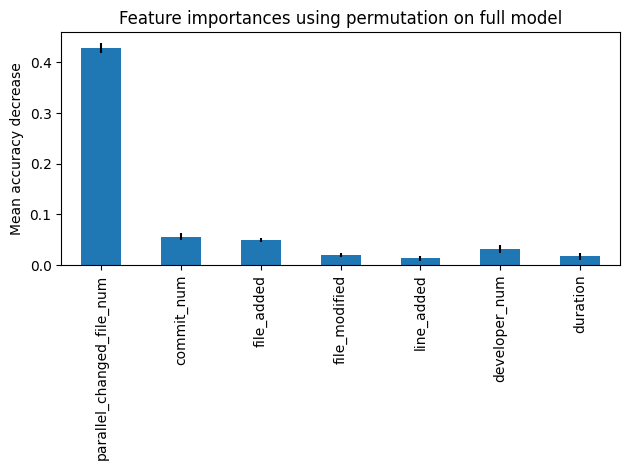

In [ ]:
permu = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

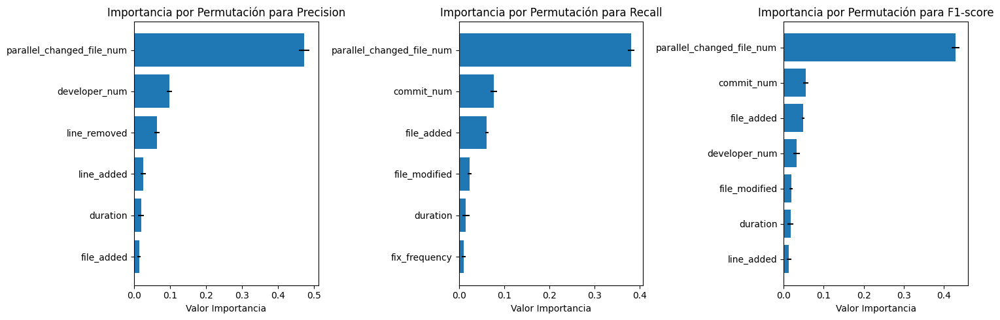

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_gb = {}

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_gb[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_gb['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.473395,0.014947
4,developer_num,0.098135,0.007603
3,line_removed,0.063919,0.007150
2,line_added,0.025466,0.006450
5,duration,0.019670,0.008024
1,file_added,0.014446,0.004650


In [ ]:
results_global_gb['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.380718,0.007177
1,commit_num,0.077788,0.007248
2,file_added,0.061957,0.004103
3,file_modified,0.023913,0.004394
4,duration,0.015359,0.007902
5,fix_frequency,0.010350,0.004253


In [ ]:
results_global_gb['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.428247,0.009616
1,commit_num,0.055904,0.006559
2,file_added,0.048758,0.003868
5,developer_num,0.032036,0.008041
3,file_modified,0.018602,0.003953
6,duration,0.017311,0.007174
4,line_added,0.013380,0.005724


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_gb, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 34617 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 34617 values
  -> model_class       : sklearn.ensemble._gb.GradientBoostingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7b2570ce4940> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 5.05e-07, mean = 0.0714, max = 0.999
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.463, mean = -1.81e-05, max = 0.783
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

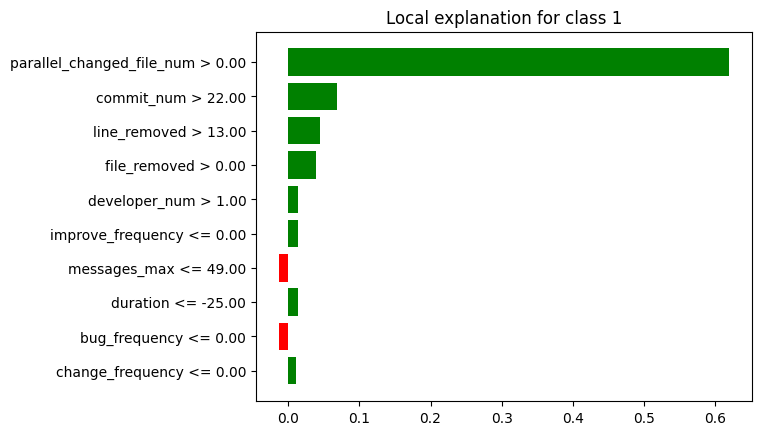

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3               line_removed        4  Positivo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'line_removed', 'file_removed', 'duration']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_removed', 'file_added']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'developer_num']
['file_removed', 'parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         4  Positivo       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 commit_num         -         -       3  Positivo       2   
3              developer_num         2  Positivo       2  Positivo       5   
4                 file_added         -         -       5  Positivo       -   
5               line_removed         3  Positivo       4  Positivo       3   
6                   duration         5  Positivo       -         -       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4         -  
5  Positivo  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "line_removed","file_removed", "duration", "commit_num", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       5   
line_removed                      3  Positivo       4  Positivo       3   
file_removed                      4  Positivo       -         -       4   
duration                          5  Positivo       -         -       -   
commit_num                        -         -       3  Positivo       2   
file_added                        -         -       5  Positivo       -   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
line_removed               Positivo  
file_removed               Positivo  
duration                          -  
commit_num                 Positivo  
file_added                        -

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

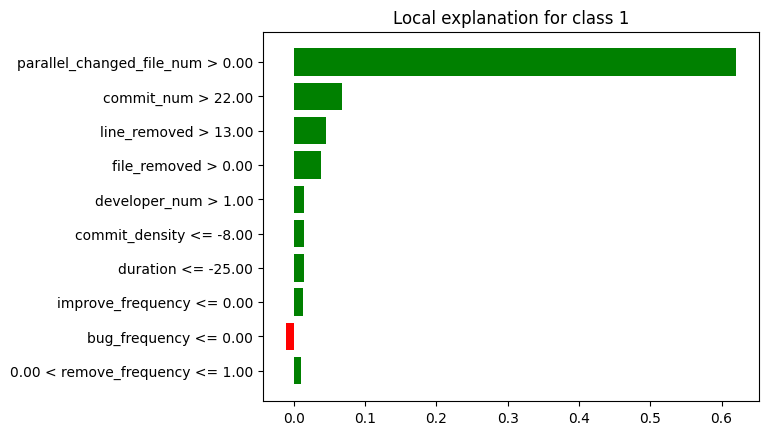

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0              developer_num        1  Negativo
1                 file_added        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4  parallel_changed_file_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1           remove_frequency        2  Positivo
2                 file_added        3  Positivo
3                 commit_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['developer_num', 'file_added', 'line_removed', 'file_removed', 'parallel_changed_file_num']
['parallel_changed_file_num', 'remove_frequency', 'file_added', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'developer_num']
['file_removed', 'parallel_changed_file_num', 'remove_frequency', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         4  Positivo       -         -       4   
1  parallel_changed_file_num         5  Positivo       1  Positivo       1   
2           remove_frequency         -         -       2  Positivo       -   
3                 commit_num         -         -       4  Positivo       2   
4              developer_num         1  Negativo       -         -       5   
5                 file_added         2  Positivo       3  Positivo       -   
6               line_removed         3  Positivo       5  Positivo       3   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5         -  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["developer_num", "file_added", "line_removed", "file_removed", "parallel_changed_file_num", "remove_frequency", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
developer_num                     1  Negativo       -         -       5   
file_added                        2  Positivo       3  Positivo       -   
line_removed                      3  Positivo       5  Positivo       3   
file_removed                      4  Positivo       -         -       4   
parallel_changed_file_num         5  Positivo       1  Positivo       1   
remove_frequency                  -         -       2  Positivo       -   
commit_num                        -         -       4  Positivo       2   

                                     
                              Signo  
Variable                             
developer_num              Positivo  
file_added                        -  
line_removed               Positivo  
file_removed               Positivo  
parallel_changed_file_num  Positivo  
remove_frequency                  -  
commit_num                 Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

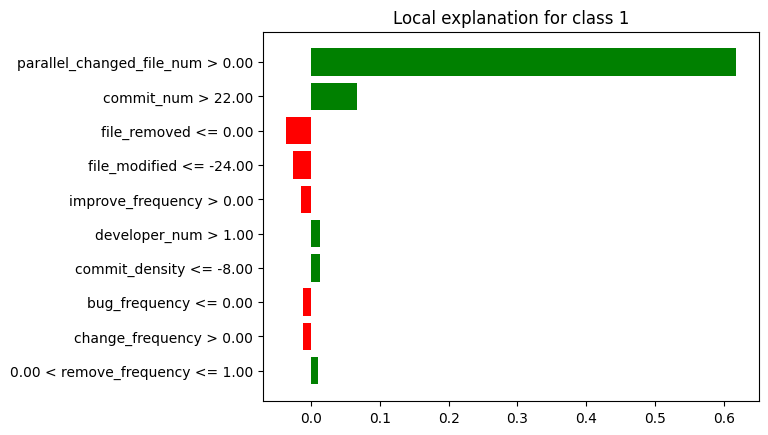

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0             commit_density        1  Negativo
1                 commit_num        2  Positivo
2  parallel_changed_file_num        3  Positivo
3               line_removed        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1             commit_density        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3              file_modified        4  Negativo
4          improve_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['commit_density', 'commit_num', 'parallel_changed_file_num', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'commit_density', 'commit_num', 'developer_num', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_modified', 'improve_frequency']
['file_removed', 'improve_frequency', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'commit_density', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1          improve_frequency         -         -       -         -       5   
2  parallel_changed_file_num         3  Positivo       1  Positivo       1   
3              file_modified         -         -       5  Positivo       4   
4                 commit_num         2  Positivo       3  Positivo       2   
5             commit_density         1  Negativo       2  Negativo       -   
6              developer_num         5  Positivo       4  Positivo       -   
7               line_removed         4  Positivo       -         -       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Positivo  
3  Negativo  
4  Positivo  
5         -  
6         -  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["commit_density", "commit_num", "parallel_changed_file_num", "line_removed", "developer_num", "file_modified",  "file_removed", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_density                    1  Negativo       2  Negativo       -   
commit_num                        2  Positivo       3  Positivo       2   
parallel_changed_file_num         3  Positivo       1  Positivo       1   
line_removed                      4  Positivo       -         -       -   
developer_num                     5  Positivo       4  Positivo       -   
file_modified                     -         -       5  Positivo       4   
file_removed                      -         -       -         -       3   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_density                    -  
commit_num                 Positivo  
parallel_changed_file_num  Positivo  
line_removed                      -  
developer_num                     -  
file_modified              Negativo  
file_removed               Negativo  
improve_frequency          Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 3), ('file_removed', 4), ('duration', 5), ('developer_num', 1), ('file_added', 2), ('line_removed', 3), ('file_removed', 4), ('parallel_changed_file_num', 5), ('commit_density', 1), ('commit_num', 2), ('parallel_changed_file_num', 3), ('line_removed', 4), ('developer_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 4), ('commit_num', 3), ('file_added', 5), ('file_added', 3), ('line_removed', 5), ('parallel_changed_file_num', 1), ('remove_frequency', 2), ('commit_num', 4), ('commit_density', 2), ('commit_num', 3), ('parallel_changed_file_num', 1), ('developer_num', 4), ('file_modified', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 5), ('line_removed', 3), ('file_removed', 4), ('commit_num', 2), ('developer_num', 5), ('line_removed', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('commit_num', 2), ('par

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                   3.333333      3           4.5      2   
file_added                          2.0      1           4.0      2   
developer_num                  2.666667      3           3.0      2   
commit_density                      1.0      1           2.0      1   
commit_num                          2.0      1      3.333333      3   
file_modified                         -      -           5.0      1   
remove_frequency                      -      -           2.0      1   
parallel_changed_file_num           3.0      3           1.0      3   
improve_frequency                     -      -             -      -   
file_removed                        4.0      2             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
line_removed                        3.0      2  
file_added                            -      -  
developer_num                       5.0      2  
commit_density                        -      -  
commit_num                          2.0      3  
file_modified                       4.0      1  
remove_frequency                      -      -  
parallel_changed_file_num           1.0      3  
improve_frequency                   5.0      1  
file_removed                   3.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vp[("General", "Conteo Total")] = df_resumen_gb_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                   3.333333      3           4.5      2   
file_added                          2.0      1           4.0      2   
developer_num                  2.666667      3           3.0      2   
commit_density                      1.0      1           2.0      1   
commit_num                          2.0      1      3.333333      3   
file_modified                         -      -           5.0      1   
remove_frequency                      -      -           2.0      1   
parallel_changed_file_num           3.0      3           1.0      3   
improve_frequency                     -      -             -      -   
file_removed                        4.0      2             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  5.000000            1  
line_removed                        3.0      2  3.611111            7  
file_added                            -      -  3.000000            3  
developer_num                       5.0      2  3.555556            7  
commit_density                        -      -  1.500000            2  
commit_num                          2.0      3  2.444444            7  
file_modified                       4.0      1  4.500000            2  
remove_frequency                      -      -  2.000000            1  
parallel_changed_file_num           1.0      3  1.666667            9  
improve_frequency                   5.0      1  5.000000            1  
file_removed                   3.666667      3  3.833333            5

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vp[("General", "Peso Conteo")] = df_resumen_gb_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vp[("General", "Puntaje")] = df_resumen_gb_vp[("General", "Peso Rango")] + df_resumen_gb_vp[("General", "Peso Conteo")]
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1             -      -   
line_removed                   3.333333      3           4.5      2   
file_added                          2.0      1           4.0      2   
developer_num                  2.666667      3           3.0      2   
commit_density                      1.0      1           2.0      1   
commit_num                          2.0      1      3.333333      3   
file_modified                         -      -           5.0      1   
remove_frequency                      -      -           2.0      1   
parallel_changed_file_num           3.0      3           1.0      3   
improve_frequency                     -      -             -      -   
file_removed                        4.0      2             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -    10.0            1  
line_removed                        3.0      2     5.0            7  
file_added                            -      -     6.0            3  
developer_num                       5.0      2     4.0            7  
commit_density                        -      -     3.0            2  
commit_num                          2.0      3     2.0            7  
file_modified                       4.0      1     9.0            2  
remove_frequency                      -      -     7.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
improve_frequency                   5.0      1    10.0            1  
file_removed                   3.666667      3     7.0            5

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vp = df_resumen_gb_vp[new_columns]

In [ ]:
df_resumen_gb_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vp[(tech, "Ranking Medio")] = df_resumen_gb_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          3.00      3   
commit_num                    2.0            7          2.00      1   
commit_density                3.0            2          1.00      1   
developer_num                 4.0            7          2.67      3   
line_removed                  5.0            7          3.33      3   
file_added                    6.0            3          2.00      1   
remove_frequency              7.0            1             -      -   
file_removed                  7.0            5          4.00      2   
file_modified                 9.0            2             -      -   
duration                     10.0            1          5.00      1   
improve_frequency            10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.33      3          2.00      3  
commit_density                     2.00      1             -      -  
developer_num                      3.00      2          5.00      2  
line_removed                       4.50      2          3.00      2  
file_added                         4.00      2             -      -  
remove_frequency                   2.00      1             -      -  
file_removed                          -      -          3.67      3  
file_modified                      5.00      1          4.00      1  
duration                              -      -             -      -  
improve_frequency                     -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

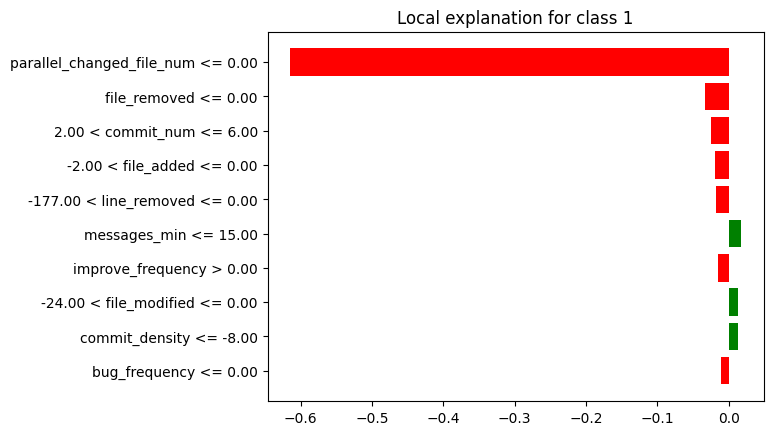

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[2, 'Variable'] = 'commit_num'
lime_vn_df_max.at[3, 'Variable'] = 'file_added'
lime_vn_df_max.at[4, 'Variable'] = 'line_removed'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

            Variable  Ranking     Signo
0         file_added        1  Negativo
1         commit_num        2  Negativo
2  improve_frequency        3  Negativo
3       line_removed        4  Positivo
4      developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2                 file_added        3  Negativo
3          improve_frequency        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Negativo
2                 commit_num        3  Negativo
3                 file_added        4  Negativo
4               line_removed        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['file_added', 'commit_num', 'improve_frequency', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_added', 'improve_frequency', 'duration']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'file_added', 'line_removed']
['file_removed', 'parallel_changed_file_num', 'improve_frequency', 'commit_num', 'developer_num', 'file_added', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1  parallel_changed_file_num         -         -       1  Negativo       1   
2          improve_frequency         3  Negativo       4  Negativo       -   
3                 commit_num         2  Negativo       2  Negativo       3   
4              developer_num         5  Positivo       -         -       -   
5                 file_added         1  Negativo       3  Negativo       4   
6               line_removed         4  Positivo       -         -       5   
7                   duration         -         -       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3  Negativo  
4         -  
5  Negativo  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["file_added", "commit_num", "improve_frequency", "line_removed", "developer_num", "parallel_changed_file_num", "duration", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
file_added                        1  Negativo       3  Negativo       4   
commit_num                        2  Negativo       2  Negativo       3   
improve_frequency                 3  Negativo       4  Negativo       -   
line_removed                      4  Positivo       -         -       5   
developer_num                     5  Positivo       -         -       -   
parallel_changed_file_num         -         -       1  Negativo       1   
duration                          -         -       5  Negativo       -   
file_removed                      -         -       -         -       2   

                                     
                              Signo  
Variable                             
file_added                 Negativo  
commit_num                 Negativo  
improve_frequency                 -  
line_removed               Negativo  
developer_num                     -  
parallel_changed_file_num  Negativo  
duration                          -  
file_removed               Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

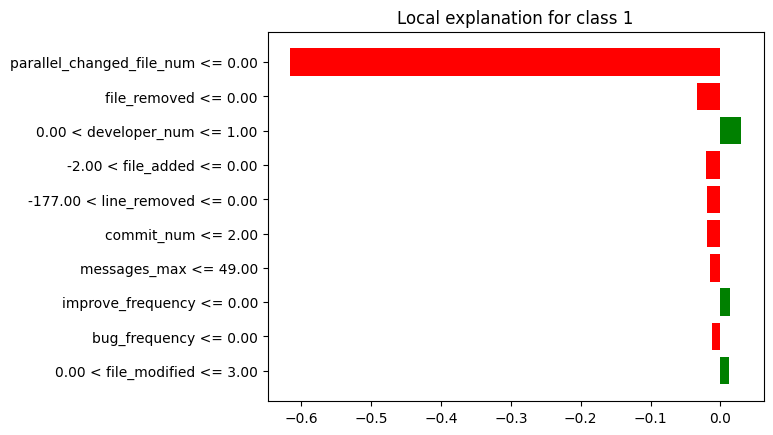

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[3, 'Variable'] = 'file_added'
lime_vn_df_mediana.at[4, 'Variable'] = 'line_removed'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2              file_modified        3  Positivo
3               messages_max        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 line_added        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Negativo
2              developer_num        3  Positivo
3                 file_added        4  Negativo
4               line_removed        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'file_modified', 'messages_max', 'file_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'file_removed', 'developer_num', 'file_added', 'line_removed']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'messages_max', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1  parallel_changed_file_num         1  Negativo       1  Negativo       1   
2                 line_added         -         -       4  Positivo       -   
3              file_modified         3  Positivo       -         -       -   
4               messages_max         4  Positivo       -         -       -   
5                 commit_num         -         -       3  Negativo       -   
6              developer_num         2  Positivo       2  Positivo       3   
7                 file_added         5  Negativo       5  Negativo       4   
8               line_removed         -         -       -         -       5   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3         -  
4         -  
5         -  
6  Positivo  
7  Negativo  
8  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "file_modified", "messages_max", "file_added", "commit_num", "line_added", "file_removed", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Positivo       2  Positivo       3   
file_modified                     3  Positivo       -         -       -   
messages_max                      4  Positivo       -         -       -   
file_added                        5  Negativo       5  Negativo       4   
commit_num                        -         -       3  Negativo       -   
line_added                        -         -       4  Positivo       -   
file_removed                      -         -       -         -       2   
line_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Positivo  
file_modified                     -  
messages_max                      -  
file_added                 Negativo  
commit_num                        -  
line_added                        -  
file_removed               Negativo  
line_removed               Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

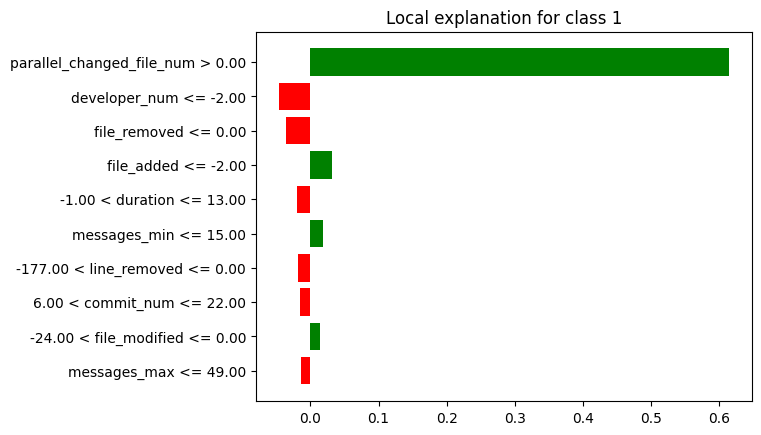

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[4, 'Variable'] = 'duration'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1               messages_max        2  Positivo
2  parallel_changed_file_num        3  Positivo
3               line_removed        4  Positivo
4               messages_min        5  Positivo
                    Variable  Ranking     Signo
0               messages_max        1  Positivo
1  parallel_changed_file_num        2  Positivo
2              developer_num        3  Negativo
3                 commit_num        4  Negativo
4               messages_min        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4                   duration        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['commit_num', 'messages_max', 'parallel_changed_file_num', 'line_removed', 'messages_min']
['messages_max', 'parallel_changed_file_num', 'developer_num', 'commit_num', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_added', 'duration']
['file_removed', 'parallel_changed_file_num', 'messages_max', 'commit_num', 'file_added', 'developer_num', 'messages_min', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         3  Positivo       2  Positivo       1   
2               messages_max         2  Positivo       1  Positivo       -   
3                 commit_num         1  Negativo       4  Negativo       -   
4                 file_added         -         -       -         -       4   
5              developer_num         -         -       3  Negativo       2   
6               messages_min         5  Positivo       5  Positivo       -   
7               line_removed         4  Positivo       -         -       -   
8                   duration         -         -       -         -       5   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5  Negativo  
6         -  
7         -  
8  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "messages_max", "parallel_changed_file_num", "line_removed", "messages_min", "developer_num", "file_removed", "file_added", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       4  Negativo       -   
messages_max                      2  Positivo       1  Positivo       -   
parallel_changed_file_num         3  Positivo       2  Positivo       1   
line_removed                      4  Positivo       -         -       -   
messages_min                      5  Positivo       5  Positivo       -   
developer_num                     -         -       3  Negativo       2   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   
duration                          -         -       -         -       5   

                                     
                              Signo  
Variable                             
commit_num                        -  
messages_max                      -  
parallel_changed_file_num  Positivo  
line_removed                      -  
messages_min                      -  
developer_num              Negativo  
file_removed               Negativo  
file_added                 Positivo  
duration                   Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('file_added', 1), ('commit_num', 2), ('improve_frequency', 3), ('line_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_modified', 3), ('messages_max', 4), ('file_added', 5), ('commit_num', 1), ('messages_max', 2), ('parallel_changed_file_num', 3), ('line_removed', 4), ('messages_min', 5)], 'Shapley': [('file_added', 3), ('commit_num', 2), ('improve_frequency', 4), ('parallel_changed_file_num', 1), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_added', 5), ('commit_num', 3), ('line_added', 4), ('commit_num', 4), ('messages_max', 1), ('parallel_changed_file_num', 2), ('messages_min', 5), ('developer_num', 3)], 'Lime': [('file_added', 4), ('commit_num', 3), ('line_removed', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('parallel_changed_file_num', 1), ('developer_num', 3), ('file_added', 4), ('file_removed', 2), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -           5.0      1   
line_removed                        4.0      2             -      -   
file_added                          3.0      2           4.0      2   
developer_num                       3.5      2           2.5      2   
messages_min                        5.0      1           5.0      1   
commit_num                          1.5      2           3.0      3   
messages_max                        3.0      2           1.0      1   
file_modified                       3.0      1             -      -   
line_added                            -      -           4.0      1   
improve_frequency                   3.0      1           4.0      1   
parallel_changed_file_num           2.0      2      1.333333      3   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                            5.0      1  
line_removed                        5.0      2  
file_added                          4.0      3  
developer_num                       2.5      2  
messages_min                          -      -  
commit_num                          3.0      1  
messages_max                          -      -  
file_modified                         -      -  
line_added                            -      -  
improve_frequency                     -      -  
parallel_changed_file_num           1.0      3  
file_removed                   2.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vn[("General", "Conteo Total")] = df_resumen_gb_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -           5.0      1   
line_removed                        4.0      2             -      -   
file_added                          3.0      2           4.0      2   
developer_num                       3.5      2           2.5      2   
messages_min                        5.0      1           5.0      1   
commit_num                          1.5      2           3.0      3   
messages_max                        3.0      2           1.0      1   
file_modified                       3.0      1             -      -   
line_added                            -      -           4.0      1   
improve_frequency                   3.0      1           4.0      1   
parallel_changed_file_num           2.0      2      1.333333      3   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                            5.0      1  5.000000            2  
line_removed                        5.0      2  4.500000            4  
file_added                          4.0      3  3.666667            7  
developer_num                       2.5      2  2.833333            6  
messages_min                          -      -  5.000000            2  
commit_num                          3.0      1  2.500000            6  
messages_max                          -      -  2.000000            3  
file_modified                         -      -  3.000000            1  
line_added                            -      -  4.000000            1  
improve_frequency                     -      -  3.500000            2  
parallel_changed_file_num           1.0      3  1.444444            8  
file_removed                   2.333333      3  2.333333            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vn[("General", "Peso Conteo")] = df_resumen_gb_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vn[("General", "Puntaje")] = df_resumen_gb_vn[("General", "Peso Rango")] + df_resumen_gb_vn[("General", "Peso Conteo")]
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                              -      -           5.0      1   
line_removed                        4.0      2             -      -   
file_added                          3.0      2           4.0      2   
developer_num                       3.5      2           2.5      2   
messages_min                        5.0      1           5.0      1   
commit_num                          1.5      2           3.0      3   
messages_max                        3.0      2           1.0      1   
file_modified                       3.0      1             -      -   
line_added                            -      -           4.0      1   
improve_frequency                   3.0      1           4.0      1   
parallel_changed_file_num           2.0      2      1.333333      3   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                            5.0      1    11.0            2  
line_removed                        5.0      2     7.0            4  
file_added                          4.0      3     6.0            7  
developer_num                       2.5      2     3.0            6  
messages_min                          -      -    11.0            2  
commit_num                          3.0      1     2.0            6  
messages_max                          -      -     4.0            3  
file_modified                         -      -     9.0            1  
line_added                            -      -    10.0            1  
improve_frequency                     -      -     8.0            2  
parallel_changed_file_num           1.0      3     1.0            8  
file_removed                   2.333333      3     5.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vn = df_resumen_gb_vn[new_columns]

In [ ]:
df_resumen_gb_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vn[(tech, "Ranking Medio")] = df_resumen_gb_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            8          2.00      2   
commit_num                    2.0            6          1.50      2   
developer_num                 3.0            6          3.50      2   
messages_max                  4.0            3          3.00      2   
file_removed                  5.0            3             -      -   
file_added                    6.0            7          3.00      2   
line_removed                  7.0            4          4.00      2   
improve_frequency             8.0            2          3.00      1   
file_modified                 9.0            1          3.00      1   
line_added                   10.0            1             -      -   
duration                     11.0            2             -      -   
messages_min                 11.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.33      3          1.00      3  
commit_num                         3.00      3          3.00      1  
developer_num                      2.50      2          2.50      2  
messages_max                       1.00      1             -      -  
file_removed                          -      -          2.33      3  
file_added                         4.00      2          4.00      3  
line_removed                          -      -          5.00      2  
improve_frequency                  4.00      1             -      -  
file_modified                         -      -             -      -  
line_added                         4.00      1             -      -  
duration                           5.00      1          5.00      1  
messages_min                       5.00      1             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

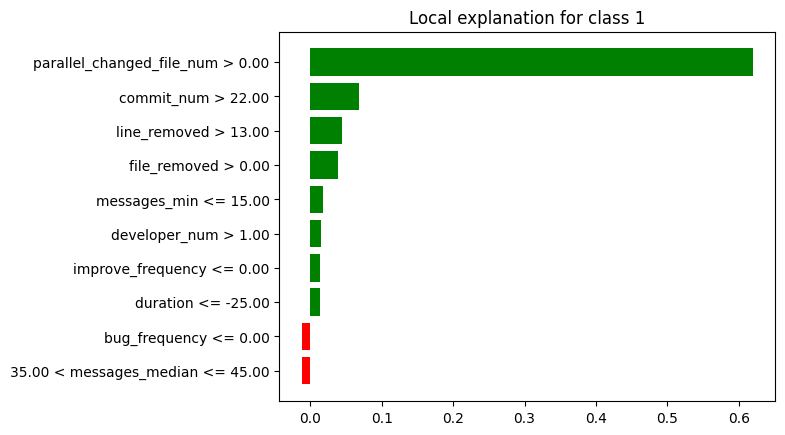

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4               messages_max        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4               messages_min        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'line_removed', 'commit_num', 'developer_num', 'duration']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'messages_max']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'messages_min']
['file_removed', 'parallel_changed_file_num', 'messages_max', 'commit_num', 'developer_num', 'messages_min', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2               messages_max         -         -       5  Positivo       -   
3                 commit_num         3  Positivo       2  Positivo       2   
4              developer_num         4  Positivo       3  Positivo       -   
5               messages_min         -         -       -         -       5   
6               line_removed         2  Positivo       4  Positivo       3   
7                   duration         5  Negativo       -         -       -   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4         -  
5  Positivo  
6  Positivo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "commit_num", "developer_num", "duration", "messages_max", "file_removed",  "messages_min"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Positivo       4  Positivo       3   
commit_num                        3  Positivo       2  Positivo       2   
developer_num                     4  Positivo       3  Positivo       -   
duration                          5  Negativo       -         -       -   
messages_max                      -         -       5  Positivo       -   
file_removed                      -         -       -         -       4   
messages_min                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed               Positivo  
commit_num                 Positivo  
developer_num                     -  
duration                          -  
messages_max                      -  
file_removed               Positivo  
messages_min               Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

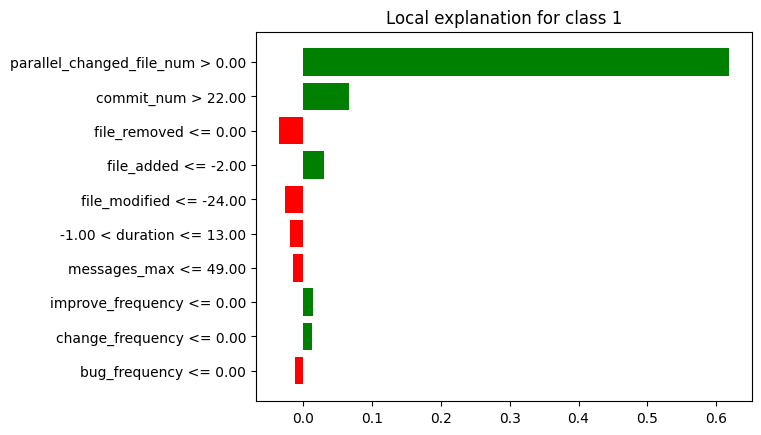

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               messages_min        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4              file_modified        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'line_removed', 'messages_min', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_added', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'file_modified']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'file_added', 'developer_num', 'messages_min', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2              file_modified         -         -       -         -       5   
3                 commit_num         2  Positivo       2  Positivo       2   
4                 file_added         -         -       3  Positivo       4   
5              developer_num         5  Positivo       4  Positivo       -   
6               messages_min         4  Positivo       5  Positivo       -   
7               line_removed         3  Positivo       -         -       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3  Positivo  
4  Positivo  
5         -  
6         -  
7         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "messages_min", "developer_num", "file_added", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_removed                      3  Positivo       -         -       -   
messages_min                      4  Positivo       5  Positivo       -   
developer_num                     5  Positivo       4  Positivo       -   
file_added                        -         -       3  Positivo       4   
file_removed                      -         -       -         -       3   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed                      -  
messages_min                      -  
developer_num                     -  
file_added                 Positivo  
file_removed               Negativo  
file_modified              Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

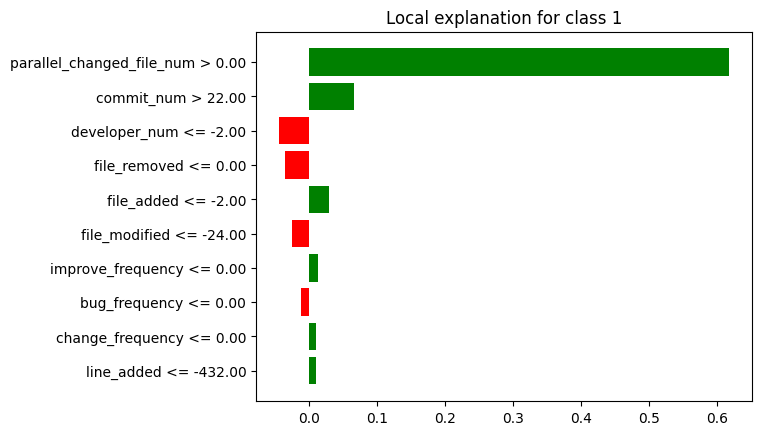

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0              developer_num        1  Negativo
1  parallel_changed_file_num        2  Positivo
2                 commit_num        3  Positivo
3                 file_added        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                   duration        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['developer_num', 'parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_added']
['file_removed', 'parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         5  Positivo       -         -       4   
1  parallel_changed_file_num         2  Positivo       1  Positivo       1   
2                 commit_num         3  Positivo       3  Positivo       2   
3              developer_num         1  Negativo       2  Negativo       3   
4                 file_added         4  Positivo       5  Positivo       5   
5                   duration         -         -       4  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Positivo  
3  Negativo  
4  Positivo  
5         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["developer_num", "parallel_changed_file_num", "commit_num", "file_added", "file_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
developer_num                     1  Negativo       2  Negativo       3   
parallel_changed_file_num         2  Positivo       1  Positivo       1   
commit_num                        3  Positivo       3  Positivo       2   
file_added                        4  Positivo       5  Positivo       5   
file_removed                      5  Positivo       -         -       4   
duration                          -         -       4  Negativo       -   

                                     
                              Signo  
Variable                             
developer_num              Negativo  
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_added                 Positivo  
file_removed               Negativo  
duration                          -

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('line_removed', 2), ('commit_num', 3), ('developer_num', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('messages_min', 4), ('developer_num', 5), ('developer_num', 1), ('parallel_changed_file_num', 2), ('commit_num', 3), ('file_added', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('line_removed', 4), ('commit_num', 2), ('developer_num', 3), ('messages_max', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('messages_min', 5), ('developer_num', 4), ('file_added', 3), ('developer_num', 2), ('parallel_changed_file_num', 1), ('commit_num', 3), ('file_added', 5), ('duration', 4)], 'Lime': [('parallel_changed_file_num', 1), ('line_removed', 3), ('commit_num', 2), ('file_removed', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 4), ('file_removed', 3), ('file_modified', 5), ('developer_num', 3), ('parallel_changed_fi

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1           4.0      1   
line_removed                        2.5      2           4.0      1   
messages_min                        4.0      1           5.0      1   
developer_num                  3.333333      3           3.0      3   
file_added                          4.0      1           4.0      2   
commit_num                     2.666667      3      2.333333      3   
messages_max                          -      -           5.0      1   
file_modified                         -      -             -      -   
parallel_changed_file_num      1.333333      3           1.0      3   
file_removed                        5.0      1             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
line_removed                        3.0      1  
messages_min                        5.0      1  
developer_num                       3.0      1  
file_added                          4.5      2  
commit_num                          2.0      3  
messages_max                          -      -  
file_modified                       5.0      1  
parallel_changed_file_num           1.0      3  
file_removed                   3.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fp[("General", "Conteo Total")] = df_resumen_gb_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1           4.0      1   
line_removed                        2.5      2           4.0      1   
messages_min                        4.0      1           5.0      1   
developer_num                  3.333333      3           3.0      3   
file_added                          4.0      1           4.0      2   
commit_num                     2.666667      3      2.333333      3   
messages_max                          -      -           5.0      1   
file_modified                         -      -             -      -   
parallel_changed_file_num      1.333333      3           1.0      3   
file_removed                        5.0      1             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  4.500000            2  
line_removed                        3.0      1  3.166667            4  
messages_min                        5.0      1  4.666667            3  
developer_num                       3.0      1  3.111111            7  
file_added                          4.5      2  4.166667            5  
commit_num                          2.0      3  2.333333            9  
messages_max                          -      -  5.000000            1  
file_modified                       5.0      1  5.000000            1  
parallel_changed_file_num           1.0      3  1.111111            9  
file_removed                   3.666667      3  4.333333            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fp[("General", "Peso Conteo")] = df_resumen_gb_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fp[("General", "Puntaje")] = df_resumen_gb_fp[("General", "Peso Rango")] + df_resumen_gb_fp[("General", "Peso Conteo")]
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1           4.0      1   
line_removed                        2.5      2           4.0      1   
messages_min                        4.0      1           5.0      1   
developer_num                  3.333333      3           3.0      3   
file_added                          4.0      1           4.0      2   
commit_num                     2.666667      3      2.333333      3   
messages_max                          -      -           5.0      1   
file_modified                         -      -             -      -   
parallel_changed_file_num      1.333333      3           1.0      3   
file_removed                        5.0      1             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -     8.0            2  
line_removed                        3.0      1     5.0            4  
messages_min                        5.0      1     7.0            3  
developer_num                       3.0      1     3.0            7  
file_added                          4.5      2     4.0            5  
commit_num                          2.0      3     2.0            9  
messages_max                          -      -     9.0            1  
file_modified                       5.0      1     9.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                   3.666667      3     6.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fp = df_resumen_gb_fp[new_columns]

In [ ]:
df_resumen_gb_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fp[(tech, "Ranking Medio")] = df_resumen_gb_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.33      3   
commit_num                    2.0            9          2.67      3   
developer_num                 3.0            7          3.33      3   
file_added                    4.0            5          4.00      1   
line_removed                  5.0            4          2.50      2   
file_removed                  6.0            4          5.00      1   
messages_min                  7.0            3          4.00      1   
duration                      8.0            2          5.00      1   
messages_max                  9.0            1             -      -   
file_modified                 9.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.00      3  
developer_num                      3.00      3          3.00      1  
file_added                         4.00      2          4.50      2  
line_removed                       4.00      1          3.00      1  
file_removed                          -      -          3.67      3  
messages_min                       5.00      1          5.00      1  
duration                           4.00      1             -      -  
messages_max                       5.00      1             -      -  
file_modified                         -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

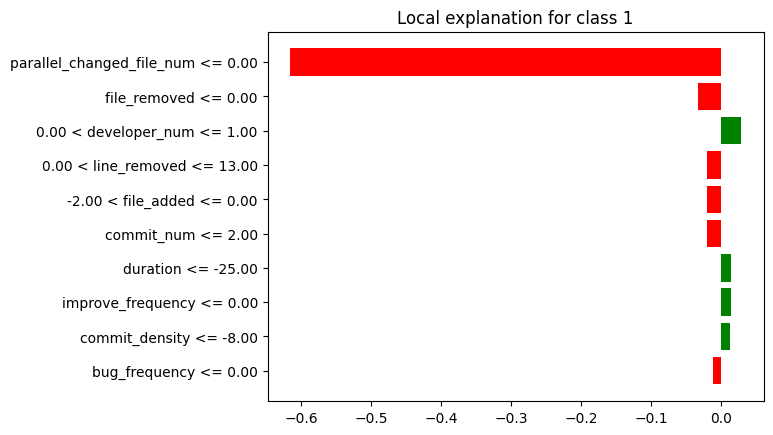

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[2, 'Variable'] = 'developer_num'
lime_fn_df_max.at[3, 'Variable'] = 'line_removed'
lime_fn_df_max.at[4, 'Variable'] = 'file_added'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0                 commit_num        1  Negativo
1  parallel_changed_file_num        2  Negativo
2              developer_num        3  Positivo
3                 file_added        4  Negativo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 file_added        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4                 file_added        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['commit_num', 'parallel_changed_file_num', 'developer_num', 'file_added', 'duration']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'file_removed', 'developer_num', 'line_removed', 'file_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'file_added', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1  parallel_changed_file_num         2  Negativo       1  Negativo       1   
2                 line_added         -         -       5  Positivo       -   
3                 commit_num         1  Negativo       3  Negativo       -   
4              developer_num         3  Positivo       2  Positivo       3   
5                 file_added         4  Negativo       4  Negativo       5   
6               line_removed         -         -       -         -       4   
7                   duration         5  Positivo       -         -       -   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3         -  
4  Positivo  
5  Negativo  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["commit_num", "parallel_changed_file_num", "developer_num", "file_added", "duration", "line_added", "file_removed", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
commit_num                        1  Negativo       3  Negativo       -   
parallel_changed_file_num         2  Negativo       1  Negativo       1   
developer_num                     3  Positivo       2  Positivo       3   
file_added                        4  Negativo       4  Negativo       5   
duration                          5  Positivo       -         -       -   
line_added                        -         -       5  Positivo       -   
file_removed                      -         -       -         -       2   
line_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
commit_num                        -  
parallel_changed_file_num  Negativo  
developer_num              Positivo  
file_added                 Negativo  
duration                          -  
line_added                        -  
file_removed               Negativo  
line_removed               Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

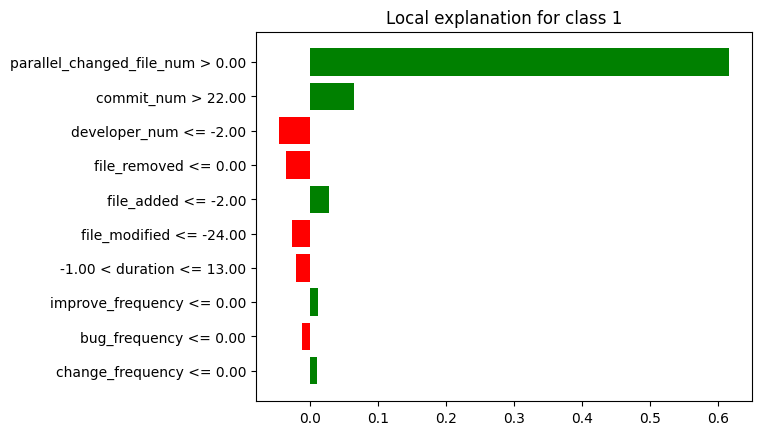

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0                 line_added        1  Negativo
1  parallel_changed_file_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0              developer_num        1  Negativo
1              file_modified        2  Negativo
2  parallel_changed_file_num        3  Positivo
3                 line_added        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['line_added', 'parallel_changed_file_num', 'file_added', 'file_modified', 'file_removed']
['developer_num', 'file_modified', 'parallel_changed_file_num', 'line_added', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         5  Negativo       -         -       4   
1  parallel_changed_file_num         2  Positivo       3  Positivo       1   
2                 line_added         1  Negativo       4  Negativo       -   
3              file_modified         4  Negativo       2  Negativo       -   
4                 commit_num         -         -       -         -       2   
5              developer_num         -         -       1  Negativo       3   
6                 file_added         3  Positivo       5  Positivo       5   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5  Negativo  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["line_added", "parallel_changed_file_num", "file_added", "file_modified", "file_removed", "developer_num","commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
line_added                        1  Negativo       4  Negativo       -   
parallel_changed_file_num         2  Positivo       3  Positivo       1   
file_added                        3  Positivo       5  Positivo       5   
file_modified                     4  Negativo       2  Negativo       -   
file_removed                      5  Negativo       -         -       4   
developer_num                     -         -       1  Negativo       3   
commit_num                        -         -       -         -       2   

                                     
                              Signo  
Variable                             
line_added                        -  
parallel_changed_file_num  Positivo  
file_added                 Positivo  
file_modified                     -  
file_removed               Negativo  
developer_num              Negativo  
commit_num                 Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

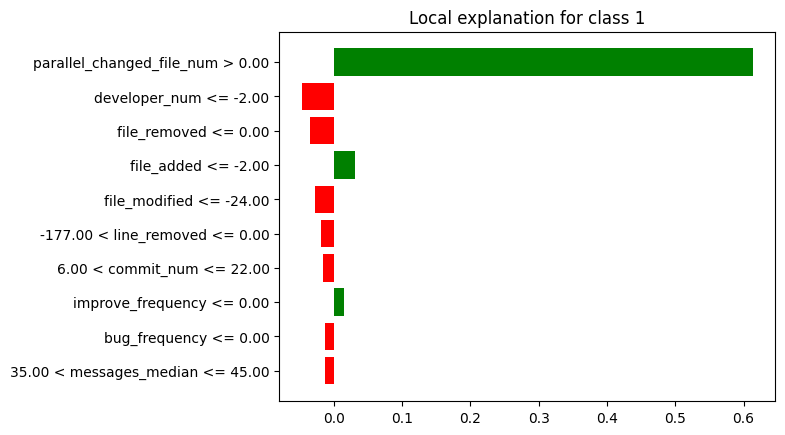

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0                   duration        1  Negativo
1  parallel_changed_file_num        2  Positivo
2                 file_added        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2                 file_added        3  Positivo
3              developer_num        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4              file_modified        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['duration', 'parallel_changed_file_num', 'file_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'duration', 'file_added', 'developer_num', 'line_added']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_added', 'file_modified']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'developer_num', 'file_added', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         2  Positivo       1  Positivo       1   
2                 line_added         -         -       5  Negativo       -   
3              file_modified         4  Negativo       -         -       5   
4              developer_num         5  Negativo       4  Negativo       2   
5                 file_added         3  Positivo       3  Positivo       4   
6                   duration         1  Negativo       2  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Negativo  
4  Negativo  
5  Positivo  
6         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["duration", "parallel_changed_file_num", "file_added", "file_modified", "developer_num", "line_added", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
duration                          1  Negativo       2  Negativo       -   
parallel_changed_file_num         2  Positivo       1  Positivo       1   
file_added                        3  Positivo       3  Positivo       4   
file_modified                     4  Negativo       -         -       5   
developer_num                     5  Negativo       4  Negativo       2   
line_added                        -         -       5  Negativo       -   
file_removed                      -         -       -         -       3   

                                     
                              Signo  
Variable                             
duration                          -  
parallel_changed_file_num  Positivo  
file_added                 Positivo  
file_modified              Negativo  
developer_num              Negativo  
line_added                        -  
file_removed               Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('commit_num', 1), ('parallel_changed_file_num', 2), ('developer_num', 3), ('file_added', 4), ('duration', 5), ('line_added', 1), ('parallel_changed_file_num', 2), ('file_added', 3), ('file_modified', 4), ('file_removed', 5), ('duration', 1), ('parallel_changed_file_num', 2), ('file_added', 3), ('file_modified', 4), ('developer_num', 5)], 'Shapley': [('commit_num', 3), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_added', 4), ('line_added', 5), ('line_added', 4), ('parallel_changed_file_num', 3), ('file_added', 5), ('file_modified', 2), ('developer_num', 1), ('duration', 2), ('parallel_changed_file_num', 1), ('file_added', 3), ('developer_num', 4), ('line_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 3), ('file_added', 5), ('file_removed', 2), ('line_removed', 4), ('parallel_changed_file_num', 1), ('file_added', 5), ('file_removed', 4), ('developer_num', 3), ('commit_num', 2), ('parallel_changed_file_num', 1), ('file_added', 4

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      2           2.0      1   
line_removed                          -      -             -      -   
file_added                     3.333333      3           4.0      3   
developer_num                       4.0      2      2.333333      3   
commit_num                          1.0      1           3.0      1   
file_modified                       4.0      2           2.0      1   
line_added                          1.0      1      4.666667      3   
parallel_changed_file_num           2.0      3      1.666667      3   
file_removed                        5.0      1             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
line_removed                        4.0      1  
file_added                     4.666667      3  
developer_num                  2.666667      3  
commit_num                          2.0      1  
file_modified                       5.0      1  
line_added                            -      -  
parallel_changed_file_num           1.0      3  
file_removed                        3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fn[("General", "Conteo Total")] = df_resumen_gb_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      2           2.0      1   
line_removed                          -      -             -      -   
file_added                     3.333333      3           4.0      3   
developer_num                       4.0      2      2.333333      3   
commit_num                          1.0      1           3.0      1   
file_modified                       4.0      2           2.0      1   
line_added                          1.0      1      4.666667      3   
parallel_changed_file_num           2.0      3      1.666667      3   
file_removed                        5.0      1             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  2.500000            3  
line_removed                        4.0      1  4.000000            1  
file_added                     4.666667      3  4.000000            9  
developer_num                  2.666667      3  3.000000            8  
commit_num                          2.0      1  2.000000            3  
file_modified                       5.0      1  3.666667            4  
line_added                            -      -  2.833333            4  
parallel_changed_file_num           1.0      3  1.555556            9  
file_removed                        3.0      3  4.000000            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fn[("General", "Peso Conteo")] = df_resumen_gb_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fn[("General", "Puntaje")] = df_resumen_gb_fn[("General", "Peso Rango")] + df_resumen_gb_fn[("General", "Peso Conteo")]
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      2           2.0      1   
line_removed                          -      -             -      -   
file_added                     3.333333      3           4.0      3   
developer_num                       4.0      2      2.333333      3   
commit_num                          1.0      1           3.0      1   
file_modified                       4.0      2           2.0      1   
line_added                          1.0      1      4.666667      3   
parallel_changed_file_num           2.0      3      1.666667      3   
file_removed                        5.0      1             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -     6.0            3  
line_removed                        4.0      1     9.0            1  
file_added                     4.666667      3     4.0            9  
developer_num                  2.666667      3     2.0            8  
commit_num                          2.0      1     4.0            3  
file_modified                       5.0      1     7.0            4  
line_added                            -      -     3.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                        3.0      3     8.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fn = df_resumen_gb_fn[new_columns]

In [ ]:
df_resumen_gb_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fn[(tech, "Ranking Medio")] = df_resumen_gb_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          2.00      3   
developer_num                 2.0            8          4.00      2   
line_added                    3.0            4          1.00      1   
file_added                    4.0            9          3.33      3   
commit_num                    4.0            3          1.00      1   
duration                      6.0            3          3.00      2   
file_modified                 7.0            4          4.00      2   
file_removed                  8.0            4          5.00      1   
line_removed                  9.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.67      3          1.00      3  
developer_num                      2.33      3          2.67      3  
line_added                         4.67      3             -      -  
file_added                         4.00      3          4.67      3  
commit_num                         3.00      1          2.00      1  
duration                           2.00      1             -      -  
file_modified                      2.00      1          5.00      1  
file_removed                          -      -          3.00      3  
line_removed                          -      -          4.00      1

## **AdaBoosting:**

**FEATURE IMPORTANCE**

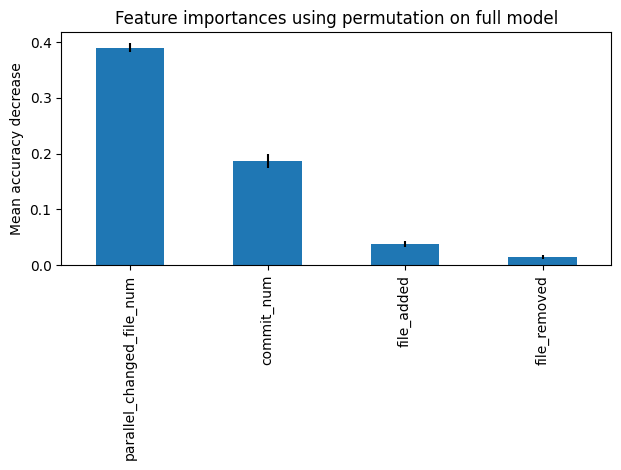

In [ ]:
permu = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

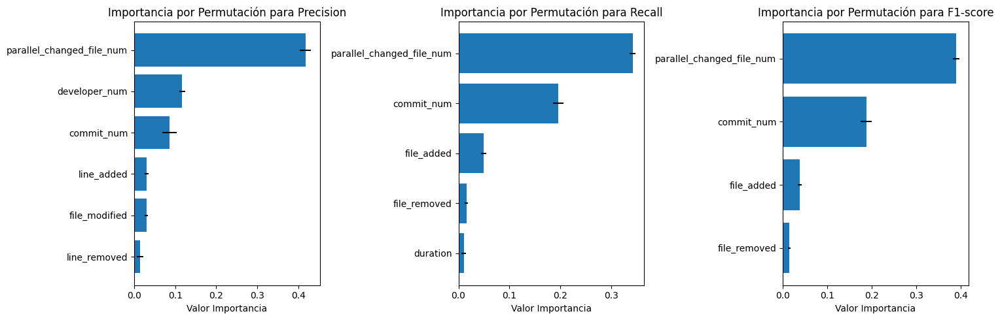

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_ada = {}

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_ada[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_ada['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.416910,0.013966
5,developer_num,0.116911,0.007177
1,commit_num,0.086595,0.017265
3,line_added,0.030332,0.004930
2,file_modified,0.030216,0.003998
4,line_removed,0.013938,0.007909


In [ ]:
results_global_ada['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.341541,0.005634
1,commit_num,0.196267,0.010142
2,file_added,0.049386,0.004590
3,file_removed,0.015454,0.003319
4,duration,0.010397,0.004838


In [ ]:
results_global_ada['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.389896,0.007849
1,commit_num,0.187427,0.012383
2,file_added,0.038042,0.004841
3,file_removed,0.014342,0.003269


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_ada, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 34617 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 34617 values
  -> model_class       : sklearn.ensemble._weight_boosting.AdaBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7b2570ce4940> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.483, mean = 0.491, max = 0.507
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.504, mean = -0.42, max = 0.507
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

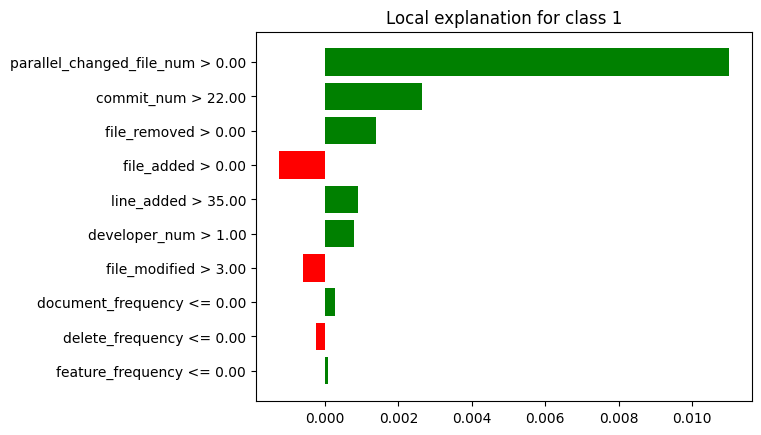

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                 file_added        4  Negativo
4                 line_added        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'line_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         -         -       -         -       5   
3              file_modified         4  Negativo       4  Negativo       -   
4                 commit_num         2  Positivo       2  Positivo       2   
5              developer_num         5  Positivo       5  Positivo       -   
6                 file_added         -         -       -         -       4   
7               line_removed         3  Positivo       3  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5         -  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "file_modified", "developer_num", "file_removed", "file_added", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_removed                      3  Positivo       3  Positivo       -   
file_modified                     4  Negativo       4  Negativo       -   
developer_num                     5  Positivo       5  Positivo       -   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed                      -  
file_modified                     -  
developer_num                     -  
file_removed               Positivo  
file_added                 Negativo  
line_added                 Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

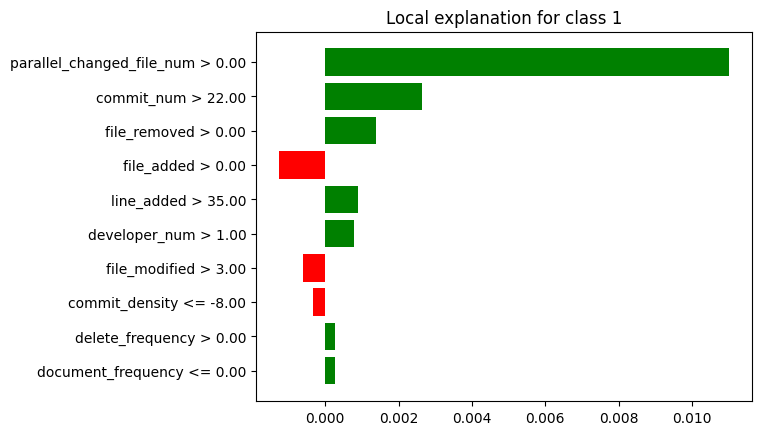

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                 commit_num        3  Positivo
3              file_modified        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                 commit_num        3  Positivo
3              file_modified        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                 file_added        4  Negativo
4                 line_added        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'file_removed', 'commit_num', 'file_modified', 'line_added']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'file_modified', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'line_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         2  Positivo       2  Positivo       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         5  Positivo       5  Positivo       5   
3              file_modified         4  Negativo       4  Negativo       -   
4                 commit_num         3  Positivo       3  Positivo       2   
5                 file_added         -         -       -         -       4   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "commit_num", "file_modified", "line_added", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Positivo       2  Positivo       3   
commit_num                        3  Positivo       3  Positivo       2   
file_modified                     4  Negativo       4  Negativo       -   
line_added                        5  Positivo       5  Positivo       5   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
commit_num                 Positivo  
file_modified                     -  
line_added                 Positivo  
file_added                 Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

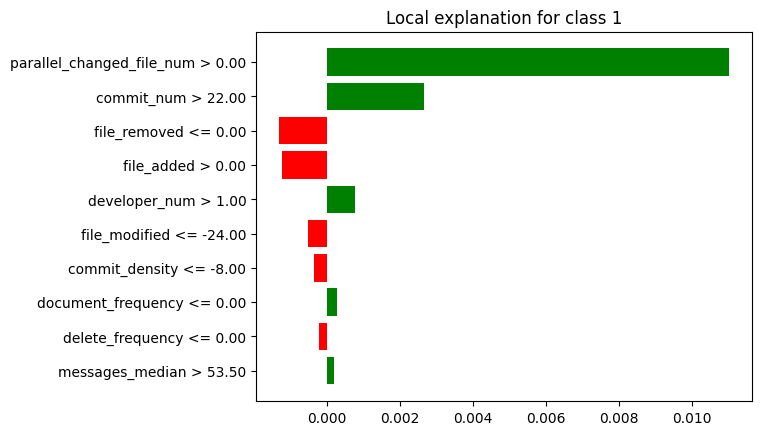

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4            messages_median        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4            messages_median        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3                 file_added        4  Negativo
4              developer_num        5  Positivo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'messages_median']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'messages_median']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'developer_num']
['file_removed', 'messages_median', 'parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1            messages_median         5  Positivo       5  Positivo       -   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         3  Positivo       3  Positivo       5   
5                 file_added         -         -       -         -       4   
6               line_removed         4  Negativo       4  Negativo       -   

             
      Signo  
0  Negativo  
1         -  
2  Positivo  
3  Positivo  
4  Positivo  
5  Negativo  
6         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_removed", "messages_median", "file_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       5   
line_removed                      4  Negativo       4  Negativo       -   
messages_median                   5  Positivo       5  Positivo       -   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
line_removed                      -  
messages_median                   -  
file_removed               Negativo  
file_added                 Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_num', 3), ('file_modified', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('messages_median', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_num', 3), ('file_modified', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('messages_median', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_removed', 3), ('file_added', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('file_removed', 3), ('commit_num', 2), ('line_added', 5), ('file_added', 4), ('parallel_changed_file_num', 1)

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.5      2           3.5      2   
file_added                            -      -             -      -   
developer_num                       4.0      2           4.0      2   
commit_num                     2.333333      3      2.333333      3   
file_modified                       4.0      2           4.0      2   
line_added                          5.0      1           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_median                     5.0      1           5.0      1   
file_removed                        2.0      1           2.0      1   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                          -      -  
file_added                          4.0      3  
developer_num                       5.0      1  
commit_num                          2.0      3  
file_modified                         -      -  
line_added                          5.0      2  
parallel_changed_file_num           1.0      3  
messages_median                       -      -  
file_removed                        3.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vp[("General", "Conteo Total")] = df_resumen_ada_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.5      2           3.5      2   
file_added                            -      -             -      -   
developer_num                       4.0      2           4.0      2   
commit_num                     2.333333      3      2.333333      3   
file_modified                       4.0      2           4.0      2   
line_added                          5.0      1           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_median                     5.0      1           5.0      1   
file_removed                        2.0      1           2.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                          -      -  3.500000            4  
file_added                          4.0      3  4.000000            3  
developer_num                       5.0      1  4.333333            5  
commit_num                          2.0      3  2.222222            9  
file_modified                         -      -  4.000000            4  
line_added                          5.0      2  5.000000            4  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_median                       -      -  5.000000            2  
file_removed                        3.0      3  2.333333            5

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vp[("General", "Peso Conteo")] = df_resumen_ada_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vp[("General", "Puntaje")] = df_resumen_ada_vp[("General", "Peso Rango")] + df_resumen_ada_vp[("General", "Peso Conteo")]
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.5      2           3.5      2   
file_added                            -      -             -      -   
developer_num                       4.0      2           4.0      2   
commit_num                     2.333333      3      2.333333      3   
file_modified                       4.0      2           4.0      2   
line_added                          5.0      1           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_median                     5.0      1           5.0      1   
file_removed                        2.0      1           2.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                          -      -     4.0            4  
file_added                          4.0      3     7.0            3  
developer_num                       5.0      1     5.0            5  
commit_num                          2.0      3     2.0            9  
file_modified                         -      -     6.0            4  
line_added                          5.0      2     8.0            4  
parallel_changed_file_num           1.0      3     1.0            9  
messages_median                       -      -     9.0            2  
file_removed                        3.0      3     3.0            5

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vp = df_resumen_ada_vp[new_columns]

In [ ]:
df_resumen_ada_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vp[(tech, "Ranking Medio")] = df_resumen_ada_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.33      3   
file_removed                  3.0            5          2.00      1   
line_removed                  4.0            4          3.50      2   
developer_num                 5.0            5          4.00      2   
file_modified                 6.0            4          4.00      2   
file_added                    7.0            3             -      -   
line_added                    8.0            4          5.00      1   
messages_median               9.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.00      3  
file_removed                       2.00      1          3.00      3  
line_removed                       3.50      2             -      -  
developer_num                      4.00      2          5.00      1  
file_modified                      4.00      2             -      -  
file_added                            -      -          4.00      3  
line_added                         5.00      1          5.00      2  
messages_median                    5.00      1             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

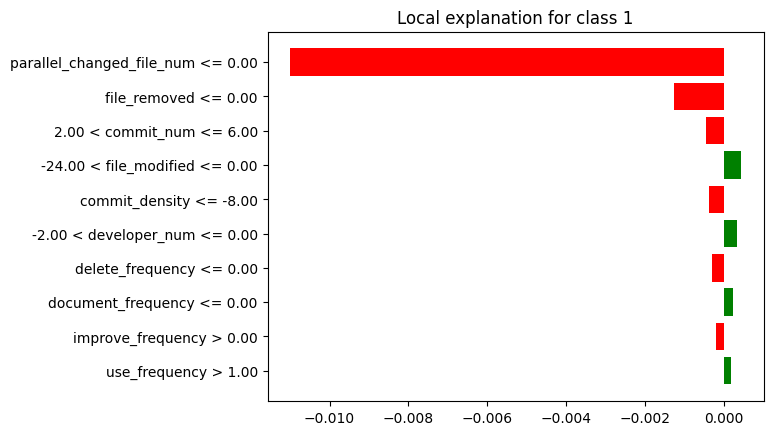

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[2, 'Variable'] = 'commit_num'
lime_vn_df_max.at[3, 'Variable'] = 'file_modified'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1          improve_frequency        2  Negativo
2                 commit_num        3  Negativo
3              developer_num        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1          improve_frequency        2  Negativo
2                 commit_num        3  Negativo
3              developer_num        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Negativo
2                 commit_num        3  Negativo
3              file_modified        4  Positivo
4             commit_density        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'improve_frequency', 'commit_num', 'developer_num', 'duration']
['parallel_changed_file_num', 'improve_frequency', 'commit_num', 'developer_num', 'duration']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'file_modified', 'commit_density']
['file_removed', 'parallel_changed_file_num', 'improve_frequency', 'file_modified', 'commit_num', 'commit_density', 'developer_num', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       2   
1  parallel_changed_file_num         1  Negativo       1  Negativo       1   
2          improve_frequency         2  Negativo       2  Negativo       -   
3              file_modified         -         -       -         -       4   
4                 commit_num         3  Negativo       3  Negativo       3   
5             commit_density         -         -       -         -       5   
6              developer_num         4  Negativo       4  Negativo       -   
7                   duration         5  Negativo       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3  Positivo  
4  Negativo  
5  Negativo  
6         -  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "improve_frequency","commit_num", "developer_num", "duration", "file_removed", "file_modified", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
improve_frequency                 2  Negativo       2  Negativo       -   
commit_num                        3  Negativo       3  Negativo       3   
developer_num                     4  Negativo       4  Negativo       -   
duration                          5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       2   
file_modified                     -         -       -         -       4   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
improve_frequency                 -  
commit_num                 Negativo  
developer_num                     -  
duration                          -  
file_removed               Negativo  
file_modified              Positivo  
commit_density             Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

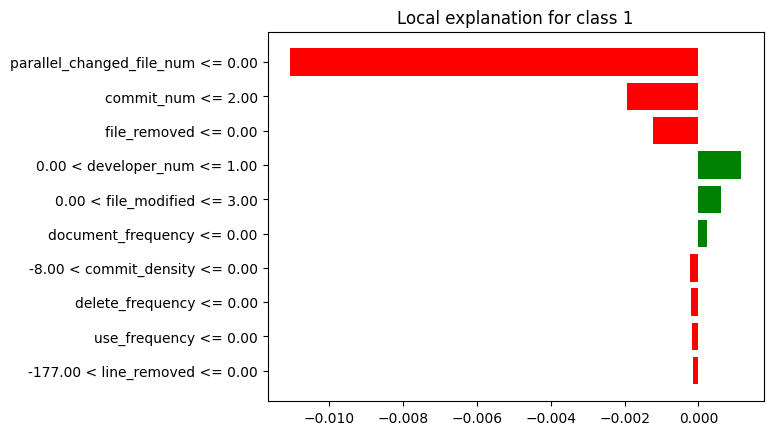

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[3, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[4, 'Variable'] = 'file_modified'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_added']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'file_modified']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Negativo       1  Negativo       1   
2              file_modified         -         -       -         -       5   
3                 commit_num         2  Negativo       2  Negativo       2   
4              developer_num         3  Positivo       3  Positivo       4   
5                 file_added         5  Negativo       5  Negativo       -   
6               line_removed         4  Positivo       4  Positivo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Positivo  
3  Negativo  
4  Positivo  
5         -  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_removed", "file_added", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       3  Positivo       4   
line_removed                      4  Positivo       4  Positivo       -   
file_added                        5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       3   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
line_removed                      -  
file_added                        -  
file_removed               Negativo  
file_modified              Positivo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

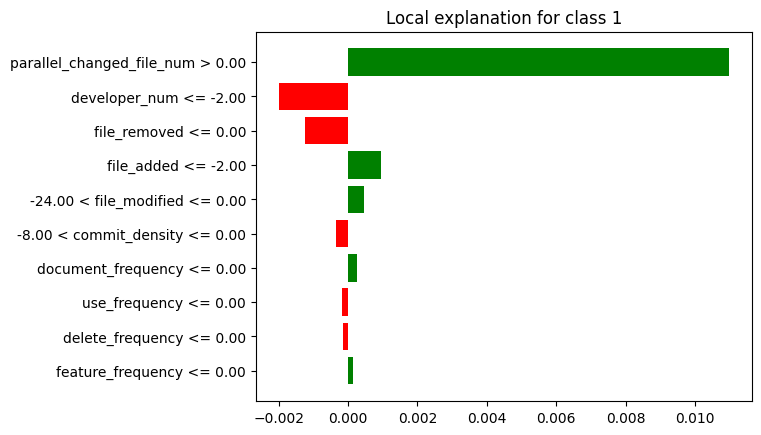

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[4, 'Variable'] = 'file_modified'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1            messages_median        2  Positivo
2               messages_min        3  Positivo
3              developer_num        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1            messages_median        2  Positivo
2               messages_min        3  Positivo
3              developer_num        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_median', 'messages_min', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'messages_median', 'messages_min', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_added', 'file_modified']
['file_removed', 'messages_median', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'file_added', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1            messages_median         2  Positivo       2  Positivo       -   
2  parallel_changed_file_num         1  Positivo       1  Positivo       1   
3              file_modified         -         -       -         -       5   
4                 commit_num         5  Positivo       5  Positivo       -   
5                 file_added         -         -       -         -       4   
6              developer_num         4  Negativo       4  Negativo       2   
7               messages_min         3  Positivo       3  Positivo       -   

             
      Signo  
0  Negativo  
1         -  
2  Positivo  
3  Positivo  
4         -  
5  Positivo  
6  Negativo  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "messages_median", "messages_min", "developer_num", "commit_num", "file_removed", "file_added", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
messages_median                   2  Positivo       2  Positivo       -   
messages_min                      3  Positivo       3  Positivo       -   
developer_num                     4  Negativo       4  Negativo       2   
commit_num                        5  Positivo       5  Positivo       -   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
messages_median                   -  
messages_min                      -  
developer_num              Negativo  
commit_num                        -  
file_removed               Negativo  
file_added                 Positivo  
file_modified              Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('improve_frequency', 2), ('commit_num', 3), ('developer_num', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('messages_median', 2), ('messages_min', 3), ('developer_num', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('improve_frequency', 2), ('commit_num', 3), ('developer_num', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('messages_median', 2), ('messages_min', 3), ('developer_num', 4), ('commit_num', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('file_removed', 2), ('file_modified', 4), ('commit_density', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_removed', 3), ('file_modified', 5), ('parallel_changed_

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1           5.0      1   
line_removed                        4.0      1           4.0      1   
file_added                          5.0      1           5.0      1   
developer_num                  3.666667      3      3.666667      3   
messages_min                        3.0      1           3.0      1   
commit_num                     3.333333      3      3.333333      3   
commit_density                        -      -             -      -   
file_modified                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
improve_frequency                   2.0      1           2.0      1   
messages_median                     2.0      1           2.0      1   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
line_removed                          -      -  
file_added                          4.0      1  
developer_num                       3.0      2  
messages_min                          -      -  
commit_num                          2.5      2  
commit_density                      5.0      1  
file_modified                  4.666667      3  
parallel_changed_file_num           1.0      3  
improve_frequency                     -      -  
messages_median                       -      -  
file_removed                   2.666667      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vn[("General", "Conteo Total")] = df_resumen_ada_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1           5.0      1   
line_removed                        4.0      1           4.0      1   
file_added                          5.0      1           5.0      1   
developer_num                  3.666667      3      3.666667      3   
messages_min                        3.0      1           3.0      1   
commit_num                     3.333333      3      3.333333      3   
commit_density                        -      -             -      -   
file_modified                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
improve_frequency                   2.0      1           2.0      1   
messages_median                     2.0      1           2.0      1   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  5.000000            2  
line_removed                          -      -  4.000000            2  
file_added                          4.0      1  4.666667            3  
developer_num                       3.0      2  3.444444            8  
messages_min                          -      -  3.000000            2  
commit_num                          2.5      2  3.055556            8  
commit_density                      5.0      1  5.000000            1  
file_modified                  4.666667      3  4.666667            3  
parallel_changed_file_num           1.0      3  1.000000            9  
improve_frequency                     -      -  2.000000            2  
messages_median                       -      -  2.000000            2  
file_removed                   2.666667      3  2.666667            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vn[("General", "Peso Conteo")] = df_resumen_ada_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vn[("General", "Puntaje")] = df_resumen_ada_vn[("General", "Peso Rango")] + df_resumen_ada_vn[("General", "Peso Conteo")]
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            5.0      1           5.0      1   
line_removed                        4.0      1           4.0      1   
file_added                          5.0      1           5.0      1   
developer_num                  3.666667      3      3.666667      3   
messages_min                        3.0      1           3.0      1   
commit_num                     3.333333      3      3.333333      3   
commit_density                        -      -             -      -   
file_modified                         -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
improve_frequency                   2.0      1           2.0      1   
messages_median                     2.0      1           2.0      1   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -    11.0            2  
line_removed                          -      -    10.0            2  
file_added                          4.0      1     8.0            3  
developer_num                       3.0      2     4.0            8  
messages_min                          -      -     7.0            2  
commit_num                          2.5      2     2.0            8  
commit_density                      5.0      1    12.0            1  
file_modified                  4.666667      3     8.0            3  
parallel_changed_file_num           1.0      3     1.0            9  
improve_frequency                     -      -     5.0            2  
messages_median                       -      -     5.0            2  
file_removed                   2.666667      3     3.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vn = df_resumen_ada_vn[new_columns]

In [ ]:
df_resumen_ada_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vn[(tech, "Ranking Medio")] = df_resumen_ada_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          3.33      3   
file_removed                  3.0            3             -      -   
developer_num                 4.0            8          3.67      3   
improve_frequency             5.0            2          2.00      1   
messages_median               5.0            2          2.00      1   
messages_min                  7.0            2          3.00      1   
file_added                    8.0            3          5.00      1   
file_modified                 8.0            3             -      -   
line_removed                 10.0            2          4.00      1   
duration                     11.0            2          5.00      1   
commit_density               12.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.33      3          2.50      2  
file_removed                          -      -          2.67      3  
developer_num                      3.67      3          3.00      2  
improve_frequency                  2.00      1             -      -  
messages_median                    2.00      1             -      -  
messages_min                       3.00      1             -      -  
file_added                         5.00      1          4.00      1  
file_modified                         -      -          4.67      3  
line_removed                       4.00      1             -      -  
duration                           5.00      1             -      -  
commit_density                        -      -          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

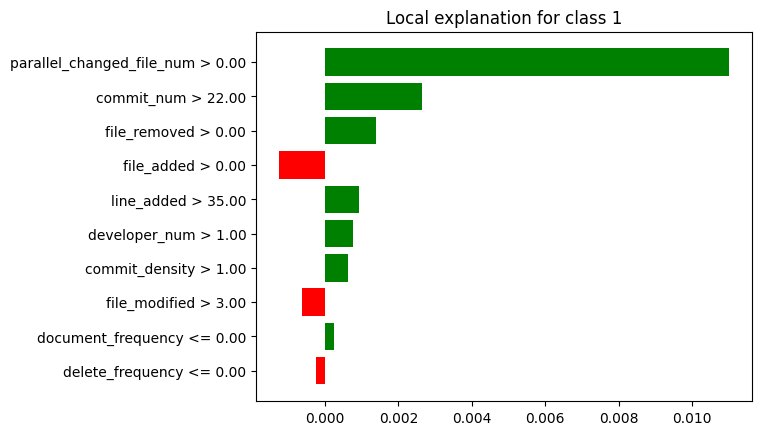

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3                 line_added        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3                 line_added        4  Positivo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Positivo
3                 file_added        4  Negativo
4                 line_added        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_removed', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'line_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'file_added', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         4  Positivo       4  Positivo       5   
3              file_modified         5  Negativo       5  Negativo       -   
4                 commit_num         2  Positivo       2  Positivo       2   
5                 file_added         -         -       -         -       4   
6               line_removed         3  Positivo       3  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "line_added", "file_modified", "file_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_removed                      3  Positivo       3  Positivo       -   
line_added                        4  Positivo       4  Positivo       5   
file_modified                     5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed                      -  
line_added                 Positivo  
file_modified                     -  
file_removed               Positivo  
file_added                 Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

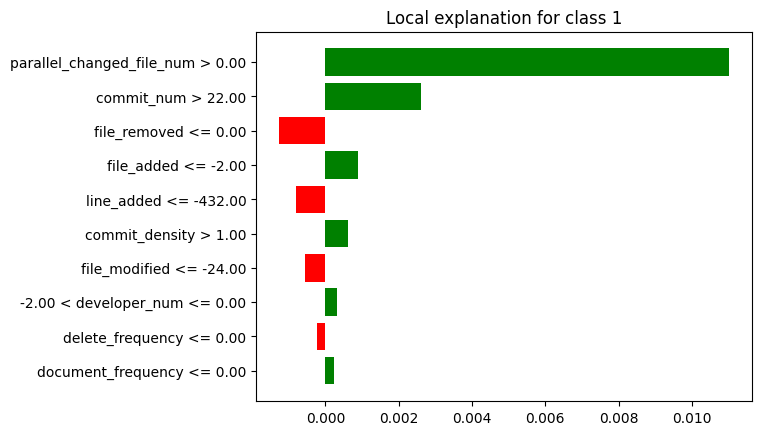

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'file_added', 'developer_num', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_added', 'developer_num', 'line_added']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_added', 'line_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         5  Negativo       5  Negativo       5   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         4  Positivo       4  Positivo       -   
5                 file_added         3  Positivo       3  Positivo       4   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3  Positivo  
4         -  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "file_added", "developer_num", "line_added",  "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
file_added                        3  Positivo       3  Positivo       4   
developer_num                     4  Positivo       4  Positivo       -   
line_added                        5  Negativo       5  Negativo       5   
file_removed                      -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
file_added                 Positivo  
developer_num                     -  
line_added                 Negativo  
file_removed               Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

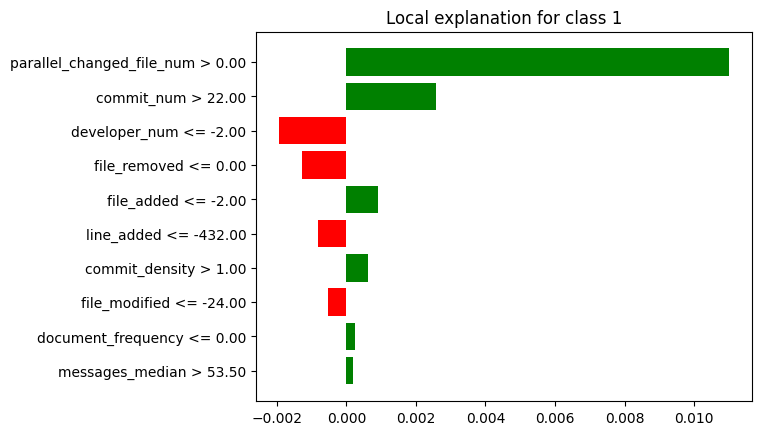

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_added', 'line_added']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         5  Negativo       5  Negativo       -   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         3  Negativo       3  Negativo       3   
5                 file_added         4  Positivo       4  Positivo       5   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Positivo  
4  Negativo  
5  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_added", "line_added", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Negativo       3  Negativo       3   
file_added                        4  Positivo       4  Positivo       5   
line_added                        5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
file_added                 Positivo  
line_added                        -  
file_removed               Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('developer_num', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 3), ('developer_num', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_added', 4), ('line_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 5), ('file_removed', 3), ('file_added', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('file_added', 4), ('line_added', 5), ('file_removed', 3), ('parallel_changed_file_num', 1), ('commit_num', 2), ('d

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
file_added                          3.5      2           3.5      2   
developer_num                       3.5      2           3.5      2   
commit_num                          2.0      3           2.0      3   
file_modified                       5.0      1           5.0      1   
line_added                     4.666667      3      4.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                          -      -  
file_added                     4.333333      3  
developer_num                       3.0      1  
commit_num                          2.0      3  
file_modified                         -      -  
line_added                          5.0      2  
parallel_changed_file_num           1.0      3  
file_removed                   3.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fp[("General", "Conteo Total")] = df_resumen_ada_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
file_added                          3.5      2           3.5      2   
developer_num                       3.5      2           3.5      2   
commit_num                          2.0      3           2.0      3   
file_modified                       5.0      1           5.0      1   
line_added                     4.666667      3      4.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                          -      -  3.000000            2  
file_added                     4.333333      3  3.777778            7  
developer_num                       3.0      1  3.333333            5  
commit_num                          2.0      3  2.000000            9  
file_modified                         -      -  5.000000            2  
line_added                          5.0      2  4.777778            8  
parallel_changed_file_num           1.0      3  1.000000            9  
file_removed                   3.333333      3  3.333333            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fp[("General", "Peso Conteo")] = df_resumen_ada_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fp[("General", "Puntaje")] = df_resumen_ada_fp[("General", "Peso Rango")] + df_resumen_ada_fp[("General", "Peso Conteo")]
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
file_added                          3.5      2           3.5      2   
developer_num                       3.5      2           3.5      2   
commit_num                          2.0      3           2.0      3   
file_modified                       5.0      1           5.0      1   
line_added                     4.666667      3      4.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                          -      -     6.0            2  
file_added                     4.333333      3     4.0            7  
developer_num                       3.0      1     3.0            5  
commit_num                          2.0      3     2.0            9  
file_modified                         -      -     8.0            2  
line_added                          5.0      2     4.0            8  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                   3.333333      3     6.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fp = df_resumen_ada_fp[new_columns]

In [ ]:
df_resumen_ada_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fp[(tech, "Ranking Medio")] = df_resumen_ada_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.00      3   
developer_num                 3.0            5          3.50      2   
file_added                    4.0            7          3.50      2   
line_added                    4.0            8          4.67      3   
line_removed                  6.0            2          3.00      1   
file_removed                  6.0            3             -      -   
file_modified                 8.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.00      3  
developer_num                      3.50      2          3.00      1  
file_added                         3.50      2          4.33      3  
line_added                         4.67      3          5.00      2  
line_removed                       3.00      1             -      -  
file_removed                          -      -          3.33      3  
file_modified                      5.00      1             -      -

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

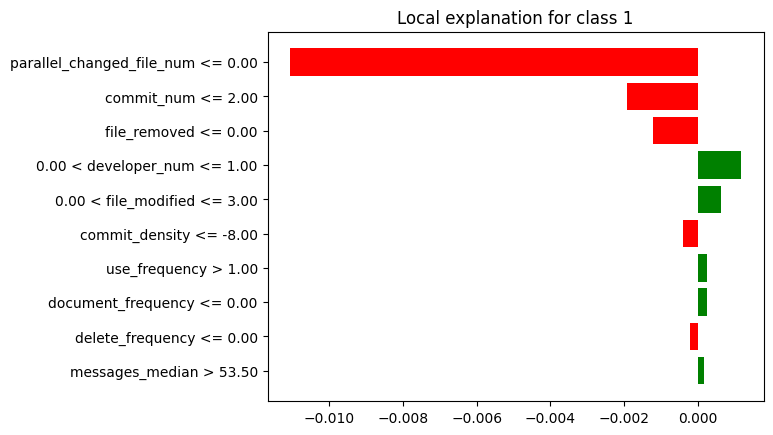

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[3, 'Variable'] = 'developer_num'
lime_fn_df_max.at[4, 'Variable'] = 'file_modified'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              use_frequency        4  Positivo
4             commit_density        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3              use_frequency        4  Positivo
4             commit_density        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Positivo
4              file_modified        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'use_frequency', 'commit_density']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'use_frequency', 'commit_density']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'file_modified']
['file_removed', 'parallel_changed_file_num', 'file_modified', 'commit_num', 'use_frequency', 'commit_density', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Negativo       1  Negativo       1   
2              file_modified         -         -       -         -       5   
3                 commit_num         2  Negativo       2  Negativo       2   
4              use_frequency         4  Positivo       4  Positivo       -   
5             commit_density         5  Negativo       5  Negativo       -   
6              developer_num         3  Positivo       3  Positivo       4   

             
      Signo  
0  Negativo  
1  Negativo  
2  Positivo  
3  Negativo  
4         -  
5         -  
6  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "use_frequency", "commit_density", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       3  Positivo       4   
use_frequency                     4  Positivo       4  Positivo       -   
commit_density                    5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       3   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
use_frequency                     -  
commit_density                    -  
file_removed               Negativo  
file_modified              Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

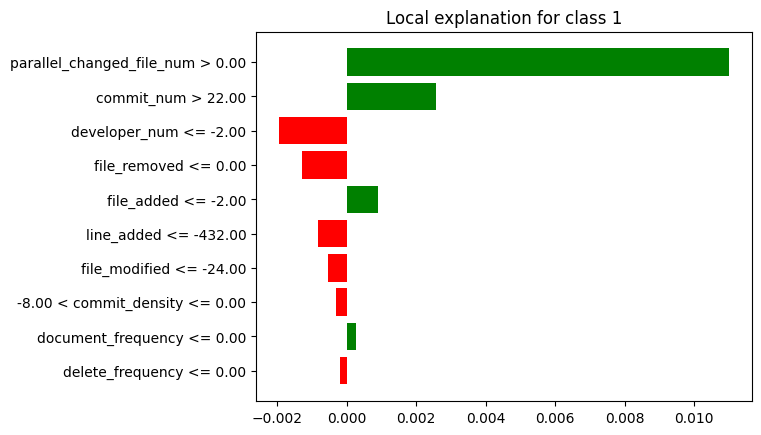

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               file_removed        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'file_added']
['file_removed', 'parallel_changed_file_num', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'file_added']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 line_added         4  Negativo       4  Negativo       -   
3              file_modified         5  Negativo       5  Negativo       -   
4                 commit_num         3  Positivo       3  Positivo       2   
5              developer_num         2  Negativo       2  Negativo       3   
6                 file_added         -         -       -         -       5   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5  Negativo  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "file_modified", "file_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       3   
commit_num                        3  Positivo       3  Positivo       2   
line_added                        4  Negativo       4  Negativo       -   
file_modified                     5  Negativo       5  Negativo       -   
file_removed                      -         -       -         -       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Positivo  
line_added                        -  
file_modified                     -  
file_removed               Negativo  
file_added                 Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

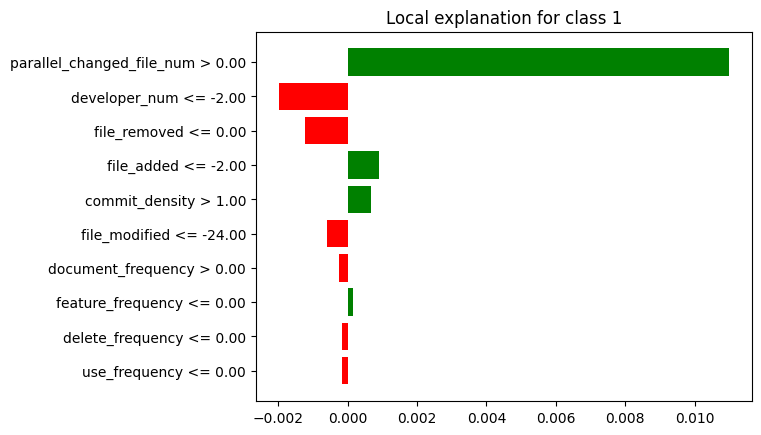

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3                 commit_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3                 commit_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Negativo
3                 file_added        4  Positivo
4             commit_density        5  Positivo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'duration', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'duration', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_added', 'commit_density']
['file_removed', 'parallel_changed_file_num', 'commit_num', 'commit_density', 'developer_num', 'file_added', 'line_removed', 'duration']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               file_removed         -         -       -         -       3   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2                 commit_num         4  Positivo       4  Positivo       -   
3             commit_density         -         -       -         -       5   
4              developer_num         2  Negativo       2  Negativo       2   
5                 file_added         -         -       -         -       4   
6               line_removed         5  Positivo       5  Positivo       -   
7                   duration         3  Negativo       3  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Positivo  
4  Negativo  
5  Positivo  
6         -  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "commit_num", "line_removed", "file_removed", "file_added", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
duration                          3  Negativo       3  Negativo       -   
commit_num                        4  Positivo       4  Positivo       -   
line_removed                      5  Positivo       5  Positivo       -   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   
commit_density                    -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
duration                          -  
commit_num                        -  
line_removed                      -  
file_removed               Negativo  
file_added                 Positivo  
commit_density             Positivo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('use_frequency', 4), ('commit_density', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('commit_num', 4), ('line_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('use_frequency', 4), ('commit_density', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('commit_num', 4), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_removed', 3), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 3), ('commit_num', 2), ('file_removed', 4), ('file_added', 5), ('parallel_changed_file_num', 1

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      1           3.0      1   
line_removed                        5.0      1           5.0      1   
file_added                            -      -             -      -   
developer_num                  2.333333      3      2.333333      3   
commit_density                      5.0      1           5.0      1   
commit_num                          3.0      3           3.0      3   
use_frequency                       4.0      1           4.0      1   
file_modified                       5.0      1           5.0      1   
line_added                          4.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
duration                              -      -  
line_removed                          -      -  
file_added                          4.5      2  
developer_num                       3.0      3  
commit_density                      5.0      1  
commit_num                          2.0      2  
use_frequency                         -      -  
file_modified                       5.0      1  
line_added                            -      -  
parallel_changed_file_num           1.0      3  
file_removed                   3.333333      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fn[("General", "Conteo Total")] = df_resumen_ada_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      1           3.0      1   
line_removed                        5.0      1           5.0      1   
file_added                            -      -             -      -   
developer_num                  2.333333      3      2.333333      3   
commit_density                      5.0      1           5.0      1   
commit_num                          3.0      3           3.0      3   
use_frequency                       4.0      1           4.0      1   
file_modified                       5.0      1           5.0      1   
line_added                          4.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
duration                              -      -  3.000000            2  
line_removed                          -      -  5.000000            2  
file_added                          4.5      2  4.500000            2  
developer_num                       3.0      3  2.555556            9  
commit_density                      5.0      1  5.000000            3  
commit_num                          2.0      2  2.666667            8  
use_frequency                         -      -  4.000000            2  
file_modified                       5.0      1  5.000000            3  
line_added                            -      -  4.000000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
file_removed                   3.333333      3  3.333333            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fn[("General", "Peso Conteo")] = df_resumen_ada_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fn[("General", "Puntaje")] = df_resumen_ada_fn[("General", "Peso Rango")] + df_resumen_ada_fn[("General", "Peso Conteo")]
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
duration                            3.0      1           3.0      1   
line_removed                        5.0      1           5.0      1   
file_added                            -      -             -      -   
developer_num                  2.333333      3      2.333333      3   
commit_density                      5.0      1           5.0      1   
commit_num                          3.0      3           3.0      3   
use_frequency                       4.0      1           4.0      1   
file_modified                       5.0      1           5.0      1   
line_added                          4.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
file_removed                          -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
duration                              -      -     5.0            2  
line_removed                          -      -    11.0            2  
file_added                          4.5      2    10.0            2  
developer_num                       3.0      3     2.0            9  
commit_density                      5.0      1     6.0            3  
commit_num                          2.0      2     3.0            8  
use_frequency                         -      -     8.0            2  
file_modified                       5.0      1     6.0            3  
line_added                            -      -     8.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
file_removed                   3.333333      3     4.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fn = df_resumen_ada_fn[new_columns]

In [ ]:
df_resumen_ada_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fn[(tech, "Ranking Medio")] = df_resumen_ada_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.33      3   
commit_num                    3.0            8          3.00      3   
file_removed                  4.0            3             -      -   
duration                      5.0            2          3.00      1   
commit_density                6.0            3          5.00      1   
file_modified                 6.0            3          5.00      1   
use_frequency                 8.0            2          4.00      1   
line_added                    8.0            2          4.00      1   
file_added                   10.0            2             -      -   
line_removed                 11.0            2          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.33      3          3.00      3  
commit_num                         3.00      3          2.00      2  
file_removed                          -      -          3.33      3  
duration                           3.00      1             -      -  
commit_density                     5.00      1          5.00      1  
file_modified                      5.00      1          5.00      1  
use_frequency                      4.00      1             -      -  
line_added                         4.00      1             -      -  
file_added                            -      -          4.50      2  
line_removed                       5.00      1             -      -

## **RUSBoost:**

**FEATURE IMPORTANCE**

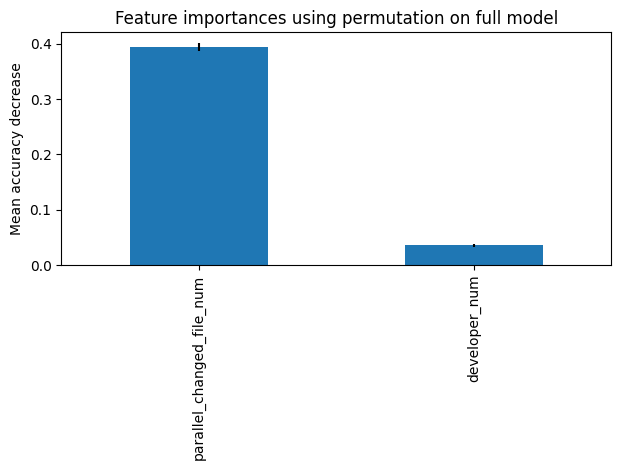

In [ ]:
permu = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

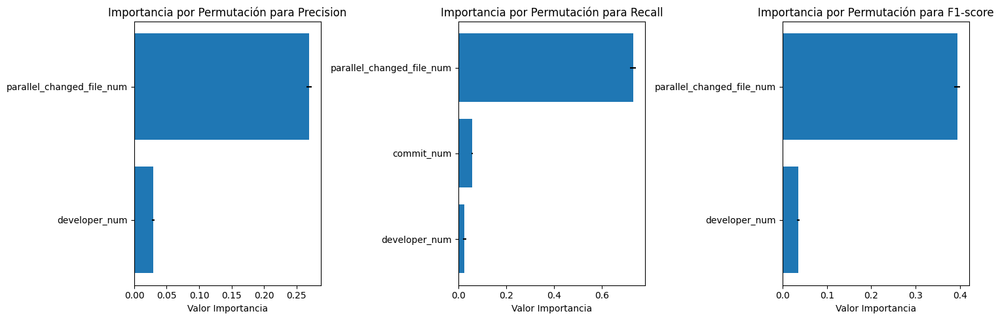

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rus = {}

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rus[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rus['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.269595,0.004505
1,developer_num,0.029331,0.001836


In [ ]:
results_global_rus['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.731711,0.012981
1,commit_num,0.057325,0.003476
2,developer_num,0.025662,0.005965


In [ ]:
results_global_rus['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.394088,0.006684
1,developer_num,0.035560,0.002672


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rus, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 34617 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 34617 values
  -> model_class       : imblearn.ensemble._weight_boosting.RUSBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7b2570ce4940> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.365, mean = 0.42, max = 0.618
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.618, mean = -0.348, max = 0.61
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

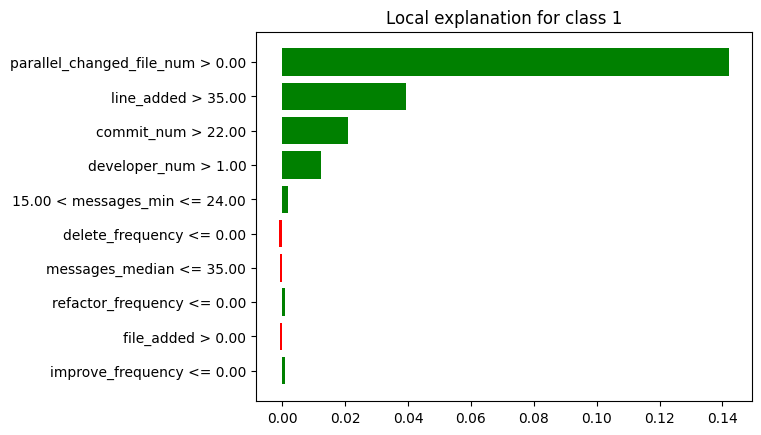

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)
lime_vp_df_max.at[4, 'Variable'] = 'messages_min'

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                 line_added         2  Positivo       2  Positivo       2   
2                 commit_num         3  Positivo       3  Positivo       3   
3              developer_num         4  Positivo       4  Positivo       4   
4               messages_min         5  Negativo       5  Negativo       5   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_added", "commit_num", "developer_num", "messages_min"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_added                        2  Positivo       2  Positivo       2   
commit_num                        3  Positivo       3  Positivo       3   
developer_num                     4  Positivo       4  Positivo       4   
messages_min                      5  Negativo       5  Negativo       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_added                 Positivo  
commit_num                 Positivo  
developer_num              Positivo  
messages_min               Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

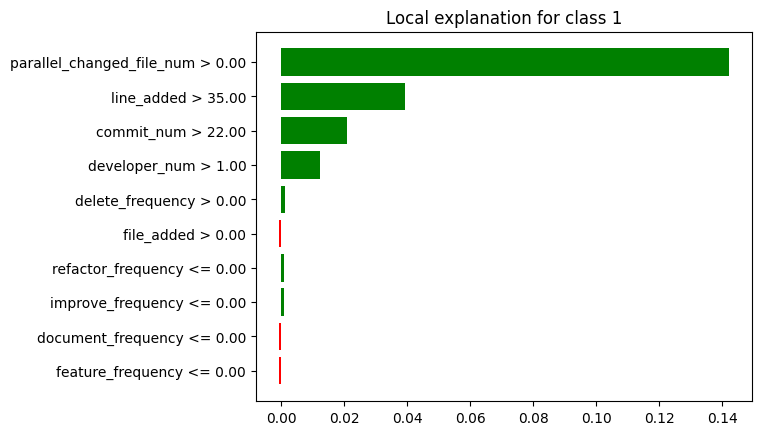

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4           delete_frequency        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         2  Positivo       2  Positivo       2   
3                 commit_num         3  Positivo       3  Positivo       3   
4              developer_num         4  Positivo       4  Positivo       4   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Positivo  
5         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_added", "commit_num", "developer_num", "messages_min", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_added                        2  Positivo       2  Positivo       2   
commit_num                        3  Positivo       3  Positivo       3   
developer_num                     4  Positivo       4  Positivo       4   
messages_min                      5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_added                 Positivo  
commit_num                 Positivo  
developer_num              Positivo  
messages_min                      -  
delete_frequency           Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

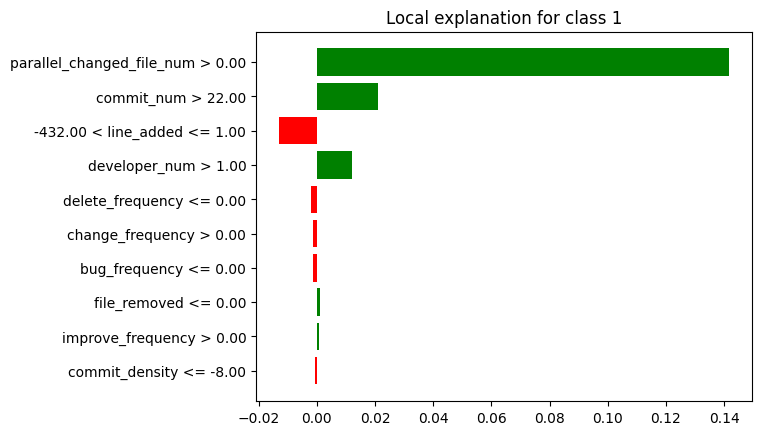

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[2, 'Variable'] = 'line_added'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Negativo
3              developer_num        4  Positivo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'line_added', 'developer_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         4  Negativo       4  Negativo       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         3  Positivo       3  Positivo       4   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3  Positivo  
4  Positivo  
5         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "messages_min", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       4   
line_added                        4  Negativo       4  Negativo       3   
messages_min                      5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Positivo  
line_added                 Negativo  
messages_min                      -  
delete_frequency           Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('messages_min', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('messages_min', 5)], 'Lime': [('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('co

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      3           5.0      3   
developer_num                  3.666667      3      3.666667      3   
commit_num                     2.666667      3      2.666667      3   
line_added                     2.666667      3      2.666667      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
messages_min                   5.000000      1  
developer_num                  4.000000      3  
commit_num                     2.666667      3  
line_added                     2.333333      3  
delete_frequency               5.000000      2  
parallel_changed_file_num      1.000000      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vp[("General", "Conteo Total")] = df_resumen_rus_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      3           5.0      3   
developer_num                  3.666667      3      3.666667      3   
commit_num                     2.666667      3      2.666667      3   
line_added                     2.666667      3      2.666667      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
messages_min                   5.000000      1  5.000000            7  
developer_num                  4.000000      3  3.777778            9  
commit_num                     2.666667      3  2.666667            9  
line_added                     2.333333      3  2.555556            9  
delete_frequency               5.000000      2  5.000000            2  
parallel_changed_file_num      1.000000      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vp[("General", "Peso Conteo")] = df_resumen_rus_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vp[("General", "Puntaje")] = df_resumen_rus_vp[("General", "Peso Rango")] + df_resumen_rus_vp[("General", "Peso Conteo")]
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      3           5.0      3   
developer_num                  3.666667      3      3.666667      3   
commit_num                     2.666667      3      2.666667      3   
line_added                     2.666667      3      2.666667      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
messages_min                   5.000000      1     5.0            7  
developer_num                  4.000000      3     4.0            9  
commit_num                     2.666667      3     3.0            9  
line_added                     2.333333      3     2.0            9  
delete_frequency               5.000000      2     6.0            2  
parallel_changed_file_num      1.000000      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vp = df_resumen_rus_vp[new_columns]

In [ ]:
df_resumen_rus_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vp[(tech, "Ranking Medio")] = df_resumen_rus_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
line_added                    2.0            9          2.67      3   
commit_num                    3.0            9          2.67      3   
developer_num                 4.0            9          3.67      3   
messages_min                  5.0            7          5.00      3   
delete_frequency              6.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
line_added                         2.67      3          2.33      3  
commit_num                         2.67      3          2.67      3  
developer_num                      3.67      3          4.00      3  
messages_min                       5.00      3          5.00      1  
delete_frequency                      -      -          5.00      2

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

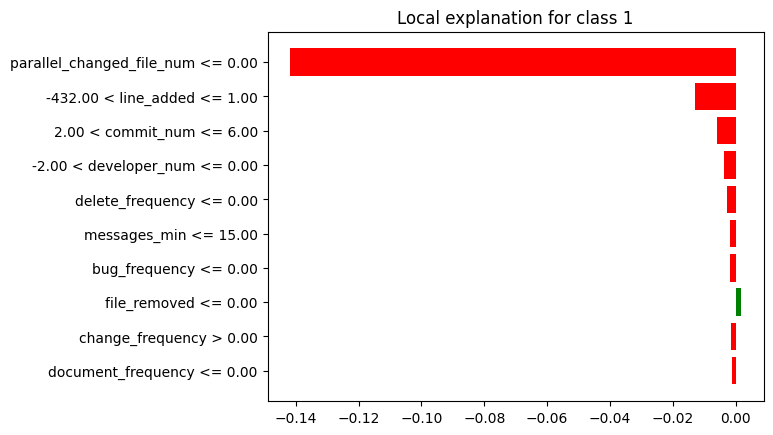

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[1, 'Variable'] = 'line_added'
lime_vn_df_max.at[2, 'Variable'] = 'commit_num'
lime_vn_df_max.at[3, 'Variable'] = 'developer_num'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3               messages_min        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3               messages_min        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 line_added        2  Negativo
2                 commit_num        3  Negativo
3              developer_num        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'commit_num', 'messages_min', 'line_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'messages_min', 'line_added']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         5  Negativo       5  Negativo       2   
3                 commit_num         3  Negativo       3  Negativo       3   
4              developer_num         2  Negativo       2  Negativo       4   
5               messages_min         4  Negativo       4  Negativo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Negativo  
3  Negativo  
4  Negativo  
5         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "messages_min", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Negativo       2  Negativo       4   
commit_num                        3  Negativo       3  Negativo       3   
messages_min                      4  Negativo       4  Negativo       -   
line_added                        5  Negativo       5  Negativo       2   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Negativo  
commit_num                 Negativo  
messages_min                      -  
line_added                 Negativo  
delete_frequency           Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

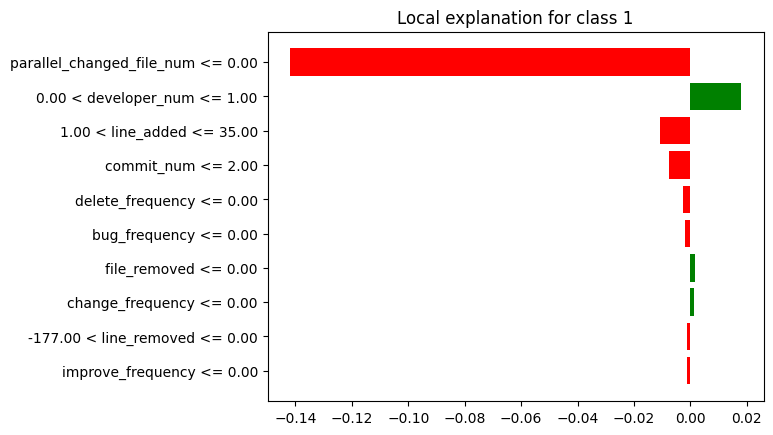

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[1, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[2, 'Variable'] = 'line_added'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 line_added        3  Negativo
3                 commit_num        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'line_added', 'commit_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         4  Negativo       4  Negativo       3   
3                 commit_num         3  Negativo       3  Negativo       4   
4              developer_num         2  Positivo       2  Positivo       2   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Negativo  
3  Negativo  
4  Positivo  
5         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "messages_min", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Positivo       2  Positivo       2   
commit_num                        3  Negativo       3  Negativo       4   
line_added                        4  Negativo       4  Negativo       3   
messages_min                      5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Positivo  
commit_num                 Negativo  
line_added                 Negativo  
messages_min                      -  
delete_frequency           Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

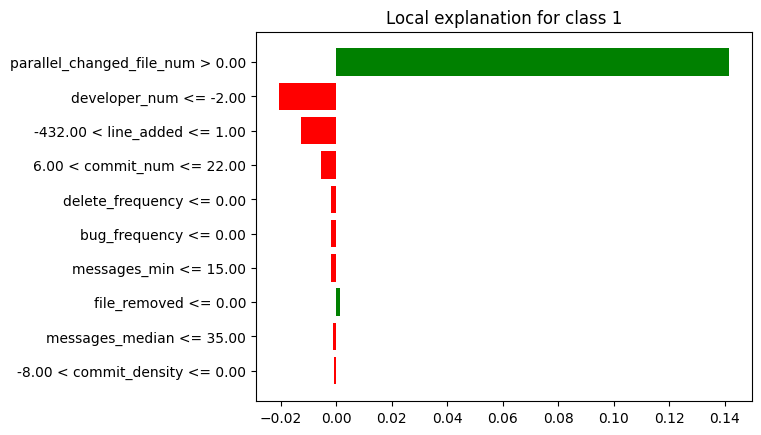

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[2, 'Variable'] = 'line_added'
lime_vn_df_min.at[3, 'Variable'] = 'commit_num'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3               messages_min        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3               messages_min        4  Negativo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 line_added        3  Negativo
3                 commit_num        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'messages_min', 'line_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'messages_min', 'line_added']
['parallel_changed_file_num', 'developer_num', 'line_added', 'commit_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         5  Negativo       5  Negativo       3   
3                 commit_num         3  Negativo       3  Negativo       4   
4              developer_num         2  Negativo       2  Negativo       2   
5               messages_min         4  Negativo       4  Negativo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3  Negativo  
4  Negativo  
5         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "messages_min", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Negativo       3  Negativo       4   
messages_min                      4  Negativo       4  Negativo       -   
line_added                        5  Negativo       5  Negativo       3   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Negativo  
messages_min                      -  
line_added                 Negativo  
delete_frequency           Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('messages_min', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('messages_min', 4), ('line_added', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('messages_min', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('messages_min', 4), ('line_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 4), ('commit_num', 3), ('line_added', 2), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 4), ('line_added', 3), ('delete_frequency', 5), ('parallel_changed_file_num', 1), 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                   4.333333      3      4.333333      3   
developer_num                       2.0      3           2.0      3   
commit_num                          3.0      3           3.0      3   
line_added                     4.666667      3      4.666667      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
messages_min                          -      -  
developer_num                  2.666667      3  
commit_num                     3.666667      3  
line_added                     2.666667      3  
delete_frequency                    5.0      3  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vn[("General", "Conteo Total")] = df_resumen_rus_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                   4.333333      3      4.333333      3   
developer_num                       2.0      3           2.0      3   
commit_num                          3.0      3           3.0      3   
line_added                     4.666667      3      4.666667      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
messages_min                          -      -  4.333333            6  
developer_num                  2.666667      3  2.222222            9  
commit_num                     3.666667      3  3.222222            9  
line_added                     2.666667      3  4.000000            9  
delete_frequency                    5.0      3  5.000000            3  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vn[("General", "Peso Conteo")] = df_resumen_rus_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vn[("General", "Puntaje")] = df_resumen_rus_vn[("General", "Peso Rango")] + df_resumen_rus_vn[("General", "Peso Conteo")]
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                   4.333333      3      4.333333      3   
developer_num                       2.0      3           2.0      3   
commit_num                          3.0      3           3.0      3   
line_added                     4.666667      3      4.666667      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
messages_min                          -      -     5.0            6  
developer_num                  2.666667      3     2.0            9  
commit_num                     3.666667      3     3.0            9  
line_added                     2.666667      3     4.0            9  
delete_frequency                    5.0      3     6.0            3  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vn = df_resumen_rus_vn[new_columns]

In [ ]:
df_resumen_rus_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vn[(tech, "Ranking Medio")] = df_resumen_rus_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.00      3   
commit_num                    3.0            9          3.00      3   
line_added                    4.0            9          4.67      3   
messages_min                  5.0            6          4.33      3   
delete_frequency              6.0            3             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      3          2.67      3  
commit_num                         3.00      3          3.67      3  
line_added                         4.67      3          2.67      3  
messages_min                       4.33      3             -      -  
delete_frequency                      -      -          5.00      3

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

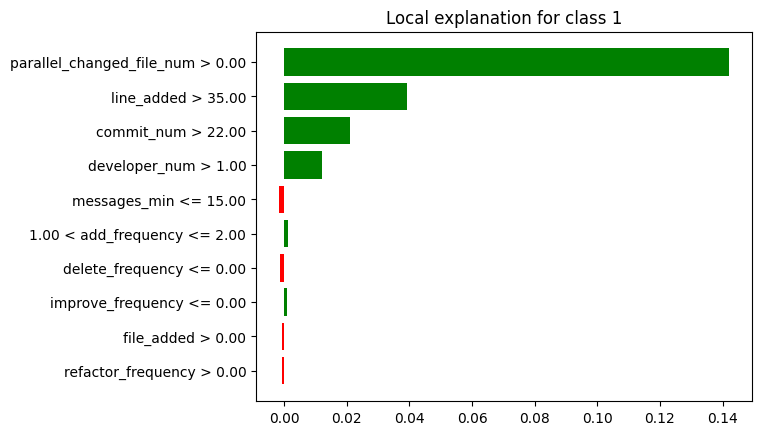

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 line_added        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               messages_min        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']
['parallel_changed_file_num', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                 line_added         2  Positivo       2  Positivo       2   
2                 commit_num         3  Positivo       3  Positivo       3   
3              developer_num         4  Positivo       4  Positivo       4   
4               messages_min         5  Negativo       5  Negativo       5   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_added", "commit_num", "developer_num", "messages_min"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_added                        2  Positivo       2  Positivo       2   
commit_num                        3  Positivo       3  Positivo       3   
developer_num                     4  Positivo       4  Positivo       4   
messages_min                      5  Negativo       5  Negativo       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_added                 Positivo  
commit_num                 Positivo  
developer_num              Positivo  
messages_min               Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

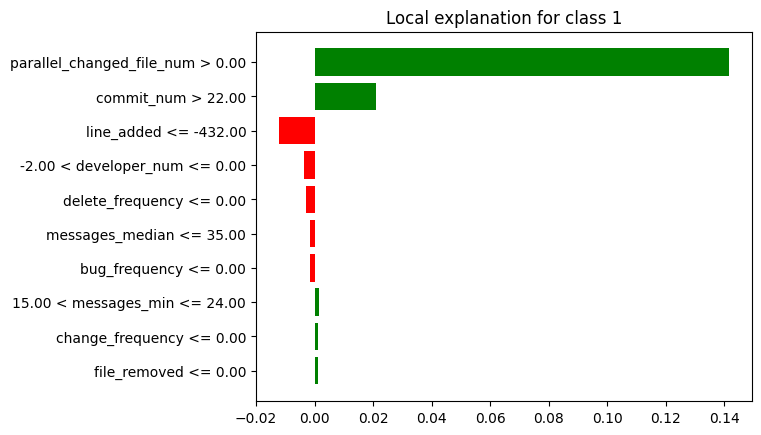

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)
lime_fp_df_mediana.at[3, 'Variable'] = 'developer_num'

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Negativo
3              developer_num        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'line_added', 'developer_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         4  Negativo       4  Negativo       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         3  Positivo       3  Positivo       4   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3  Positivo  
4  Negativo  
5         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "messages_min", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       4   
line_added                        4  Negativo       4  Negativo       3   
messages_min                      5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
line_added                 Negativo  
messages_min                      -  
delete_frequency           Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

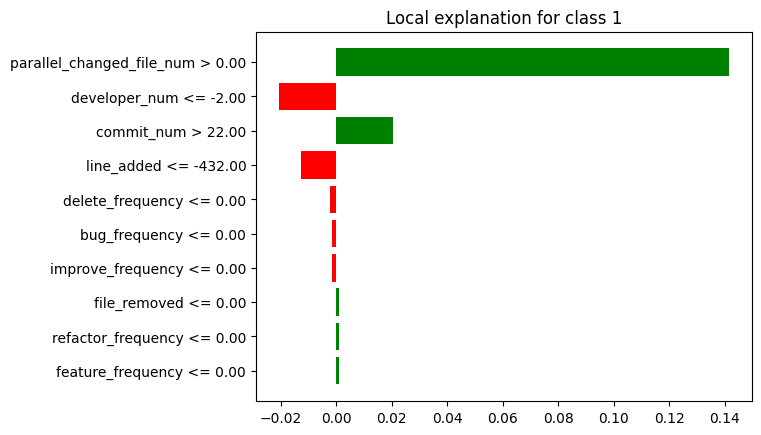

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         4  Negativo       4  Negativo       4   
3                 commit_num         2  Positivo       2  Positivo       3   
4              developer_num         3  Negativo       3  Negativo       2   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3  Positivo  
4  Negativo  
5         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       3   
developer_num                     3  Negativo       3  Negativo       2   
line_added                        4  Negativo       4  Negativo       4   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
line_added                 Negativo  
delete_frequency           Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4)], 'Shapley': [('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4)], 'Lime': [('parallel_changed_file_num', 1), ('line_added', 2), ('commit_num', 3), ('developer_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('line_added', 3), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 2), ('lin

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      2           5.0      2   
developer_num                  3.333333      3      3.333333      3   
commit_num                     2.333333      3      2.333333      3   
line_added                     3.333333      3      3.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
messages_min                   5.000000      1  
developer_num                  3.333333      3  
commit_num                     2.666667      3  
line_added                     3.000000      3  
delete_frequency               5.000000      2  
parallel_changed_file_num      1.000000      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fp[("General", "Conteo Total")] = df_resumen_rus_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      2           5.0      2   
developer_num                  3.333333      3      3.333333      3   
commit_num                     2.333333      3      2.333333      3   
line_added                     3.333333      3      3.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
messages_min                   5.000000      1  5.000000            5  
developer_num                  3.333333      3  3.333333            9  
commit_num                     2.666667      3  2.444444            9  
line_added                     3.000000      3  3.222222            9  
delete_frequency               5.000000      2  5.000000            2  
parallel_changed_file_num      1.000000      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fp[("General", "Peso Conteo")] = df_resumen_rus_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fp[("General", "Puntaje")] = df_resumen_rus_fp[("General", "Peso Rango")] + df_resumen_rus_fp[("General", "Peso Conteo")]
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      2           5.0      2   
developer_num                  3.333333      3      3.333333      3   
commit_num                     2.333333      3      2.333333      3   
line_added                     3.333333      3      3.333333      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
messages_min                   5.000000      1     5.0            5  
developer_num                  3.333333      3     4.0            9  
commit_num                     2.666667      3     2.0            9  
line_added                     3.000000      3     3.0            9  
delete_frequency               5.000000      2     6.0            2  
parallel_changed_file_num      1.000000      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fp = df_resumen_rus_fp[new_columns]

In [ ]:
df_resumen_rus_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fp[(tech, "Ranking Medio")] = df_resumen_rus_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            9          2.33      3   
line_added                    3.0            9          3.33      3   
developer_num                 4.0            9          3.33      3   
messages_min                  5.0            5          5.00      2   
delete_frequency              6.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.67      3  
line_added                         3.33      3          3.00      3  
developer_num                      3.33      3          3.33      3  
messages_min                       5.00      2          5.00      1  
delete_frequency                      -      -          5.00      2

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

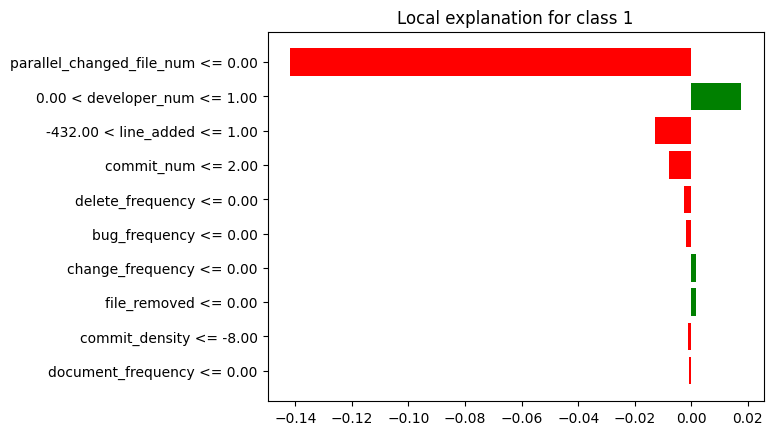

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[1, 'Variable'] = 'developer_num'
lime_fn_df_max.at[2, 'Variable'] = 'line_added'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 line_added        3  Negativo
3                 commit_num        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'line_added', 'commit_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         4  Negativo       4  Negativo       3   
3                 commit_num         3  Negativo       3  Negativo       4   
4              developer_num         2  Positivo       2  Positivo       2   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Negativo  
1  Negativo  
2  Negativo  
3  Negativo  
4  Positivo  
5         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "messages_min", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
developer_num                     2  Positivo       2  Positivo       2   
commit_num                        3  Negativo       3  Negativo       4   
line_added                        4  Negativo       4  Negativo       3   
messages_min                      5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
developer_num              Positivo  
commit_num                 Negativo  
line_added                 Negativo  
messages_min                      -  
delete_frequency           Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

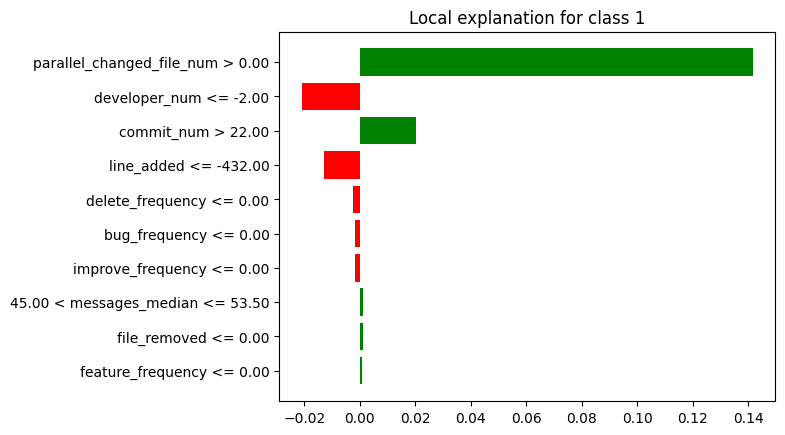

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)


print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         4  Negativo       4  Negativo       4   
3                 commit_num         3  Negativo       3  Negativo       3   
4              developer_num         2  Negativo       2  Negativo       2   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3  Positivo  
4  Negativo  
5         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "messages_min", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Negativo       3  Negativo       3   
line_added                        4  Negativo       4  Negativo       4   
messages_min                      5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Positivo  
line_added                 Negativo  
messages_min                      -  
delete_frequency           Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

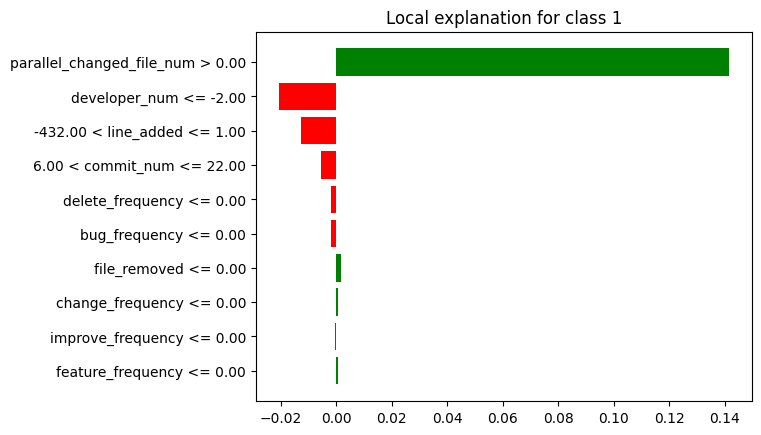

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)
lime_fn_df_min.at[2, 'Variable'] = 'line_added'
lime_fn_df_min.at[3, 'Variable'] = 'commit_num'

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Negativo
3                 line_added        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 line_added        3  Negativo
3                 commit_num        4  Negativo
4           delete_frequency        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_added', 'messages_min']
['parallel_changed_file_num', 'developer_num', 'line_added', 'commit_num', 'delete_frequency']
['parallel_changed_file_num', 'delete_frequency', 'line_added', 'commit_num', 'developer_num', 'messages_min']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1           delete_frequency         -         -       -         -       5   
2                 line_added         4  Negativo       4  Negativo       3   
3                 commit_num         3  Negativo       3  Negativo       4   
4              developer_num         2  Negativo       2  Negativo       2   
5               messages_min         5  Negativo       5  Negativo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3  Negativo  
4  Negativo  
5         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "line_added", "messages_min", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
commit_num                        3  Negativo       3  Negativo       4   
line_added                        4  Negativo       4  Negativo       3   
messages_min                      5  Negativo       5  Negativo       -   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
commit_num                 Negativo  
line_added                 Negativo  
messages_min                      -  
delete_frequency           Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('messages_min', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 4), ('line_added', 3), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('line_added', 4), ('delete_frequency', 5), ('parallel_changed_file_num', 1), 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      3           5.0      3   
developer_num                       2.0      3           2.0      3   
commit_num                          3.0      3           3.0      3   
line_added                          4.0      3           4.0      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
messages_min                          -      -  
developer_num                       2.0      3  
commit_num                     3.666667      3  
line_added                     3.333333      3  
delete_frequency                    5.0      3  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fn[("General", "Conteo Total")] = df_resumen_rus_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      3           5.0      3   
developer_num                       2.0      3           2.0      3   
commit_num                          3.0      3           3.0      3   
line_added                          4.0      3           4.0      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
messages_min                          -      -  5.000000            6  
developer_num                       2.0      3  2.000000            9  
commit_num                     3.666667      3  3.222222            9  
line_added                     3.333333      3  3.777778            9  
delete_frequency                    5.0      3  5.000000            3  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fn[("General", "Peso Conteo")] = df_resumen_rus_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fn[("General", "Puntaje")] = df_resumen_rus_fn[("General", "Peso Rango")] + df_resumen_rus_fn[("General", "Peso Conteo")]
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
messages_min                        5.0      3           5.0      3   
developer_num                       2.0      3           2.0      3   
commit_num                          3.0      3           3.0      3   
line_added                          4.0      3           4.0      3   
delete_frequency                      -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
messages_min                          -      -     5.0            6  
developer_num                       2.0      3     2.0            9  
commit_num                     3.666667      3     3.0            9  
line_added                     3.333333      3     4.0            9  
delete_frequency                    5.0      3     6.0            3  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fn = df_resumen_rus_fn[new_columns]

In [ ]:
df_resumen_rus_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fn[(tech, "Ranking Medio")] = df_resumen_rus_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.00      3   
commit_num                    3.0            9          3.00      3   
line_added                    4.0            9          4.00      3   
messages_min                  5.0            6          5.00      3   
delete_frequency              6.0            3             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.00      3          2.00      3  
commit_num                         3.00      3          3.67      3  
line_added                         4.00      3          3.33      3  
messages_min                       5.00      3             -      -  
delete_frequency                      -      -          5.00      3

## **LOCAL GENERAL:**

Verdadero Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vp, df_resumen_brf_vp, df_resumen_gb_vp, df_resumen_ada_vp, df_resumen_rus_vp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,9,2,9,2,7,2,9,3,9,2,43
developer_num,3,9,5,5,4,7,5,5,4,9,3,35
file_removed,6,4,4,4,7,5,3,5,-,-,4,18
file_modified,4,4,3,5,9,2,6,4,-,-,5,15
file_added,5,3,5,4,6,3,7,3,-,-,6,13
line_removed,8,2,8,1,5,7,4,4,-,-,7,14
commit_density,-,-,-,-,3,2,-,-,-,-,8,2
line_added,-,-,10,1,-,-,8,4,2,9,9,14
messages_min,-,-,8,1,-,-,-,-,5,7,10,8


Verdadero Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vn, df_resumen_brf_vn, df_resumen_gb_vn, df_resumen_ada_vn, df_resumen_rus_vn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,8,1,9,1,9,1,44
commit_num,3,6,2,8,2,6,2,8,3,9,2,37
developer_num,2,7,3,7,3,6,4,8,2,9,3,37
file_removed,6,5,5,4,5,3,3,3,-,-,4,15
file_added,4,6,13,2,6,7,8,3,-,-,5,18
messages_min,5,2,-,-,11,2,7,2,5,6,6,12
line_added,8,3,9,1,10,1,-,-,4,9,7,14
messages_max,9,1,4,2,4,3,-,-,-,-,8,6
improve_frequency,-,-,6,2,8,2,5,2,-,-,9,6
line_removed,-,-,8,2,7,4,10,2,-,-,10,8


Falso Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fp, df_resumen_brf_fp, df_resumen_gb_fp, df_resumen_ada_fp, df_resumen_rus_fp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,9,2,9,2,9,2,9,2,9,2,45
developer_num,3,8,4,5,3,7,3,5,4,9,3,34
file_added,4,5,8,4,4,5,4,7,-,-,4,21
file_removed,4,6,3,6,6,4,6,3,-,-,5,19
line_added,-,-,10,1,-,-,4,8,3,9,6,18
line_removed,7,3,5,3,5,4,6,2,-,-,7,12
file_modified,4,4,9,2,9,1,8,2,-,-,8,9
messages_min,-,-,12,1,7,3,-,-,5,5,9,9
delete_frequency,-,-,-,-,-,-,-,-,6,2,10,2


Falso Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fn, df_resumen_brf_fn, df_resumen_gb_fn, df_resumen_ada_fn, df_resumen_rus_fn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
developer_num,2,9,3,9,2,8,2,9,2,9,2,44
commit_num,3,7,2,8,4,3,3,8,3,9,3,35
file_modified,4,3,4,4,7,4,6,3,-,-,4,14
line_added,9,1,6,4,3,4,8,2,4,9,5,20
messages_min,-,-,-,-,-,-,-,-,5,6,6,6
file_removed,4,2,5,3,8,4,4,3,-,-,6,12
duration,4,5,8,3,6,3,5,2,-,-,8,13
file_added,4,6,10,1,4,9,10,2,-,-,9,18
delete_frequency,-,-,-,-,-,-,-,-,6,3,10,3


# **Resultados:**

**RENDIMIENTO MODELOS:**

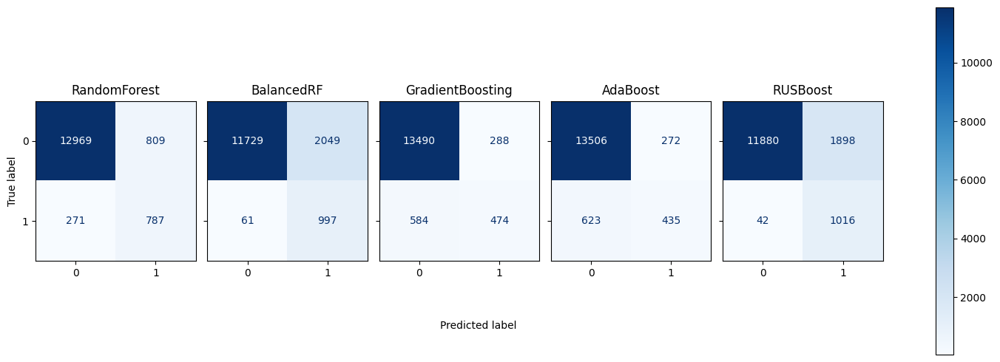

In [ ]:
classifiers = ["RandomForest", "BalancedRF", "GradientBoosting", "AdaBoost", "RUSBoost"]
matrices_confusion = [cm_rf, cm_brf, cm_gb, cm_ada, cm_rus]
class_names = ["0", "1"]

fig, axes = plt.subplots(1, 5, figsize=(15, 5), sharey="row")

for i, (cm, classifier_name) in enumerate(zip(matrices_confusion, classifiers)):

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    disp.plot(ax=axes[i], cmap="Blues")
    axes[i].set_title(classifier_name)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')

plt.tight_layout()
fig.text(0.4, 0.1, "Predicted label", ha="left")
fig.colorbar(disp.im_, ax=axes)
plt.show()

In [ ]:
score_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.926476,0.490307,0.744052,0.590840
1,BalancedRF,0.864073,0.336327,0.928580,0.493701
2,GradientBoosting,0.942875,0.640041,0.456908,0.532736
3,AdaBoost,0.939660,0.617218,0.406180,0.489476
4,RUSBoost,0.857016,0.329438,0.959472,0.490016


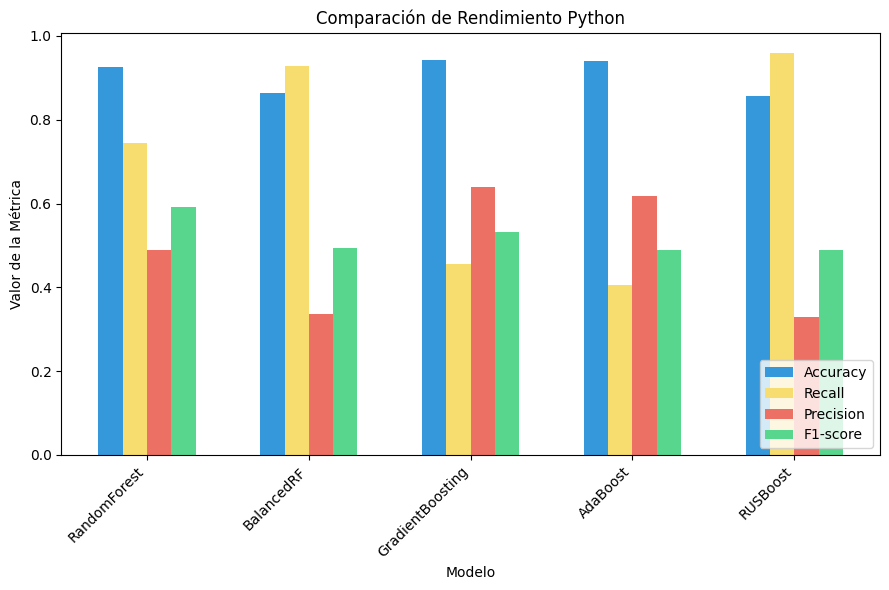

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Python')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

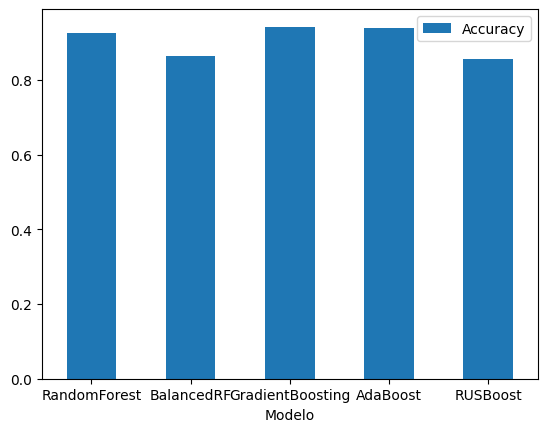

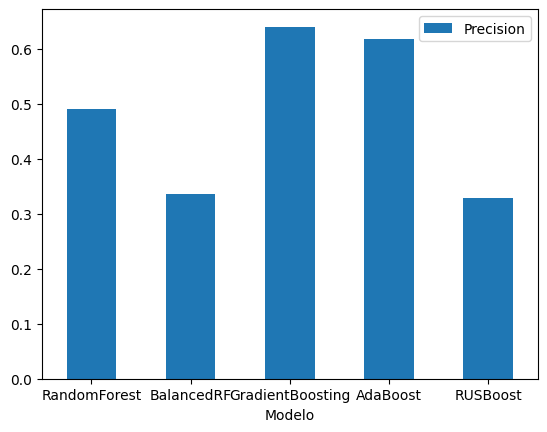

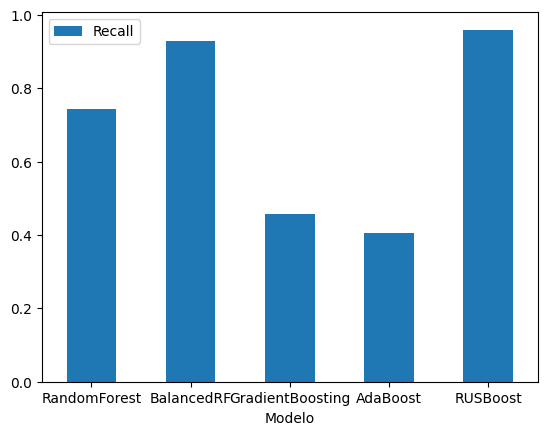

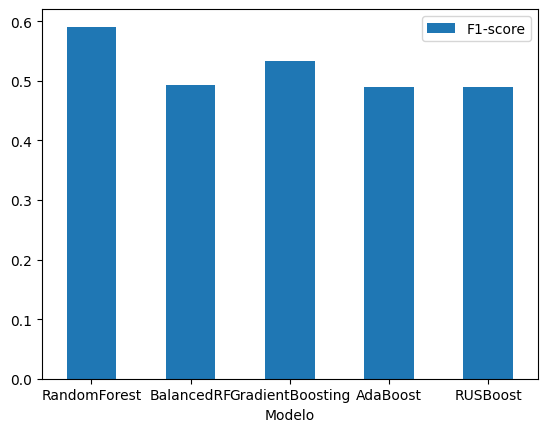

In [ ]:
variables=list(score_result)
variables.pop(0)

for var in variables:
  score_result.plot.bar(x='Modelo', y=var, rot=0)

**RENDIMIENTO INVERSO:**

In [ ]:
score_inv_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.927204,0.979532,0.941283,0.960027
1,BalancedRF,0.857778,0.994826,0.851285,0.917475
2,GradientBoost,0.941224,0.958505,0.979097,0.968692
3,AdaBoost,0.939674,0.955906,0.980258,0.967929
4,RUSBoost,0.869237,0.996477,0.862244,0.924514


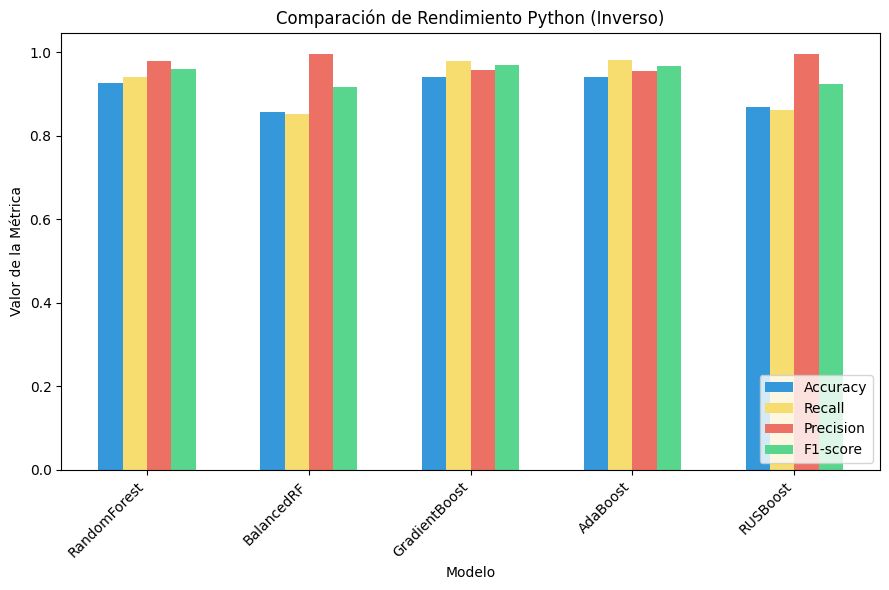

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_inv_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_inv_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Python (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

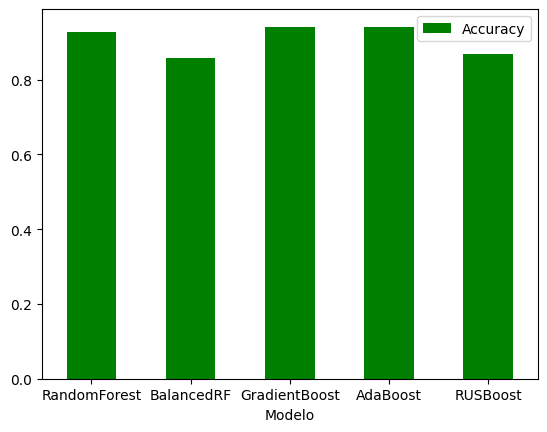

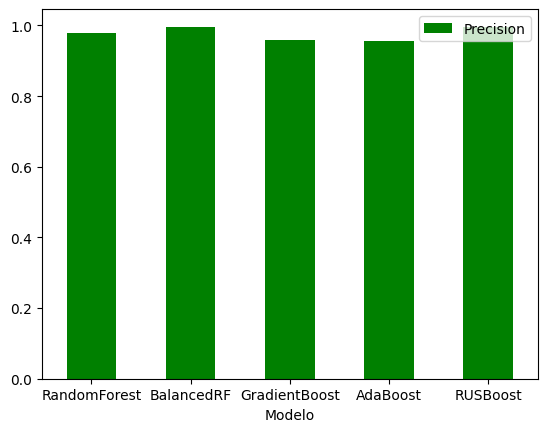

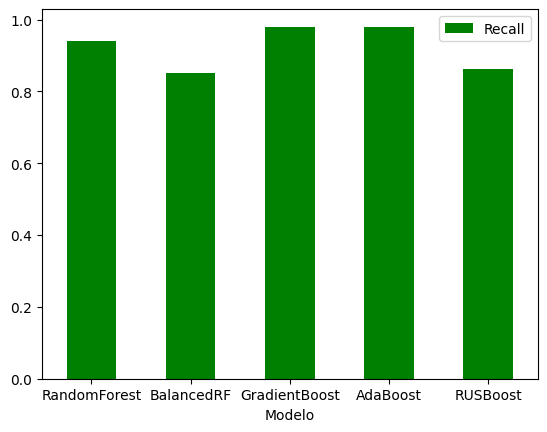

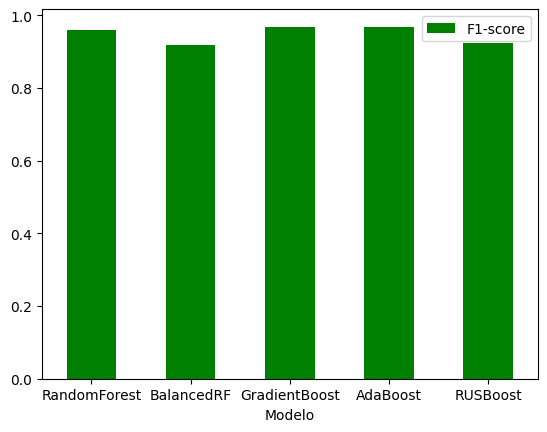

In [ ]:
variables_inv=list(score_inv_result)
variables_inv.pop(0)

for var in variables_inv:
  score_inv_result.plot.bar(x='Modelo', y=var, rot=0, color='green')

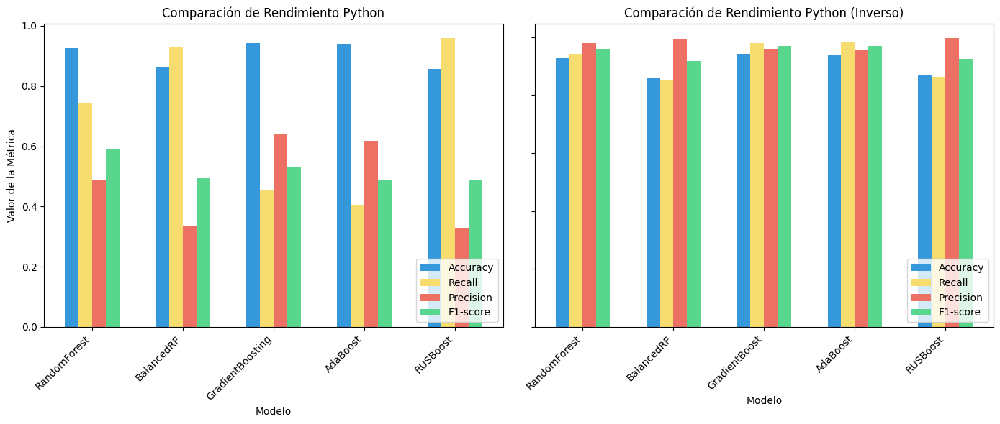

In [ ]:
# Código para la primera gráfica (score_result)
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F', '#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

# Crear una figura con dos subplots, uno a la izquierda y otro a la derecha
plt.figure(figsize=(14, 6))

# Subplot izquierdo para la primera gráfica (score_result)
plt.subplot(1, 2, 1)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Python')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Subplot derecho para la segunda gráfica (score_inv_result)
plt.subplot(1, 2, 2)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_inv_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.title('Comparación de Rendimiento Python (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')
plt.tick_params(labelleft = False)


# Ajustar los subplots para evitar superposiciones
plt.tight_layout()

# Mostrar la figura combinada
plt.show()
